In [ ]:
import pandas as pd
import pandas_datareader as pdr
from datetime import datetime

In [ ]:
df = pd.read_csv('/content/all_commodity_data.csv', parse_dates = ['Price Date'])

<ipython-input-121-51f5fdcba26d>:1: DtypeWarning: Columns (0,6,7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/all_commodity_data.csv', parse_dates = ['Price Date'])


In [ ]:
df.head()

,Sl no.,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Price Date
0,1,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,1500,2000,1750,17 Dec 2023
1,2,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,1500,2000,1750,18 Dec 2023
2,3,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,2500,3000,2700,04 Aug 2023
3,4,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,3000,4000,3500,11 Mar 2024
4,5,Bangalore,"Binny Mill (F&V), Bangalore",Alsandikai,Alsandikai,FAQ,180,2000,1900,24 Feb 2018


In [ ]:
df.isnull().sum()

,0
Sl no.,0
District Name,0
Market Name,0
Commodity,0
Variety,0
Grade,0
Min Price (Rs./Quintal),0
Max Price (Rs./Quintal),0
Modal Price (Rs./Quintal),0
Price Date,0


In [ ]:
df.duplicated().sum()

1

In [ ]:
df = df.drop_duplicates()

In [ ]:
df.head()

,Sl no.,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Price Date
0,1,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,1500,2000,1750,17 Dec 2023
1,2,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,1500,2000,1750,18 Dec 2023
2,3,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,2500,3000,2700,04 Aug 2023
3,4,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,3000,4000,3500,11 Mar 2024
4,5,Bangalore,"Binny Mill (F&V), Bangalore",Alsandikai,Alsandikai,FAQ,180,2000,1900,24 Feb 2018


In [ ]:
df['District Name'].unique()


array(['Chikmagalur', 'Bangalore', 'Kolar', 'Davangere', 'Hassan',
       'Bellary', 'Mandya', 'Shimoga', 'Udupi', '-', 'Dharwad',
       'Bagalkot', 'Belgaum', 'Bidar', 'Bijapur', 'Kalburgi', 'Gadag',
       'Koppal', 'Tumkur', 'Chamrajnagar', 'Chitradurga', 'Raichur',
       'Haveri', 'Yadgiri', 'Mangalore(Dakshin Kannad)',
       'Madikeri(Kodagu)', 'Mysore', 'Karwar(Uttar Kannad)'], dtype=object)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1591565 entries, 0 to 1591565
Data columns (total 10 columns):
 #   Column                     Non-Null Count    Dtype 
---  ------                     --------------    ----- 
 0   Sl no.                     1591565 non-null  object
 1   District Name              1591565 non-null  object
 2   Market Name                1591565 non-null  object
 3   Commodity                  1591565 non-null  object
 4   Variety                    1591565 non-null  object
 5   Grade                      1591565 non-null  object
 6   Min Price (Rs./Quintal)    1591565 non-null  object
 7   Max Price (Rs./Quintal)    1591565 non-null  object
 8   Modal Price (Rs./Quintal)  1591565 non-null  object
 9   Price Date                 1591565 non-null  object
dtypes: object(10)
memory usage: 133.6+ MB


In [ ]:
df.describe()

,Sl no.,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Price Date
count,1591565,1591565,1591565,1591565,1591565,1591565,1591565,1591565,1591565,1591565
unique,173138,28,160,451,332,5,35126,43099,51178,3563
top,No Data Found,Bangalore,"Binny Mill (F&V), Bangalore",Arecanut(Betelnut/Supari),Local,FAQ,1000,2000,1000,27 Jan 2015
freq,295,275255,110169,112652,108859,1485908,81196,61634,36700,1121


In [ ]:
import pandas as pd
# Handle missing values or incorrect formats
df['Price Date'] = pd.to_datetime(df['Price Date'], format='%d %b %Y', errors='coerce')

#Check to see if the Price Date column has any null values that need to be addressed
df.isnull().sum()


,0
Sl no.,0
District Name,0
Market Name,0
Commodity,0
Variety,0
Grade,0
Min Price (Rs./Quintal),0
Max Price (Rs./Quintal),0
Modal Price (Rs./Quintal),0
Price Date,295


In [ ]:
df = df.dropna()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1591270 entries, 0 to 1591564
Data columns (total 10 columns):
 #   Column                     Non-Null Count    Dtype         
---  ------                     --------------    -----         
 0   Sl no.                     1591270 non-null  object        
 1   District Name              1591270 non-null  object        
 2   Market Name                1591270 non-null  object        
 3   Commodity                  1591270 non-null  object        
 4   Variety                    1591270 non-null  object        
 5   Grade                      1591270 non-null  object        
 6   Min Price (Rs./Quintal)    1591270 non-null  object        
 7   Max Price (Rs./Quintal)    1591270 non-null  object        
 8   Modal Price (Rs./Quintal)  1591270 non-null  object        
 9   Price Date                 1591270 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(9)
memory usage: 133.5+ MB


In [ ]:
df['Modal Price (Rs./Quintal)'] = df['Modal Price (Rs./Quintal)'].str.replace(',', '').astype(float)

In [ ]:
df['Min Price (Rs./Quintal)'] = df['Min Price (Rs./Quintal)'].str.replace(',', '').astype(float)
df['Max Price (Rs./Quintal)'] = df['Max Price (Rs./Quintal)'].str.replace(',', '').astype(float)

In [ ]:
df = df.dropna()

In [ ]:
df.head()

,Sl no.,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Price Date
0,1,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,1500.0,2000.0,1750.0,2023-12-17
1,2,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,1500.0,2000.0,1750.0,2023-12-18
2,3,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,2500.0,3000.0,2700.0,2023-08-04
3,4,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,3000.0,4000.0,3500.0,2024-03-11
4,5,Bangalore,"Binny Mill (F&V), Bangalore",Alsandikai,Alsandikai,FAQ,180.0,2000.0,1900.0,2018-02-24


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1394662 entries, 0 to 1591564
Data columns (total 10 columns):
 #   Column                     Non-Null Count    Dtype         
---  ------                     --------------    -----         
 0   Sl no.                     1394662 non-null  object        
 1   District Name              1394662 non-null  object        
 2   Market Name                1394662 non-null  object        
 3   Commodity                  1394662 non-null  object        
 4   Variety                    1394662 non-null  object        
 5   Grade                      1394662 non-null  object        
 6   Min Price (Rs./Quintal)    1394662 non-null  float64       
 7   Max Price (Rs./Quintal)    1394662 non-null  float64       
 8   Modal Price (Rs./Quintal)  1394662 non-null  float64       
 9   Price Date                 1394662 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(3), object(6)
memory usage: 117.0+ MB


In [ ]:
df['Year'] = df['Price Date'].dt.year
df['Month'] = df['Price Date'].dt.month
df['Day'] = df['Price Date'].dt.day

In [ ]:
# Exctract Season
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Summer'
    elif month in [6, 7, 8, 9]:
        return 'Monsoon'
    else:
        return 'Post-monsoon'

df['Season'] = df['Month'].apply(get_season)


In [ ]:
df.head()

,Sl no.,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Price Date,Year,Month,Day,Season
0,1,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,1500.0,2000.0,1750.0,2023-12-17,2023,12,17,Winter
1,2,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,1500.0,2000.0,1750.0,2023-12-18,2023,12,18,Winter
2,3,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,2500.0,3000.0,2700.0,2023-08-04,2023,8,4,Monsoon
3,4,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,3000.0,4000.0,3500.0,2024-03-11,2024,3,11,Summer
4,5,Bangalore,"Binny Mill (F&V), Bangalore",Alsandikai,Alsandikai,FAQ,180.0,2000.0,1900.0,2018-02-24,2018,2,24,Winter


In [ ]:
df['District Name'].value_counts()

,count
District Name,
Bangalore,266325
Kolar,167257
Mysore,132735
Davangere,65002
Chikmagalur,57544
Shimoga,57340
Hassan,54441
Gadag,47822
Mandya,46245


In [ ]:
len(df['District Name'].unique())

27

In [ ]:
df['Grade'].unique()

array(['FAQ', 'Large', 'Medium', 'Small'], dtype=object)

In [ ]:
df['Market Name'].value_counts()

,count
Market Name,
"Binny Mill (F&V), Bangalore",107873
Mysore (Bandipalya),102900
Bangalore,82964
Chickkaballapura,52221
Ramanagara,48536
...,...
Sagar,105
Jagalur,101
Alanda,98


In [ ]:
df['Commodity'].value_counts()

,count
Commodity,
Tomato,59802
Rice,54058
Paddy(Dhan)(Common),49434
Arecanut(Betelnut/Supari),47116
Onion,43655
...,...
Skin And Hide,1
Beaten Rice,1
Chakotha,1


In [ ]:
df['Variety'].value_counts()

,count
Variety,
Local,74496
Other,62793
Tomato,56306
Green Chilly,33906
Cucumbar,30959
...,...
Garbled,1
Beaten Rice,1
Kesari,1


In [ ]:
df.shape

(1394662, 14)

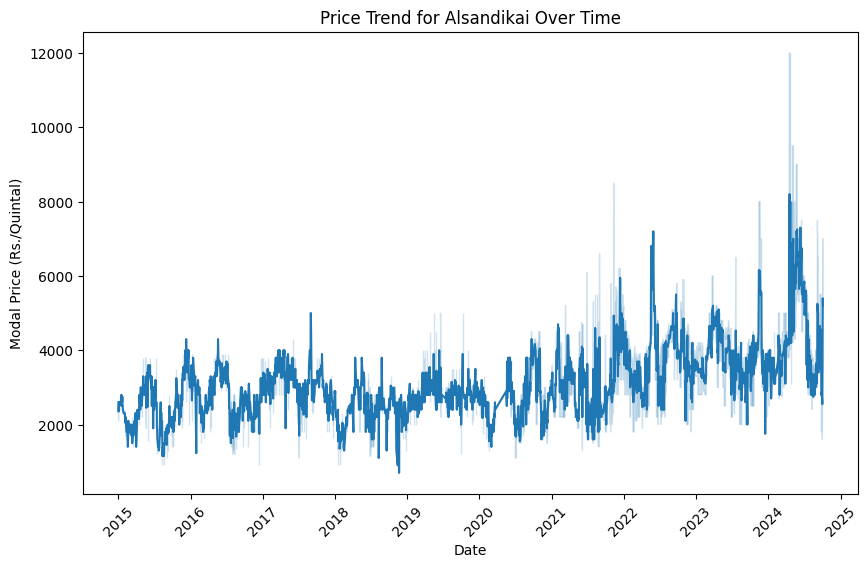

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data for the commodity 'Alsandikai'
alsandikai_df = df[df['Commodity'] == 'Alsandikai']

# Plot the line plot
plt.figure(figsize=(10,6))
sns.lineplot(x='Price Date', y='Modal Price (Rs./Quintal)', data=alsandikai_df)

# Add labels and title
plt.xlabel('Date')
plt.ylabel('Modal Price (Rs./Quintal)')
plt.title('Price Trend for Alsandikai Over Time')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()


In [ ]:
df.head()

,Sl no.,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Price Date,Year,Month,Day,Season
0,1,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,1500.0,2000.0,1750.0,2023-12-17,2023,12,17,Winter
1,2,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,1500.0,2000.0,1750.0,2023-12-18,2023,12,18,Winter
2,3,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,2500.0,3000.0,2700.0,2023-08-04,2023,8,4,Monsoon
3,4,Chikmagalur,Bagepalli,Alsandikai,Alsandikai,FAQ,3000.0,4000.0,3500.0,2024-03-11,2024,3,11,Summer
4,5,Bangalore,"Binny Mill (F&V), Bangalore",Alsandikai,Alsandikai,FAQ,180.0,2000.0,1900.0,2018-02-24,2018,2,24,Winter


In [ ]:
df = df.set_index('Price Date')


In [ ]:
df = df.sort_index()

In [ ]:
df.head()

,Sl no.,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,Day,Season
Price Date,,,,,,,,,,,,,
2015-01-01,2294,Chikmagalur,Bagepalli,Tomato,Tomato,FAQ,500.0,700.0,600.0,2015,1,1,Winter
2015-01-01,291,Bangalore,Bangalore,Foxtail Millet(Navane),Other,FAQ,2200.0,3200.0,2700.0,2015,1,1,Winter
2015-01-01,1878,Bangalore,Bangalore,Groundnut,Big (With Shell),FAQ,3000.0,3200.0,3100.0,2015,1,1,Winter
2015-01-01,3953,Mysore,Mysore (Bandipalya),Sweet Potato,Sweet Potato,FAQ,600.0,700.0,650.0,2015,1,1,Winter
2015-01-01,47997,Raichur,Sindhanur,Rice,Sarbati Raw,FAQ,1600.0,1600.0,1600.0,2015,1,1,Winter


In [ ]:
df.drop('Sl no.',axis = 1,inplace = True)

In [ ]:
df_alas = df[df['Commodity']== 'Alsandikai']

<Axes: xlabel='Price Date'>

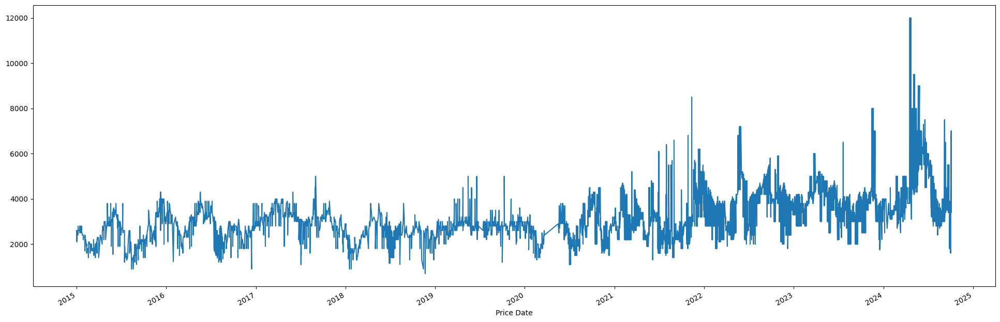

In [ ]:
df_alas['Modal Price (Rs./Quintal)'].plot(figsize=(24,8))

<Axes: xlabel='Price Date'>

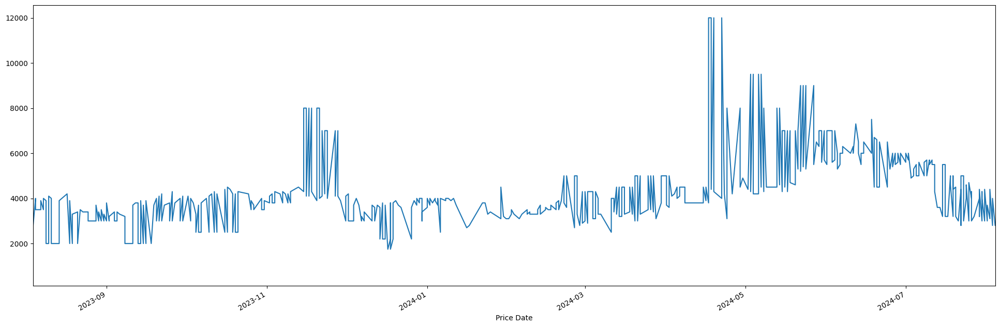

In [ ]:
df_alas['Modal Price (Rs./Quintal)'].plot(xlim = ['2023-08-04','2024-08-04'] ,figsize=(24,8))

<Axes: xlabel='Price Date'>

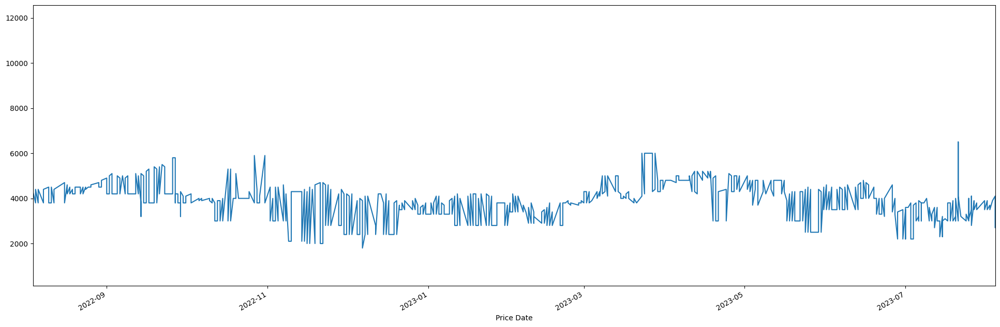

In [ ]:
df_alas['Modal Price (Rs./Quintal)'].plot(xlim = ['2022-08-04','2023-08-04'] ,figsize=(24,8))

In [ ]:
df.head(2)

,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,Day,Season
Price Date,,,,,,,,,,,,
2015-01-01,Chikmagalur,Bagepalli,Tomato,Tomato,FAQ,500.0,700.0,600.0,2015,1,1,Winter
2015-01-01,Bangalore,Bangalore,Foxtail Millet(Navane),Other,FAQ,2200.0,3200.0,2700.0,2015,1,1,Winter


In [ ]:
average_cost_commodity = df.groupby('Commodity')['Modal Price (Rs./Quintal)'].mean()

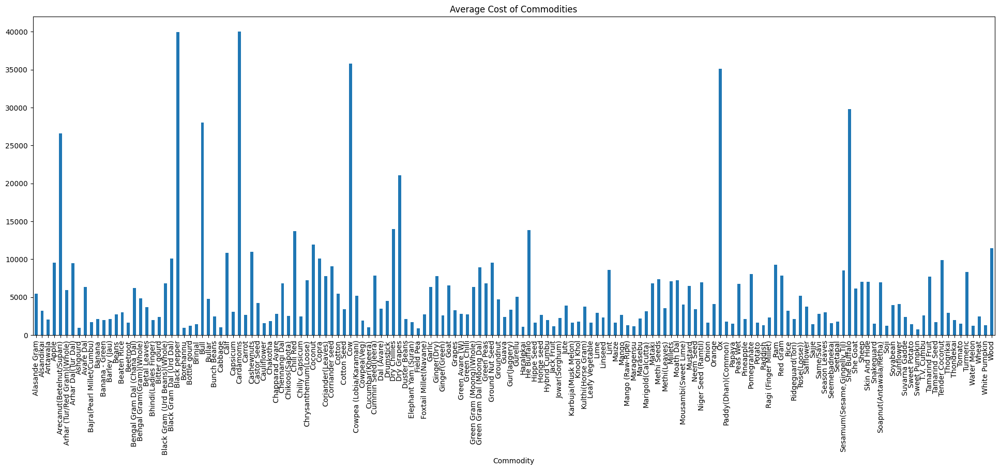

In [ ]:
import matplotlib.pyplot as plt

average_cost_commodity.plot(kind = 'bar',figsize=(24,8))
plt.title('Average Cost of Commodities')
plt.show()

In [ ]:
average_cost_commodity.sort_values(ascending = False)

,Modal Price (Rs./Quintal)
Commodity,
Cardamoms,40000.000000
Black pepper,39921.752225
Cow,35816.627502
Ox,35126.731758
She Buffalo,29769.481269
...,...
Cucumbar(Kheera),989.633354
Borehannu,963.789869
Ashgourd,916.159456


In [ ]:
df[df['Commodity'] == 'Cow']

,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,Day,Season
Price Date,,,,,,,,,,,,
2015-01-01,Bagalkot,Badami,Cow,Cow,FAQ,25000.0,64000.0,51000.0,2015,1,1,Winter
2015-01-01,Dharwad,Annigeri,Cow,Cow,FAQ,38000.0,38000.0,38000.0,2015,1,1,Winter
2015-01-02,Belgaum,Nippani,Cow,Cow,FAQ,28000.0,45000.0,40000.0,2015,1,2,Winter
2015-01-02,Haveri,Ranebennur,Cow,Cow,FAQ,5000.0,35000.0,26000.0,2015,1,2,Winter
2015-01-02,Belgaum,Kudchi,Cow,Cow,FAQ,25000.0,35000.0,27000.0,2015,1,2,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-23,Kolar,Chintamani,Cow,Cow,FAQ,70000.0,99800.0,95000.0,2024,9,23,Monsoon
2024-09-27,Belgaum,Nippani,Cow,Cow,FAQ,5000.0,80000.0,65000.0,2024,9,27,Monsoon
2024-09-27,Hassan,Channarayapatna,Cow,Cow,FAQ,15000.0,70000.0,50000.0,2024,9,27,Monsoon


In [ ]:
winter_season = df[df['Season'] == 'Winter']
summer_season = df[df['Season'] == 'Summer']
monsoon_season = df[df['Season'] == 'Monsoon']
post_monsoon_season = df[df['Season'] == 'Post-monsoon']

In [ ]:
average_cost_commodity_winter = winter_season.groupby('Commodity')['Modal Price (Rs./Quintal)'].mean()
average_cost_commodity_summer = summer_season.groupby('Commodity')['Modal Price (Rs./Quintal)'].mean()
average_cost_commodity_monsoon = monsoon_season.groupby('Commodity')['Modal Price (Rs./Quintal)'].mean()
average_cost_commodity_post_monsoon = post_monsoon_season.groupby('Commodity')['Modal Price (Rs./Quintal)'].mean()

In [ ]:
df.Season.unique()

array(['Winter', 'Summer', 'Monsoon', 'Post-monsoon'], dtype=object)

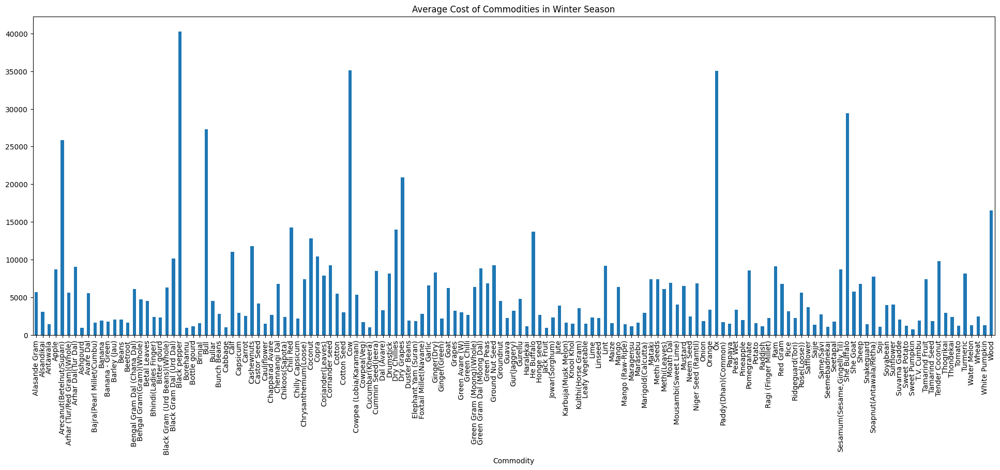

In [ ]:
average_cost_commodity_winter.plot(kind = 'bar',figsize=(24,8))
plt.title('Average Cost of Commodities in Winter Season')
plt.show()

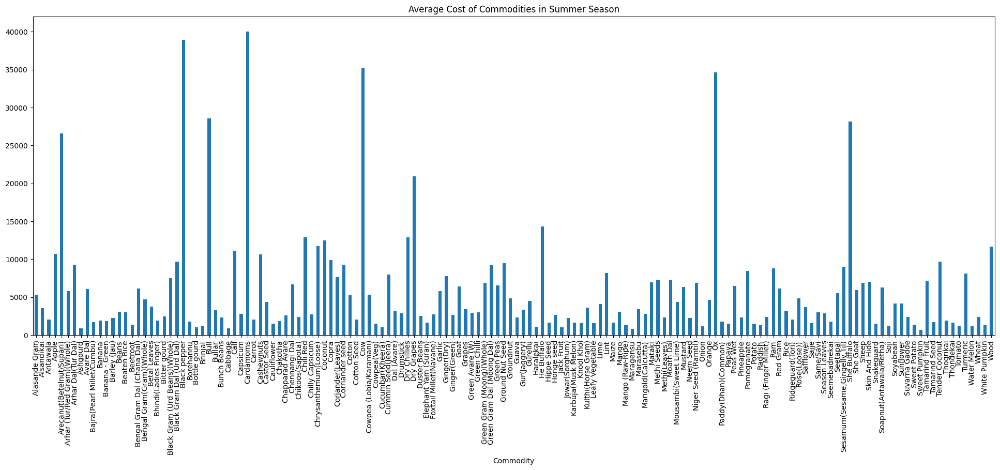

In [ ]:
average_cost_commodity_summer.plot(kind = 'bar',figsize=(24,8))
plt.title('Average Cost of Commodities in Summer Season')
plt.show()

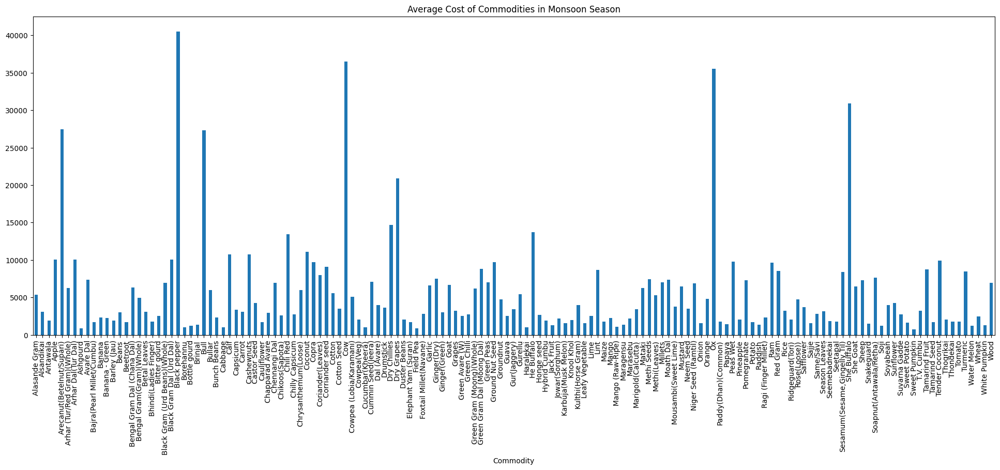

In [ ]:
average_cost_commodity_monsoon.plot(kind = 'bar',figsize=(24,8))
plt.title('Average Cost of Commodities in Monsoon Season')
plt.show()

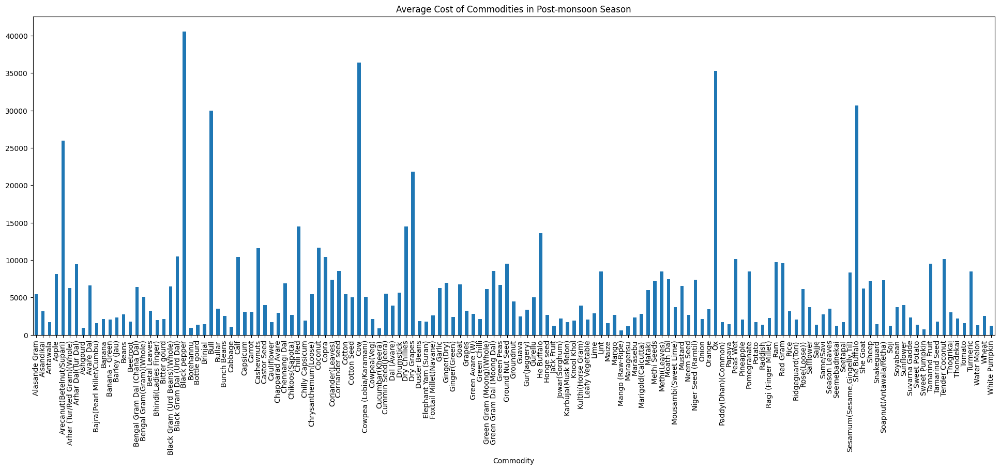

In [ ]:
average_cost_commodity_post_monsoon.plot(kind = 'bar',figsize=(24,8))
plt.title('Average Cost of Commodities in Post-monsoon Season')
plt.show()

In [ ]:
df.head()

,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,Day,Season
Price Date,,,,,,,,,,,,
2015-01-01,Hassan,Hassan,Beetroot,Beetroot,FAQ,900.0,1000.0,1000.0,2015,1,1,Winter
2015-01-01,Chikmagalur,Bagepalli,Green Chilli,Green Chilly,FAQ,1500.0,2000.0,1800.0,2015,1,1,Winter
2015-01-01,Mysore,Mysore (Bandipalya),Beetroot,Beetroot,FAQ,1200.0,1300.0,1250.0,2015,1,1,Winter
2015-01-01,Bangalore,Doddaballa Pur,Tomato,Tomato,Medium,1200.0,1600.0,1400.0,2015,1,1,Winter
2015-01-01,Bangalore,Ramanagara,Thogrikai,Thogarikai,FAQ,900.0,1100.0,1000.0,2015,1,1,Winter


In [ ]:
!pip install sweetviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 57.9 MB/s eta 0:00:00


In [ ]:
import sweetviz as sv

# Generate the report
report = sv.analyze(df)

# Show the report
report.show_html('data_analyze.html')



                                             |          | [  0%]   00:00 -> (? left)

Report data_analyze.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
df.columns

Index(['District Name', 'Market Name', 'Commodity', 'Variety', 'Grade',
       'Min Price (Rs./Quintal)', 'Max Price (Rs./Quintal)',
       'Modal Price (Rs./Quintal)', 'Year', 'Month', 'Day', 'Season'],
      dtype='object')

In [ ]:
df.head()

,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,Day,Season
Price Date,,,,,,,,,,,,
2015-01-01,Hassan,Hassan,Beetroot,Beetroot,FAQ,900.0,1000.0,1000.0,2015,1,1,Winter
2015-01-01,Chikmagalur,Bagepalli,Green Chilli,Green Chilly,FAQ,1500.0,2000.0,1800.0,2015,1,1,Winter
2015-01-01,Mysore,Mysore (Bandipalya),Beetroot,Beetroot,FAQ,1200.0,1300.0,1250.0,2015,1,1,Winter
2015-01-01,Bangalore,Doddaballa Pur,Tomato,Tomato,Medium,1200.0,1600.0,1400.0,2015,1,1,Winter
2015-01-01,Bangalore,Ramanagara,Thogrikai,Thogarikai,FAQ,900.0,1100.0,1000.0,2015,1,1,Winter


<Axes: xlabel='District Name'>

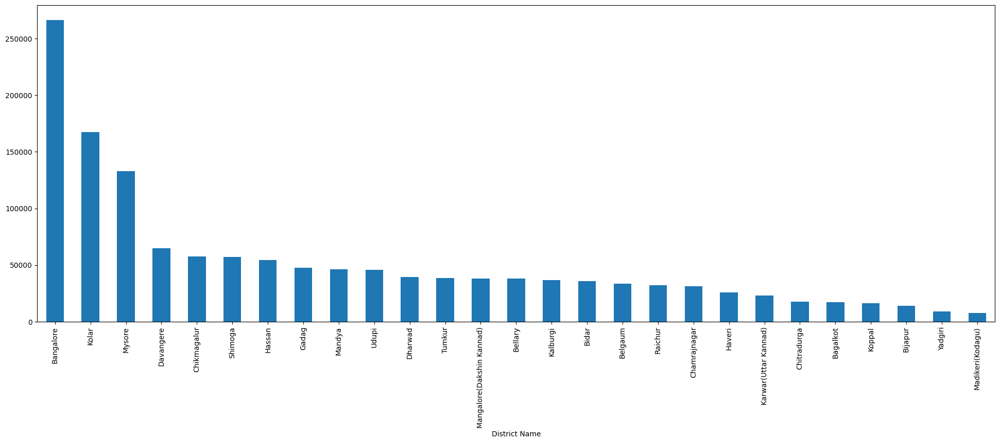

In [ ]:
df['District Name'].value_counts().plot(kind = 'bar',figsize = (24,8))

<Axes: xlabel='Market Name'>

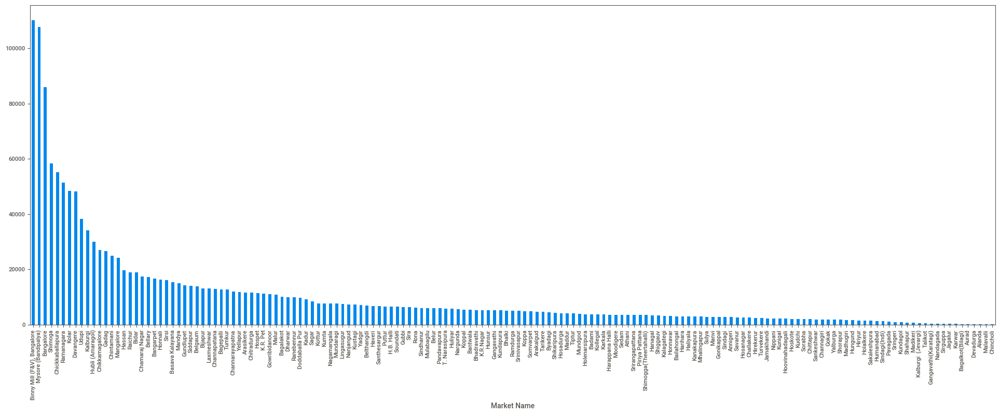

In [ ]:
df['Market Name'].value_counts().plot(kind = 'bar',figsize = (24,8))

<Axes: xlabel='Commodity'>

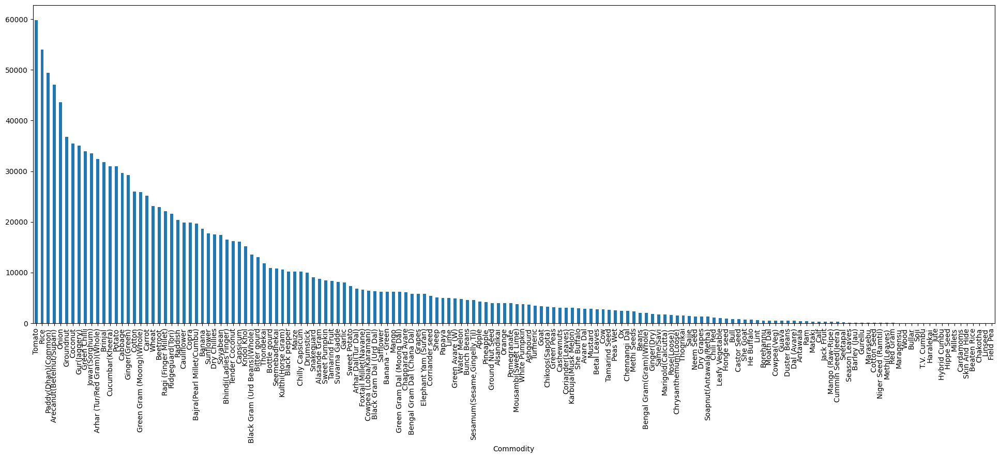

In [ ]:
df['Commodity'].value_counts().plot(kind = 'bar',figsize = (24,8))

<Axes: xlabel='Commodity'>

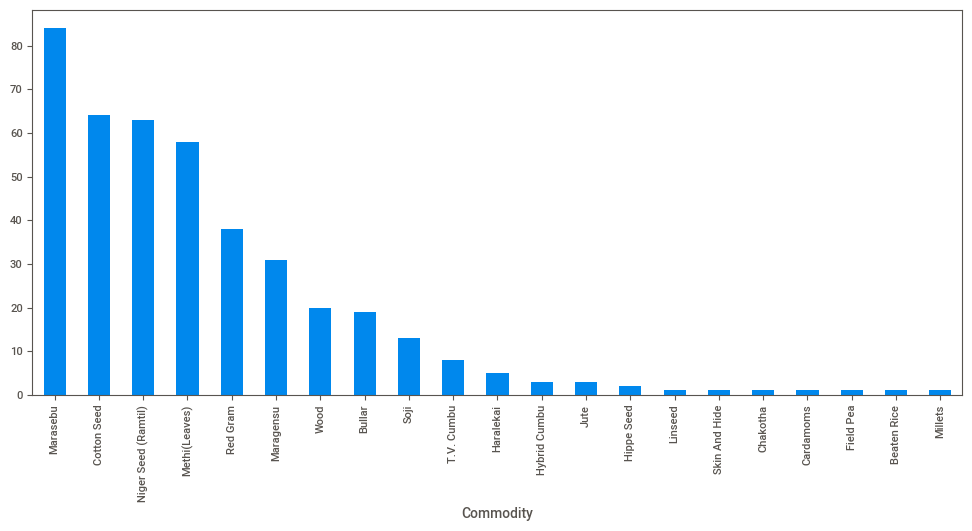

In [ ]:
# Instead of using value_counts() directly for filtering,
# first identify the commodities with counts less than 5.
low_count_commodities = df['Commodity'].value_counts()[df['Commodity'].value_counts() < 100].index

# Then, use isin() to filter the DataFrame based on these commodities.
filtered_df = df[df['Commodity'].isin(low_count_commodities)]

# Now, filtered_df contains only the rows where the 'Commodity'
# value is among those with counts less than 50.
filtered_df['Commodity'].value_counts().plot(kind = 'bar',figsize=(12,5))

In [ ]:
filtered_df['Commodity'].unique()

array(['Cotton Seed', 'Niger Seed (Ramtil)', 'Red Gram', 'Bullar',
       'Maragensu', 'Soji', 'Wood', 'Marasebu', 'Field Pea', 'T.V. Cumbu',
       'Jute', 'Hippe Seed', 'Skin And Hide', 'Linseed', 'Haralekai',
       'Methi(Leaves)', 'Chakotha', 'Cardamoms', 'Hybrid Cumbu',
       'Beaten Rice', 'Millets'], dtype=object)

In [ ]:
df[df['Commodity'] == "Maragensu"].value_counts().sum()

31

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


<Axes: ylabel='Modal Price (Rs./Quintal)'>

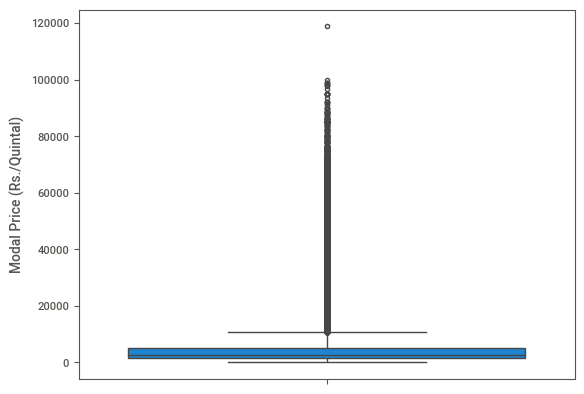

In [ ]:
sns.boxplot(df['Modal Price (Rs./Quintal)'])

<Figure size 1600x800 with 0 Axes>

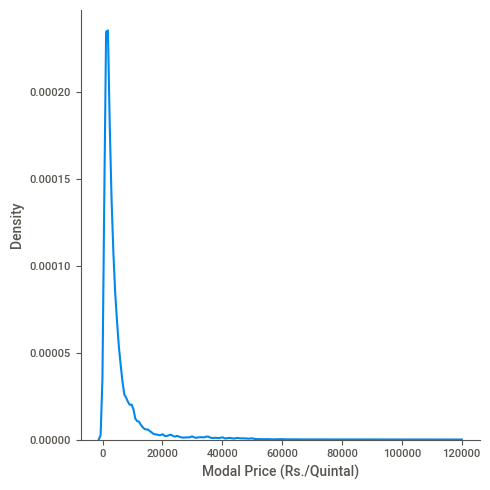

<Figure size 1600x800 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

sns.displot(df['Modal Price (Rs./Quintal)'],kind = 'kde')
plt.figure(figsize=(16,8))

<Figure size 1600x800 with 0 Axes>

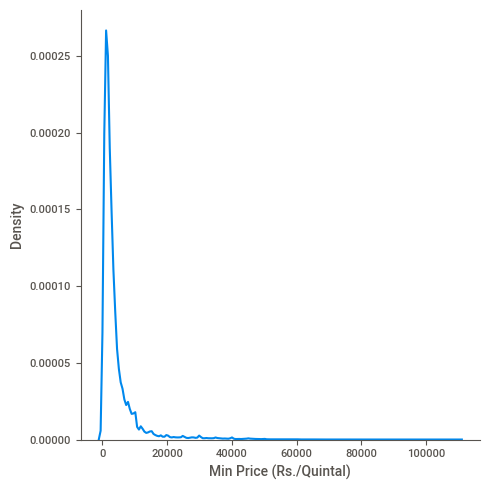

<Figure size 1600x800 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

sns.displot(df['Min Price (Rs./Quintal)'],kind = 'kde')
plt.figure(figsize=(16,8))

<Figure size 1600x800 with 0 Axes>

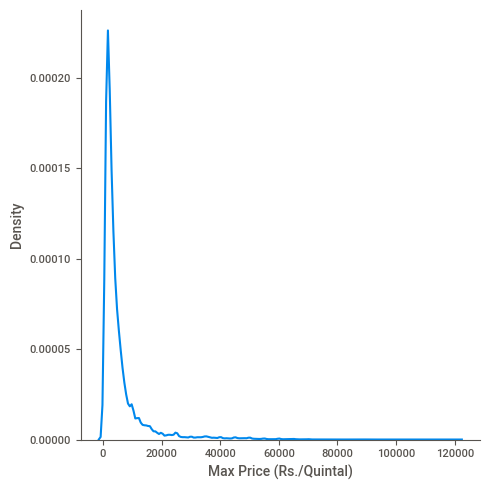

<Figure size 1600x800 with 0 Axes>

In [ ]:
sns.displot(df['Max Price (Rs./Quintal)'],kind = 'kde')
plt.figure(figsize=(16,8))

In [ ]:
commodity_values = df['Commodity'].value_counts()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


<Axes: ylabel='count'>

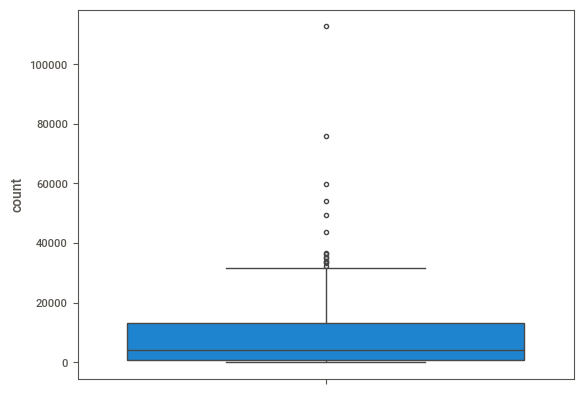

In [ ]:
sns.boxplot(commodity_values)

In [ ]:
df.head(2)

,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,Day,Season
Price Date,,,,,,,,,,,,
2015-01-01,Hassan,Hassan,Beetroot,Beetroot,FAQ,900.0,1000.0,1000.0,2015,1,1,Winter
2015-01-01,Chikmagalur,Bagepalli,Green Chilli,Green Chilly,FAQ,1500.0,2000.0,1800.0,2015,1,1,Winter


<Axes: xlabel='Season'>

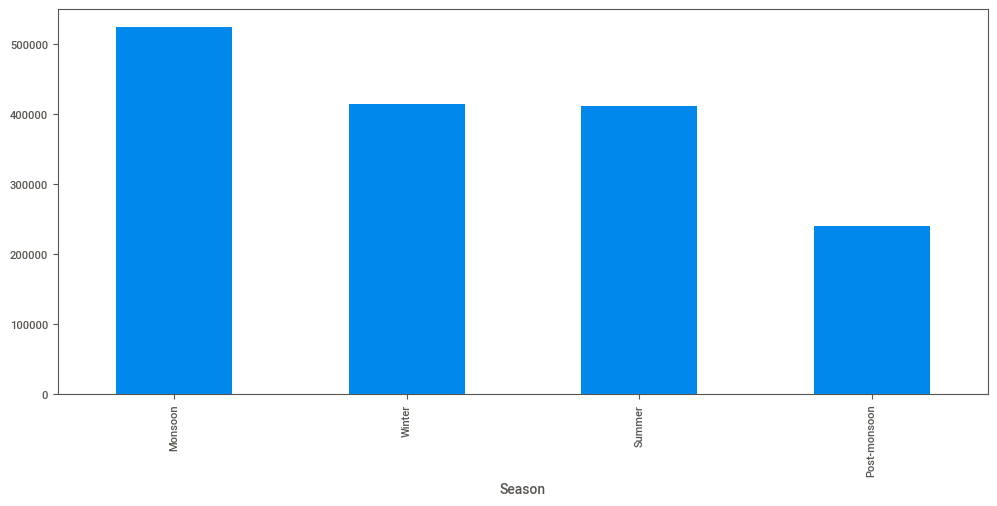

In [ ]:
df['Season'].value_counts().plot(kind = 'bar',figsize = (12,5))

<Axes: xlabel='Grade'>

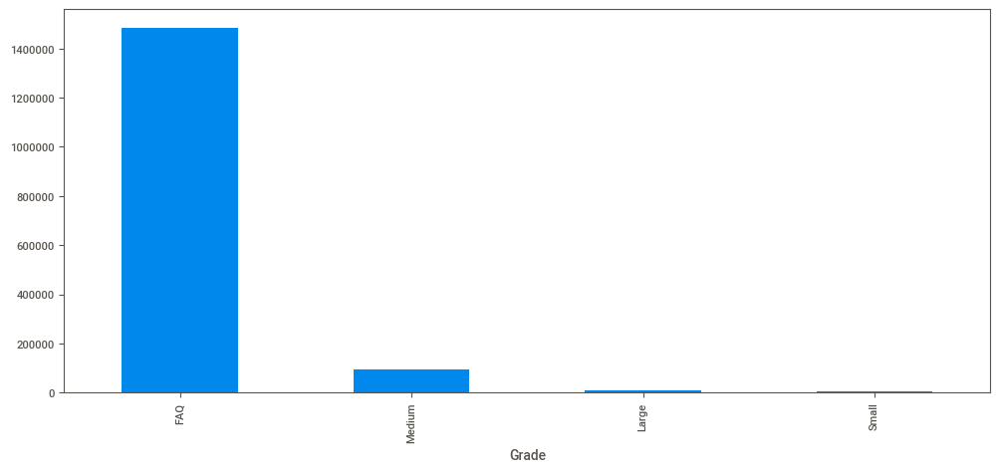

In [ ]:
df['Grade'].value_counts().plot(kind = 'bar',figsize = (12,5))

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


<Axes: ylabel='Modal Price (Rs./Quintal)'>

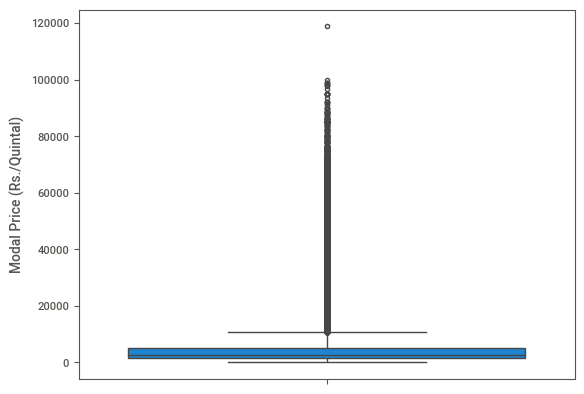

In [ ]:
sns.boxplot(df['Modal Price (Rs./Quintal)'])

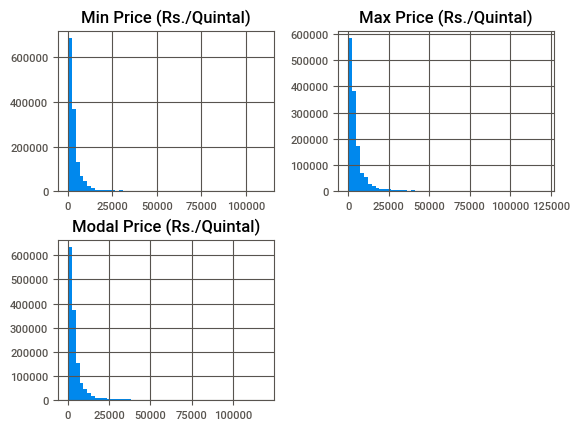

In [ ]:
df[['Min Price (Rs./Quintal)', 'Max Price (Rs./Quintal)', 'Modal Price (Rs./Quintal)']].hist(bins=50)
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


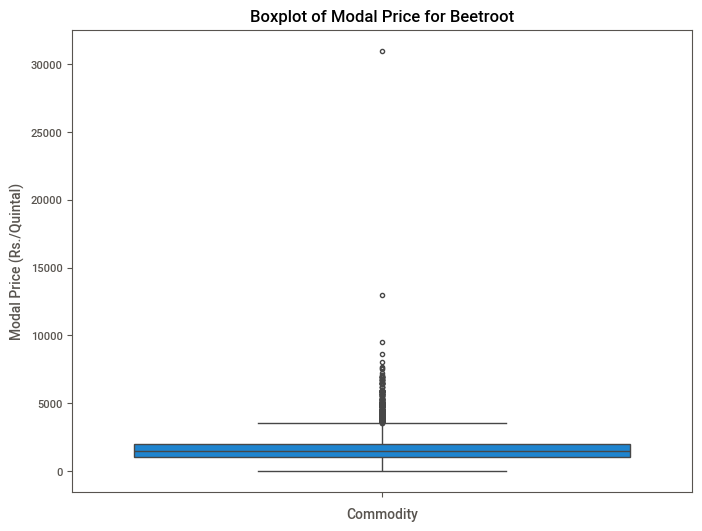

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


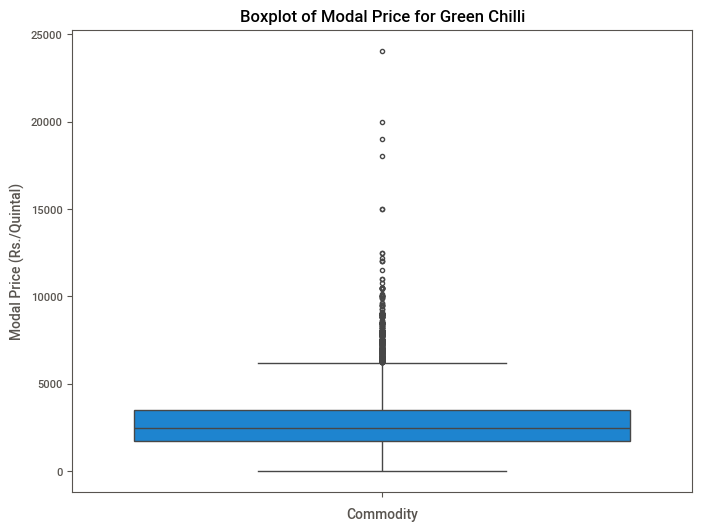

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


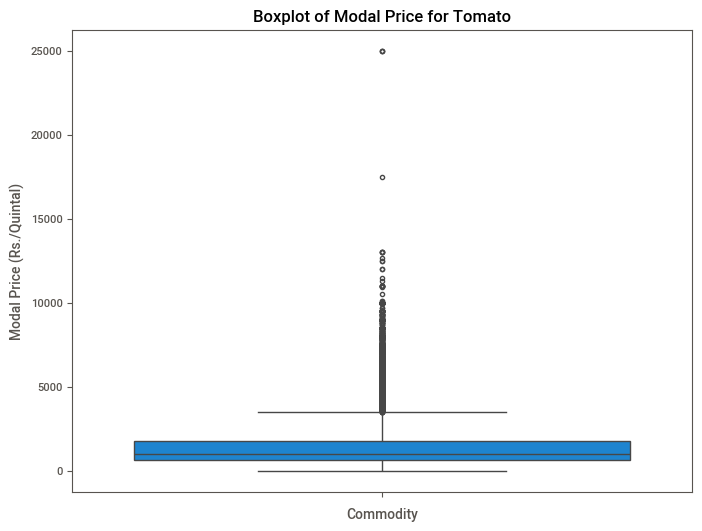

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


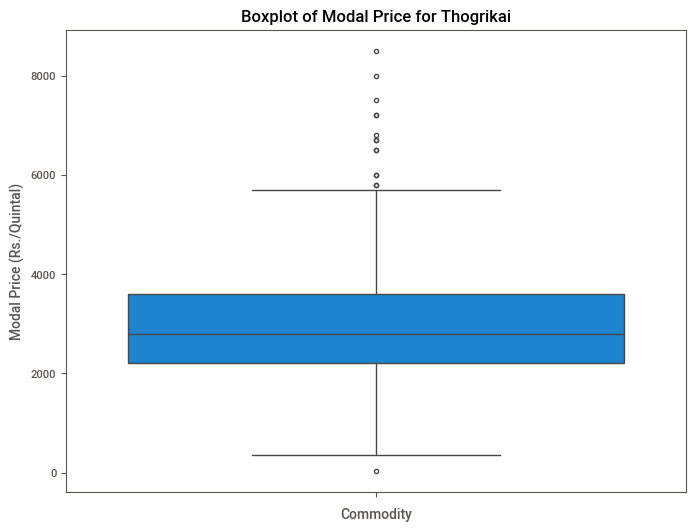

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


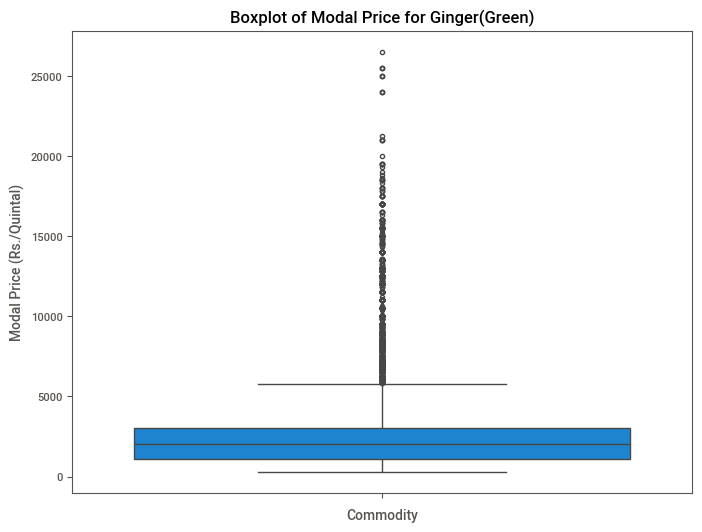

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


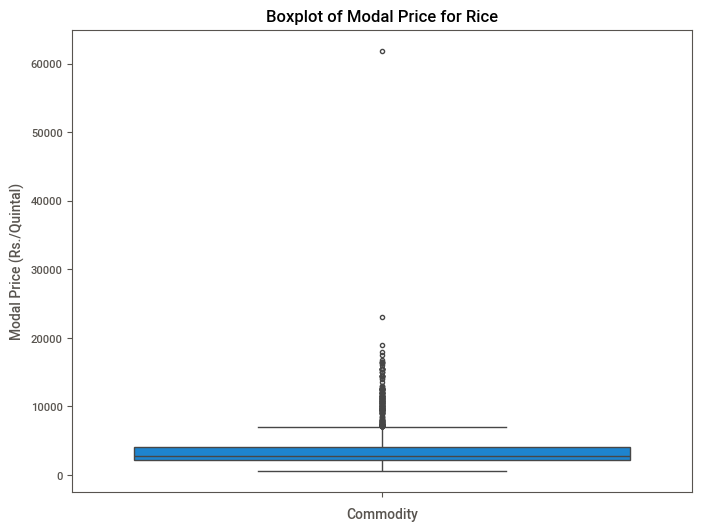

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


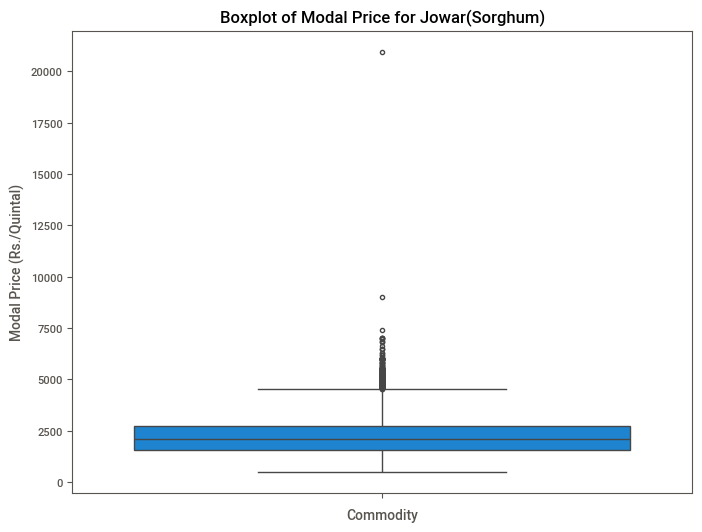

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


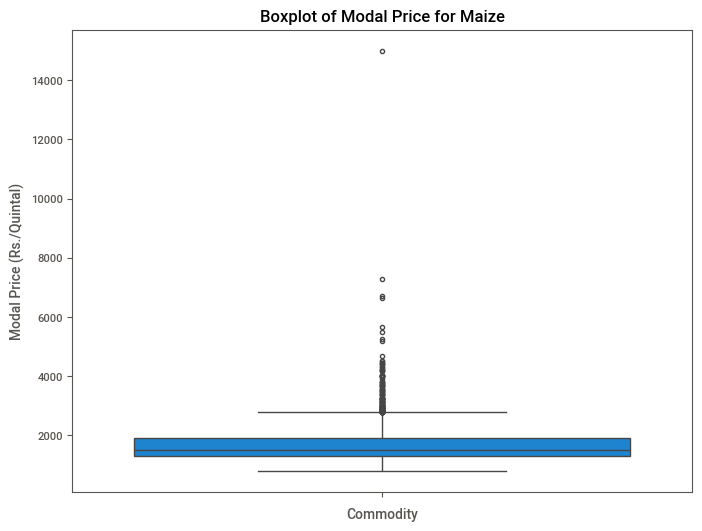

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


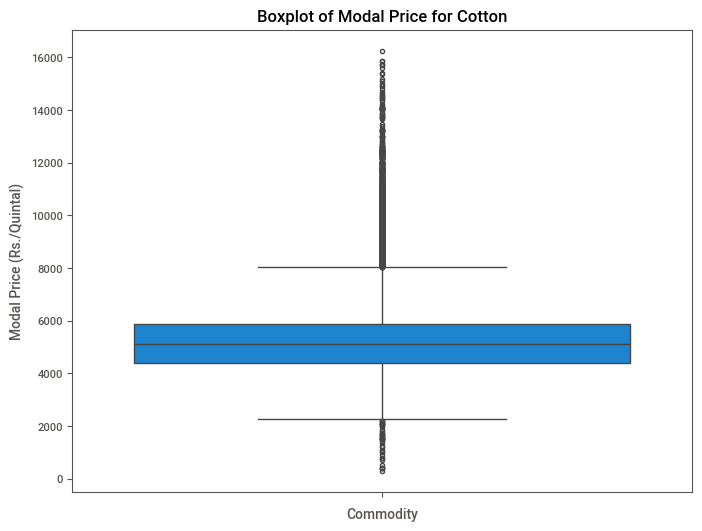

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


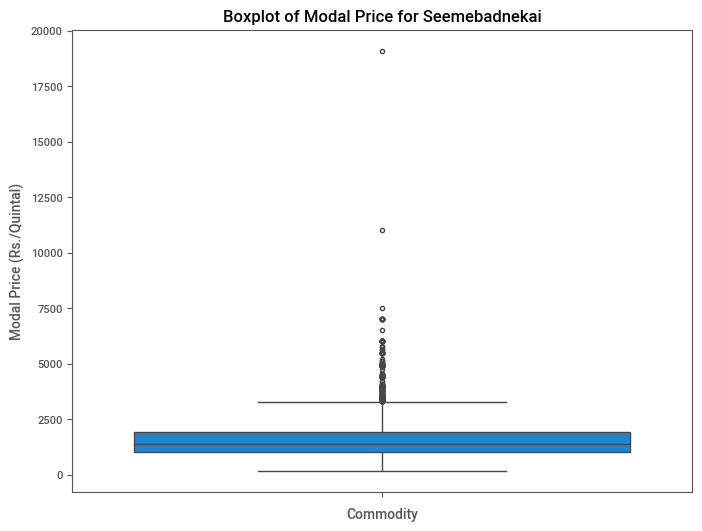

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


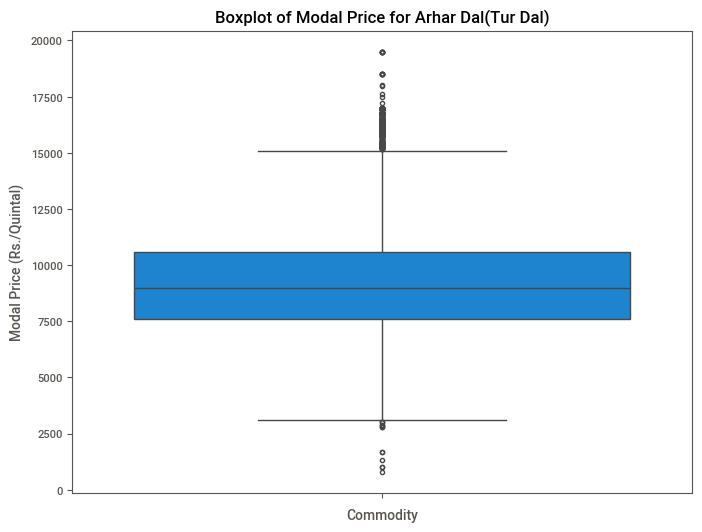

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


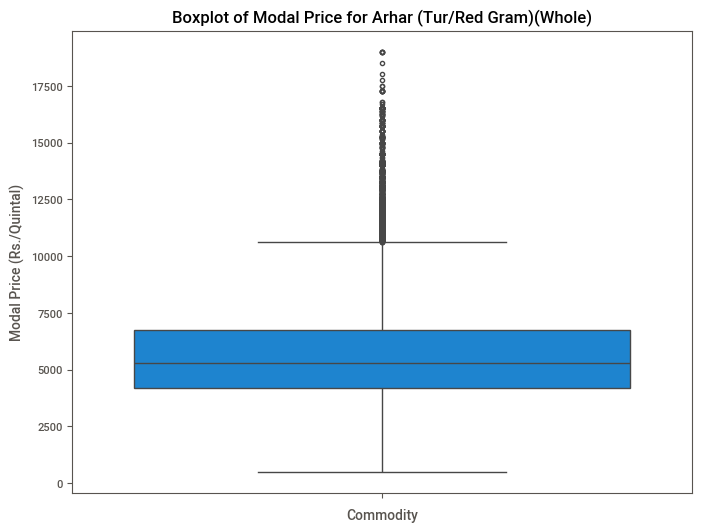

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


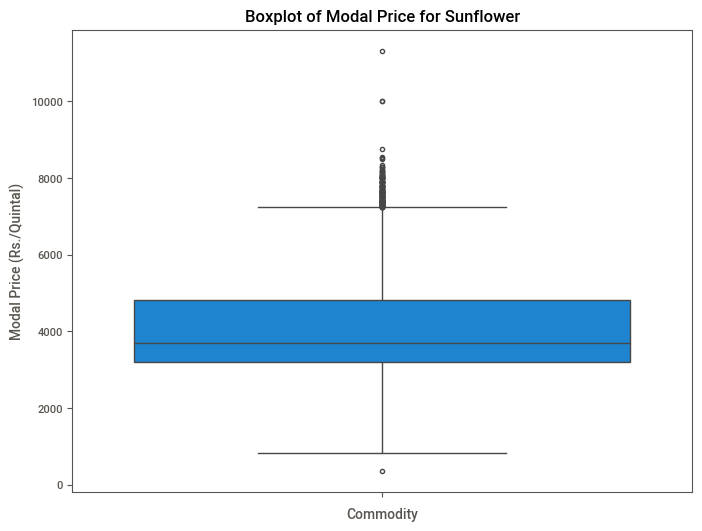

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


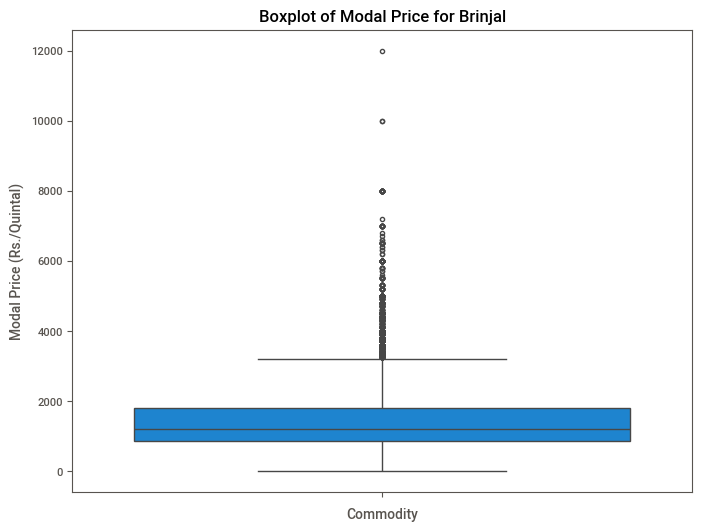

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


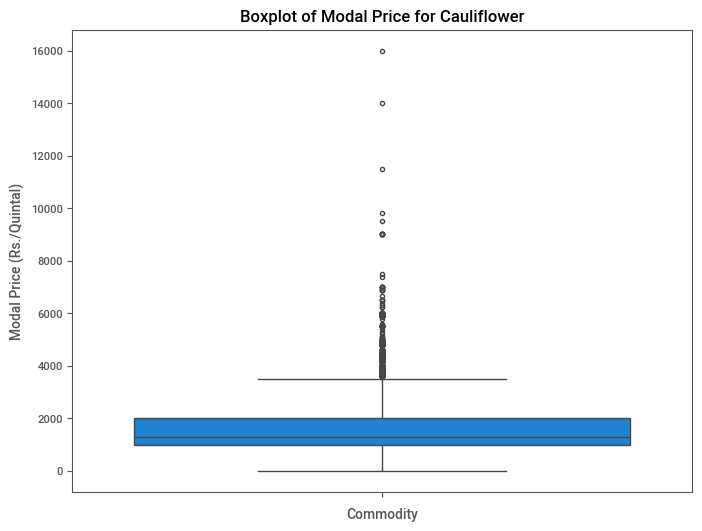

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


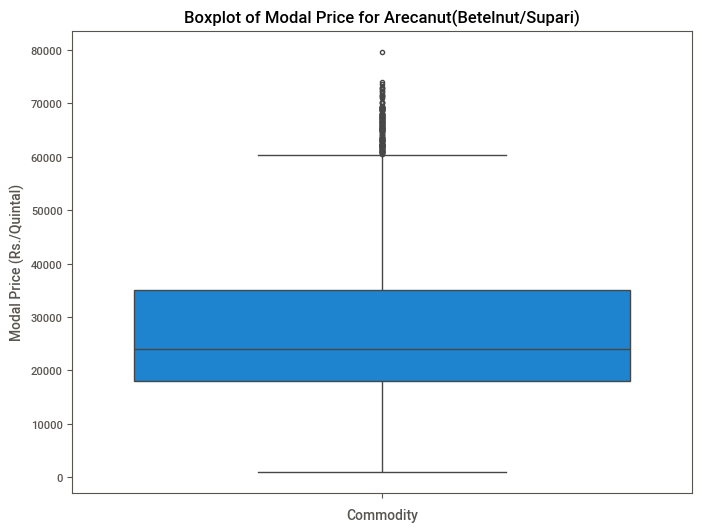

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


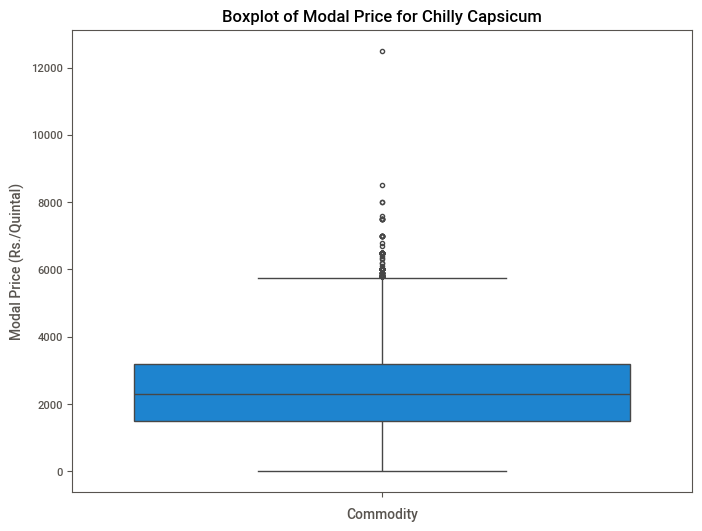

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


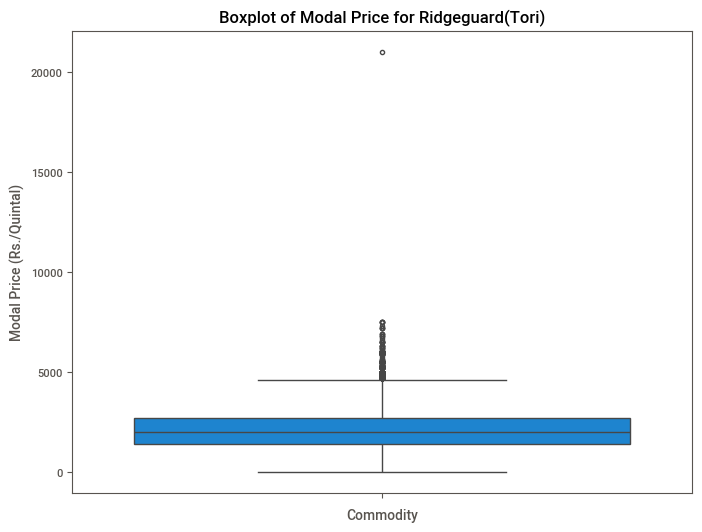

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


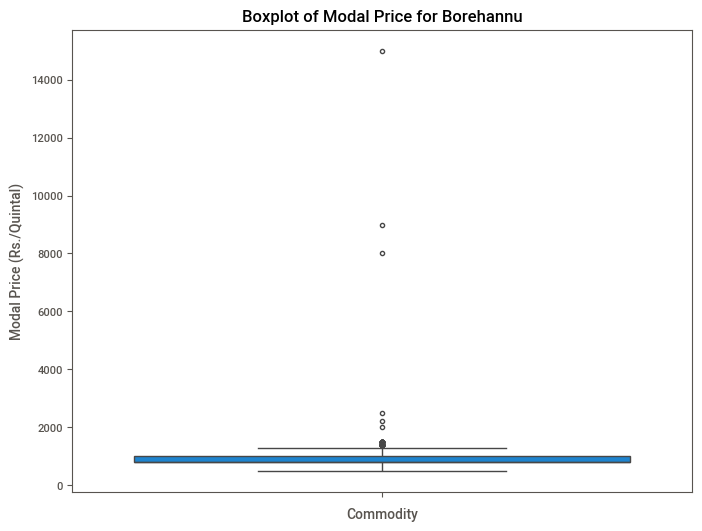

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


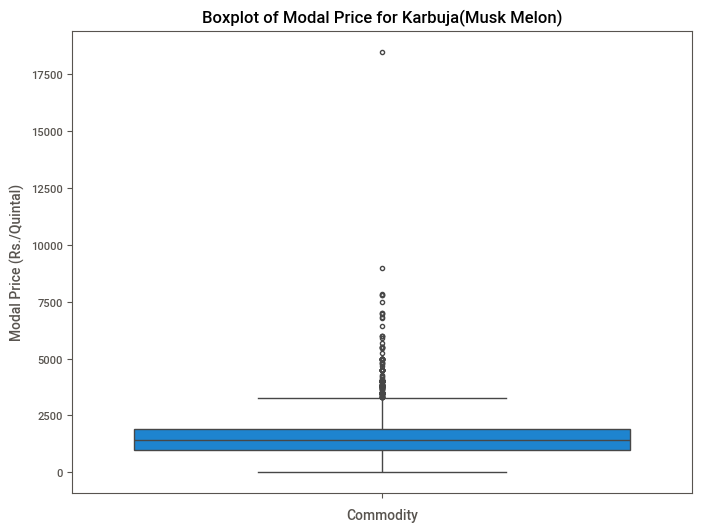

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


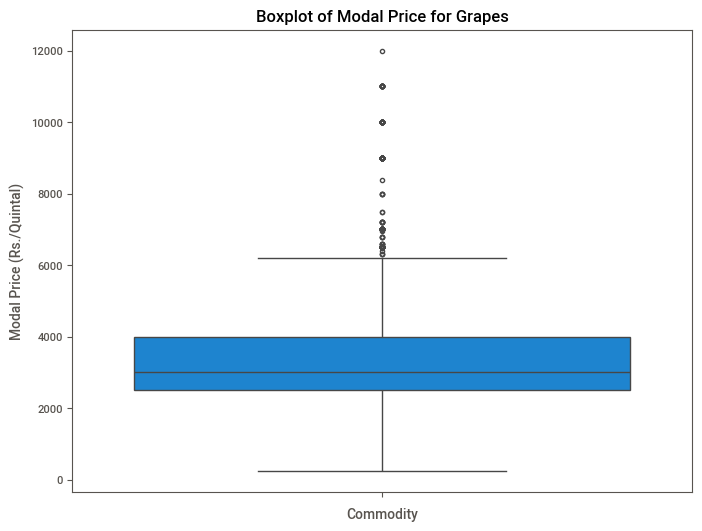

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


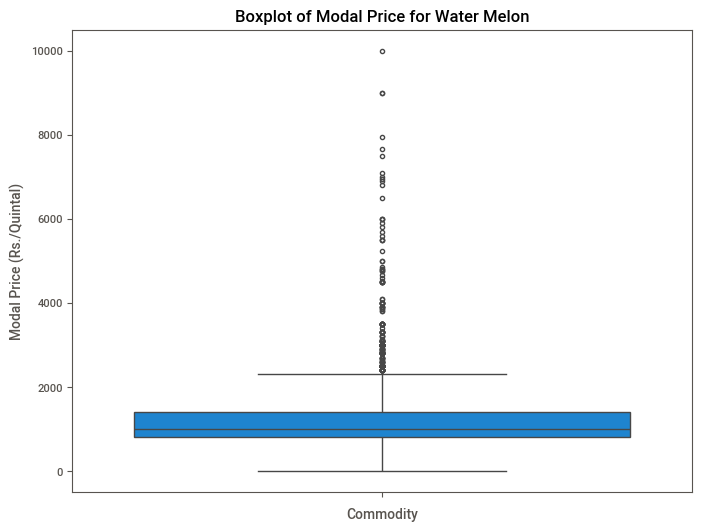

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


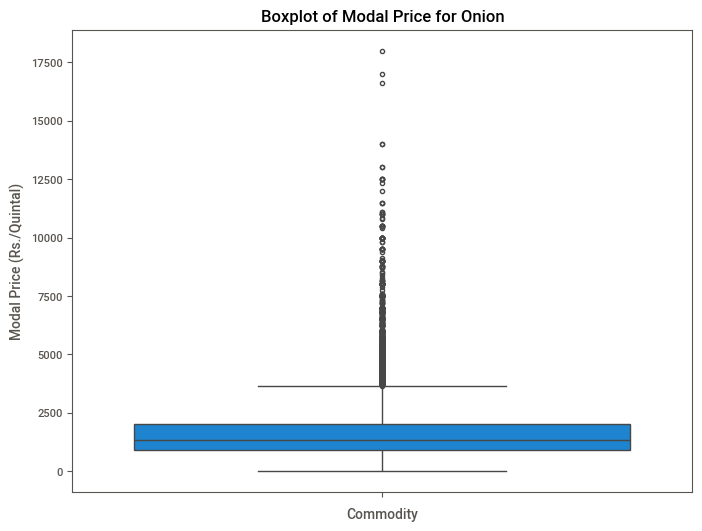

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


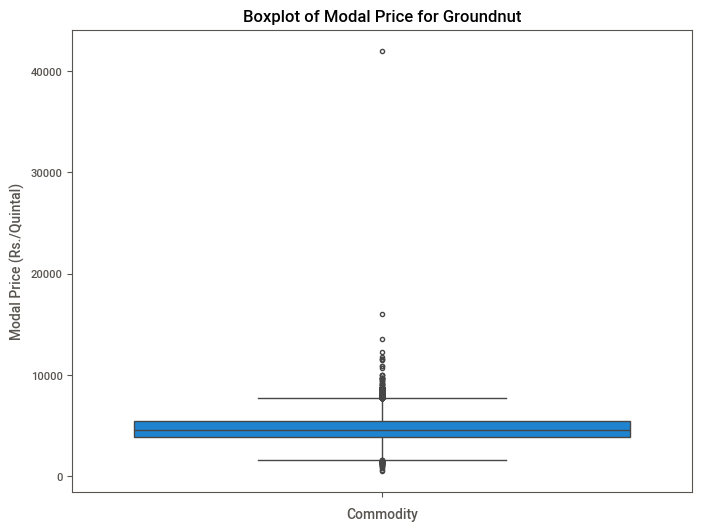

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


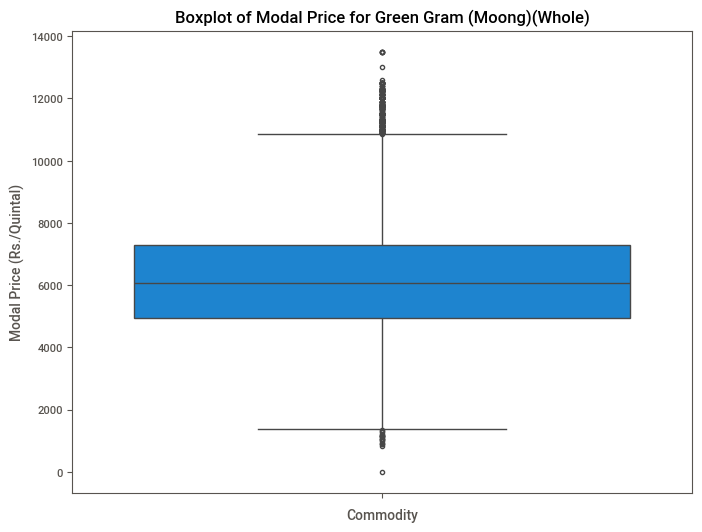

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


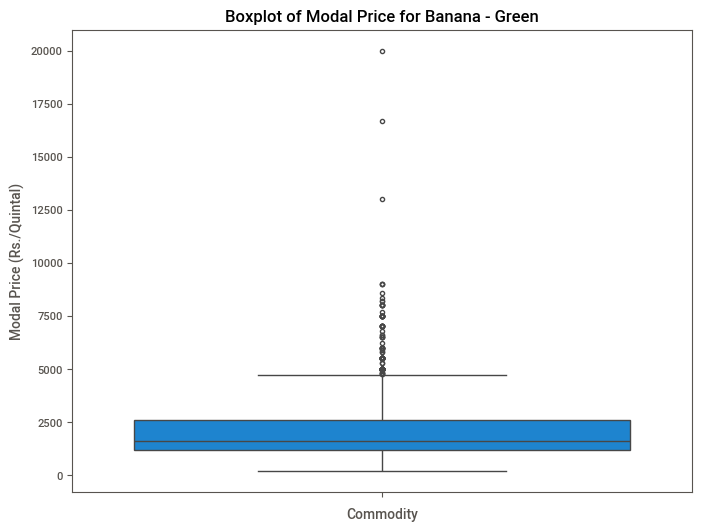

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


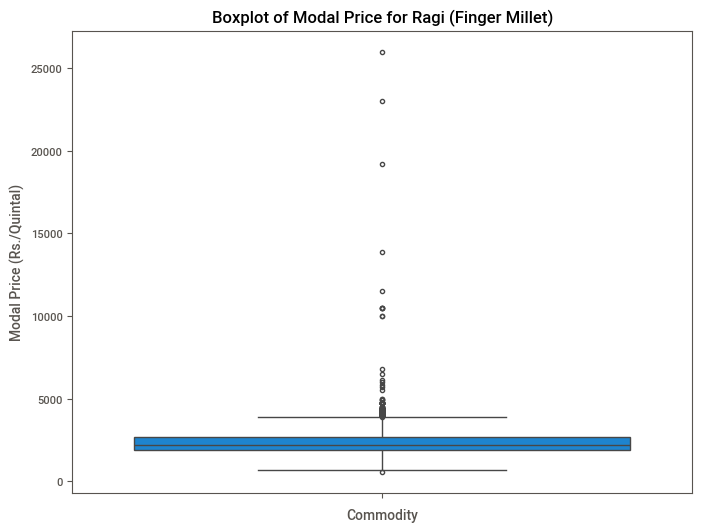

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


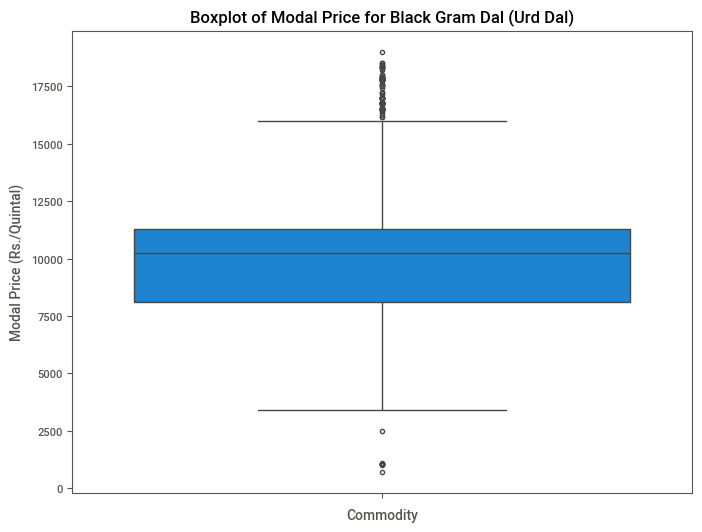

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


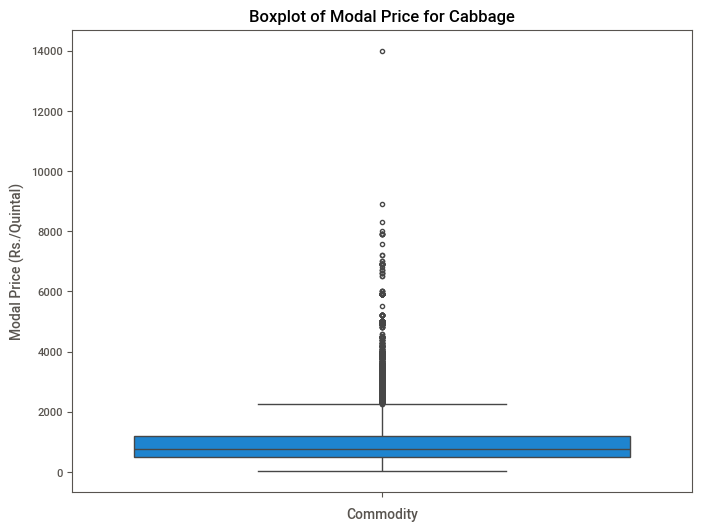

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


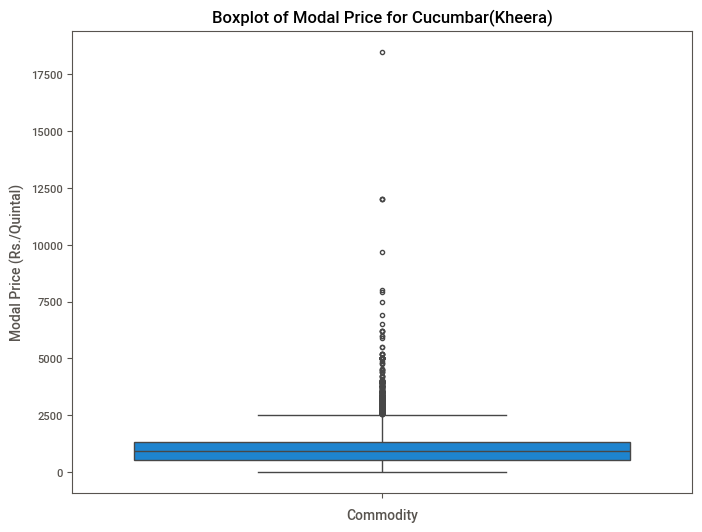

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


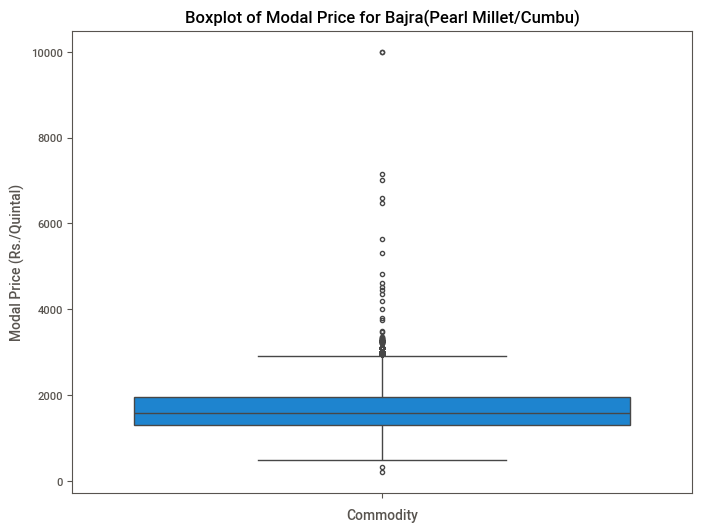

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


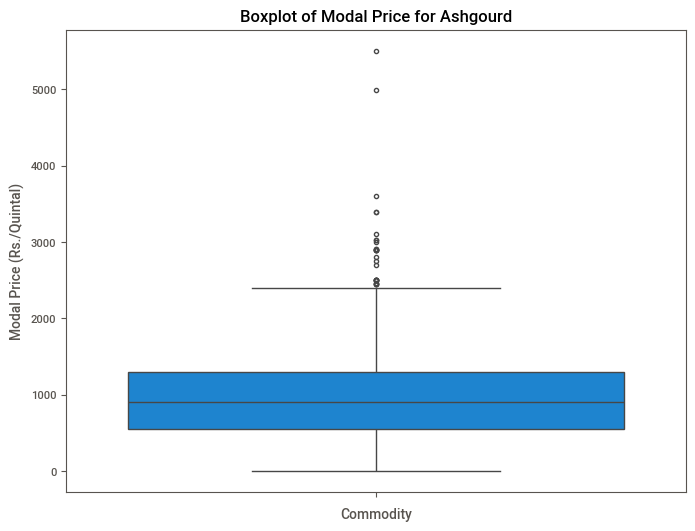

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


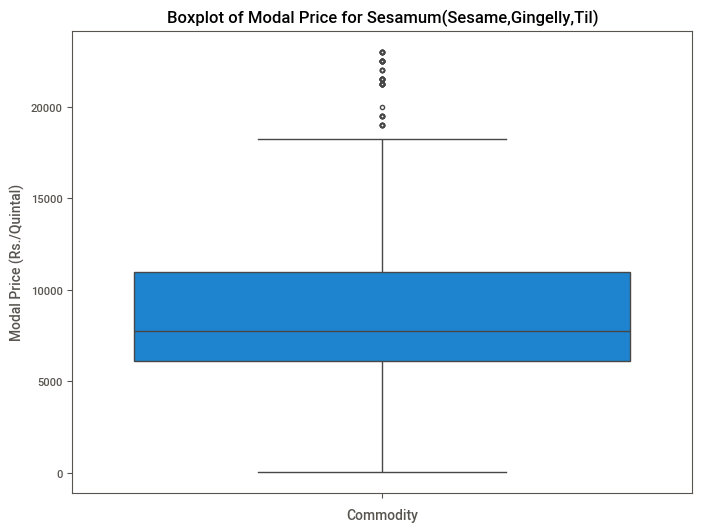

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


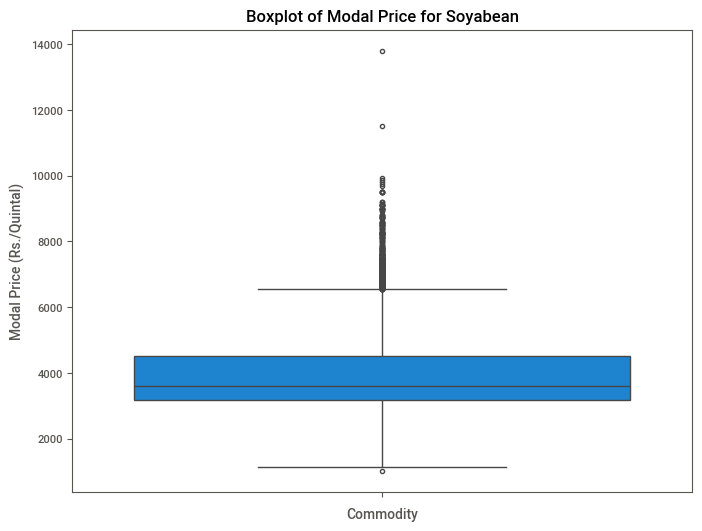

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


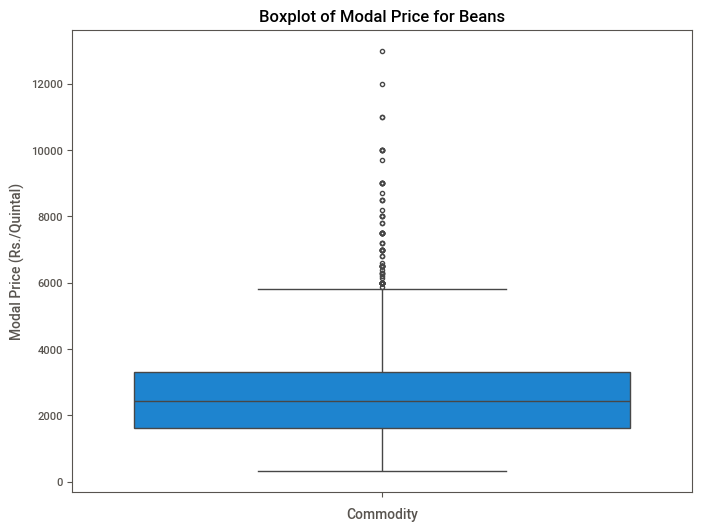

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


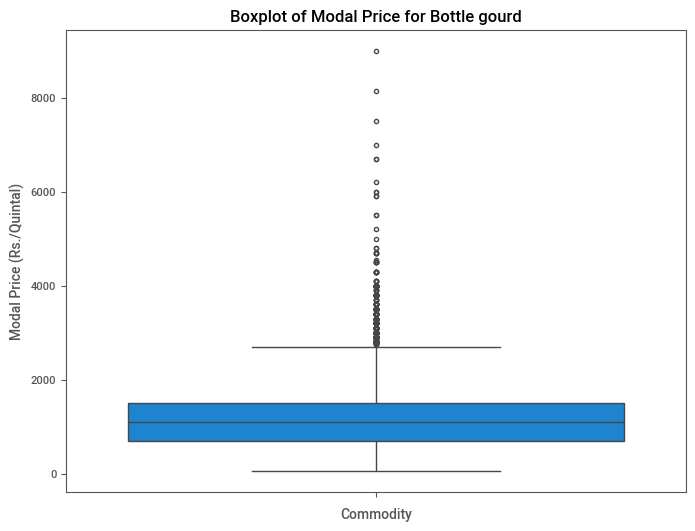

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


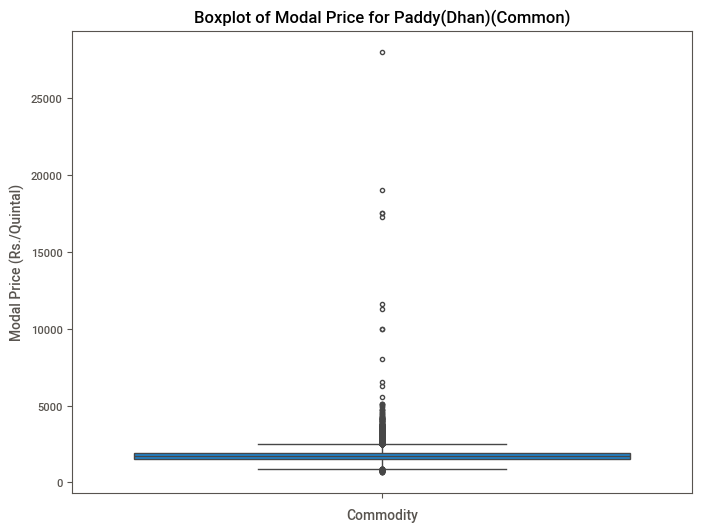

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


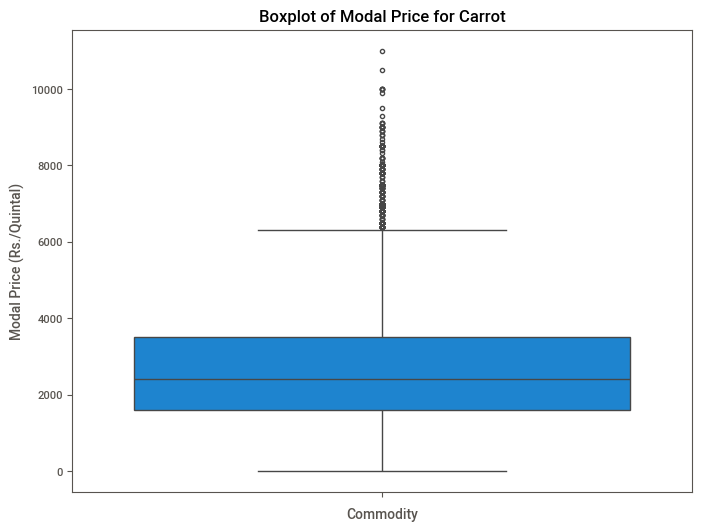

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


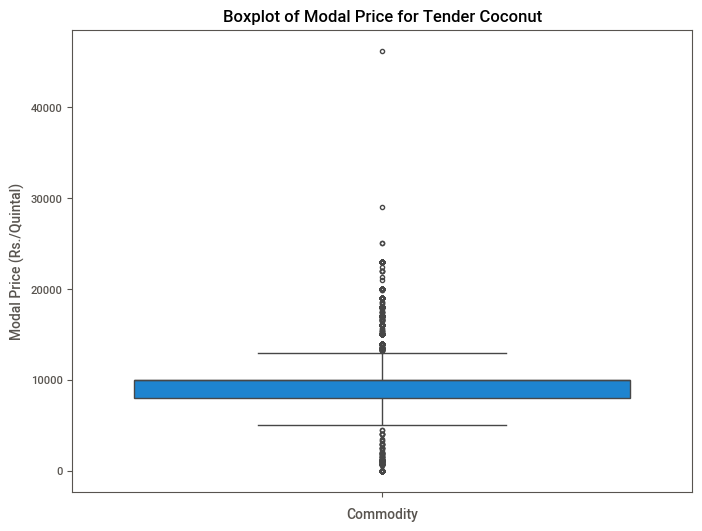

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


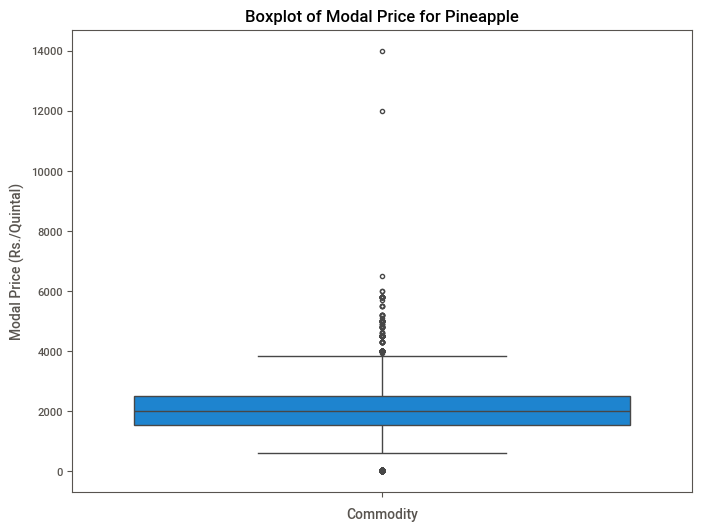

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


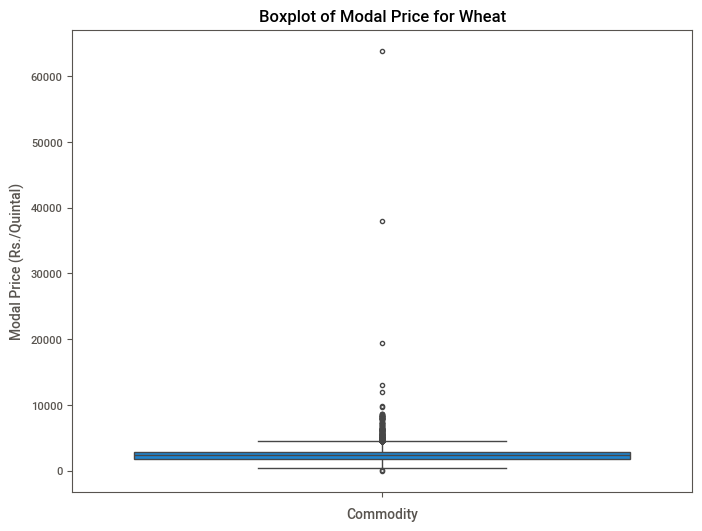

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


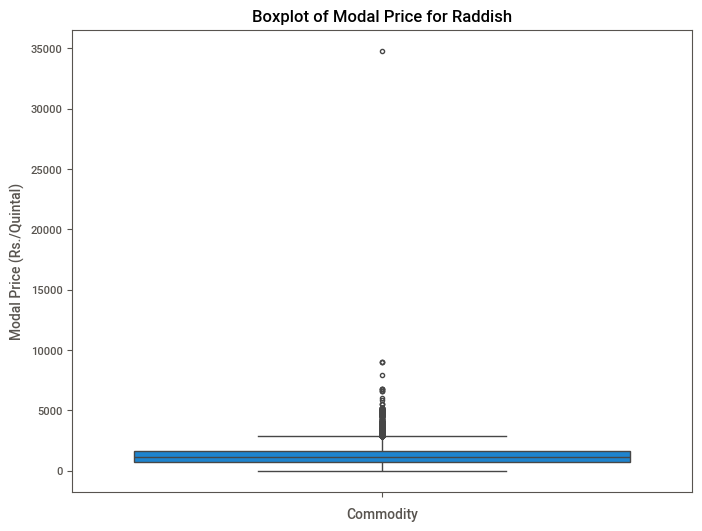

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


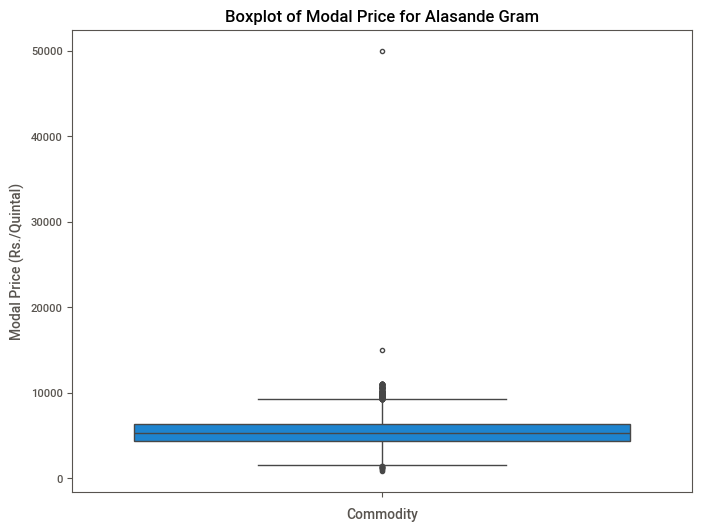

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


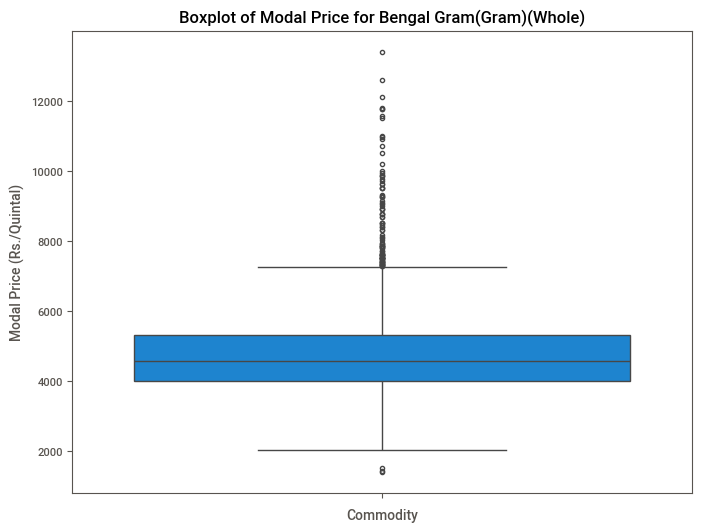

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


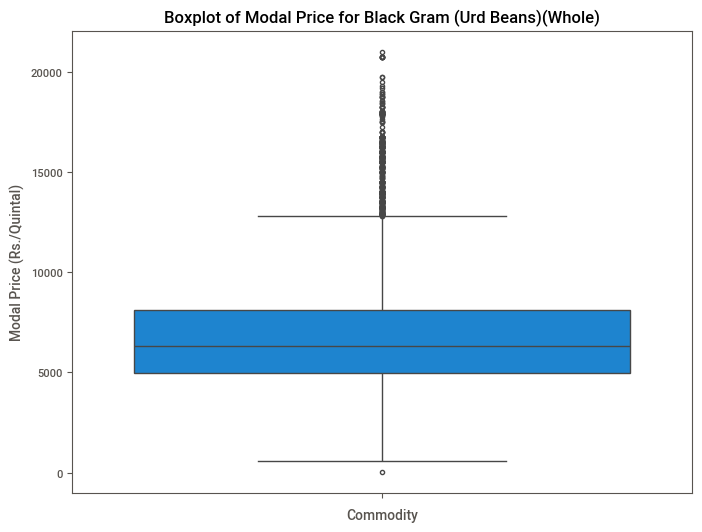

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


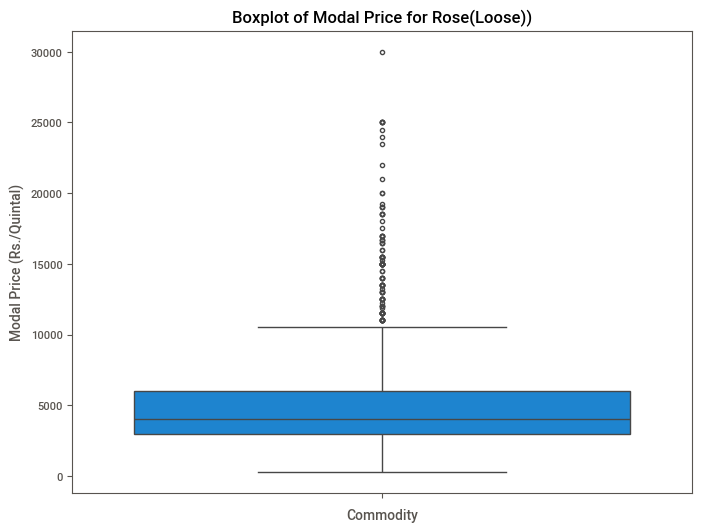

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


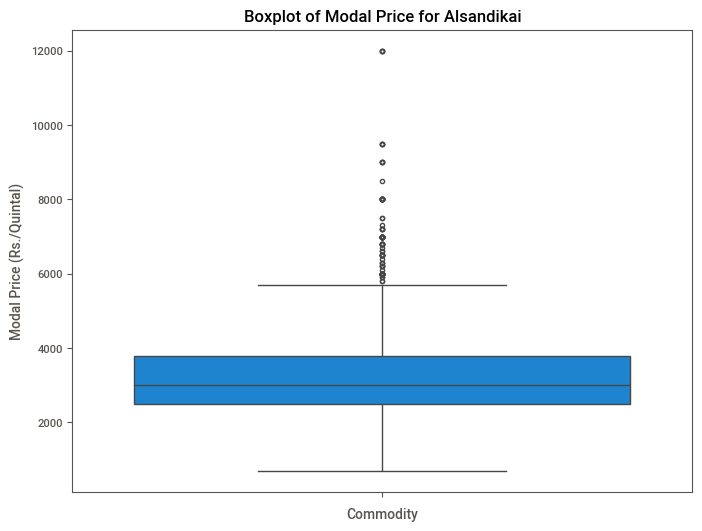

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


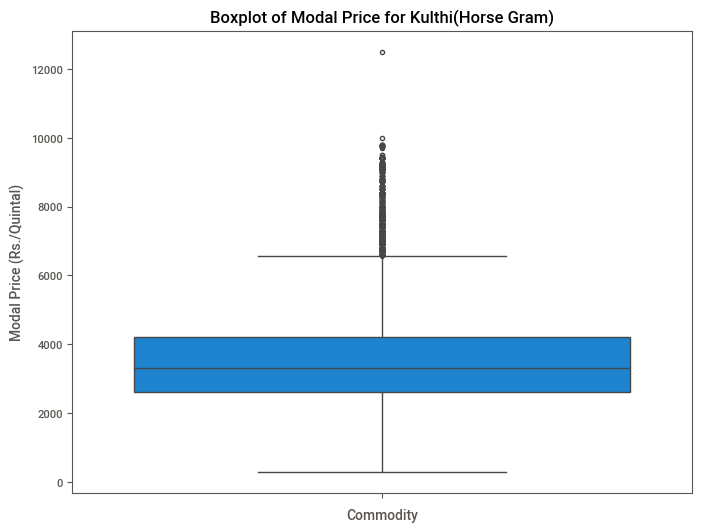

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


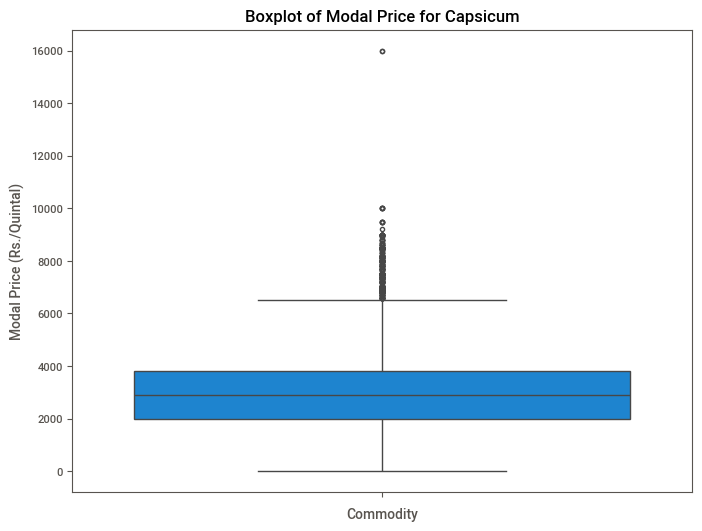

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


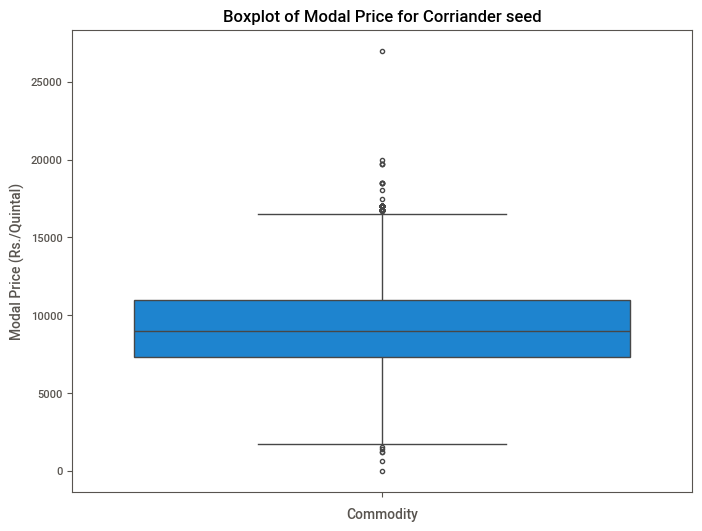

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


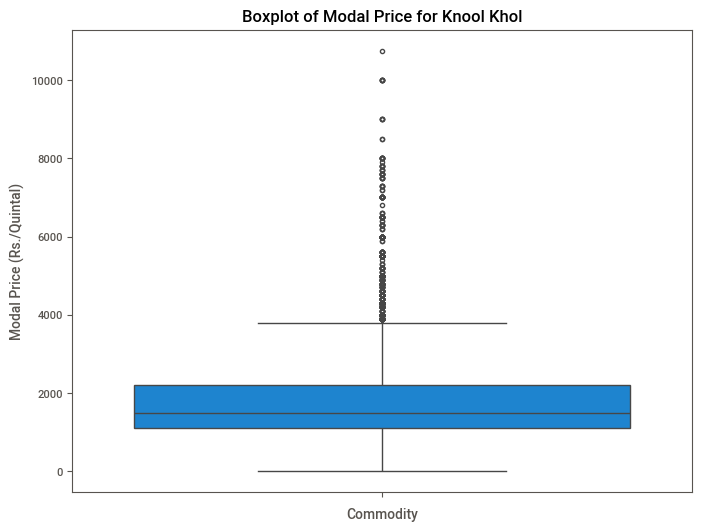

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


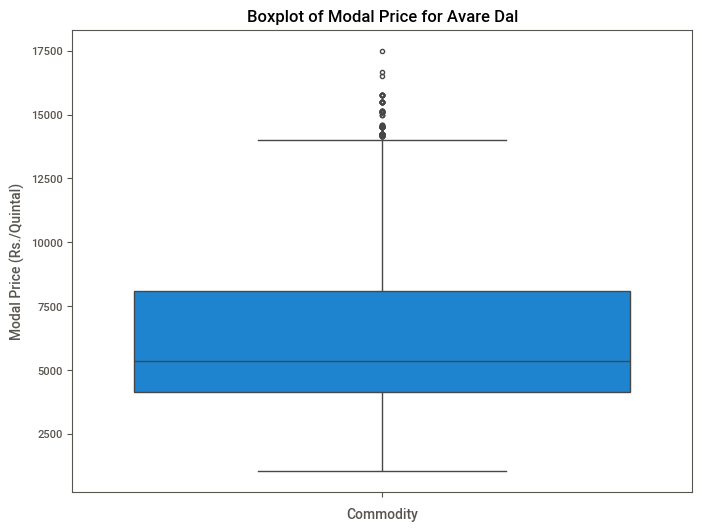

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


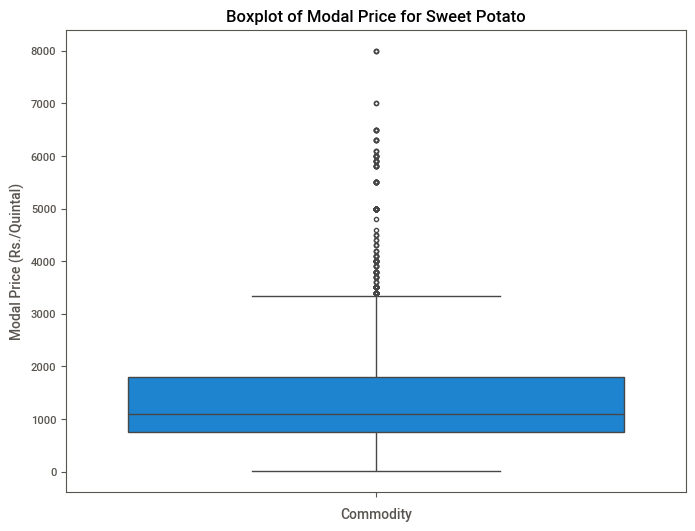

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


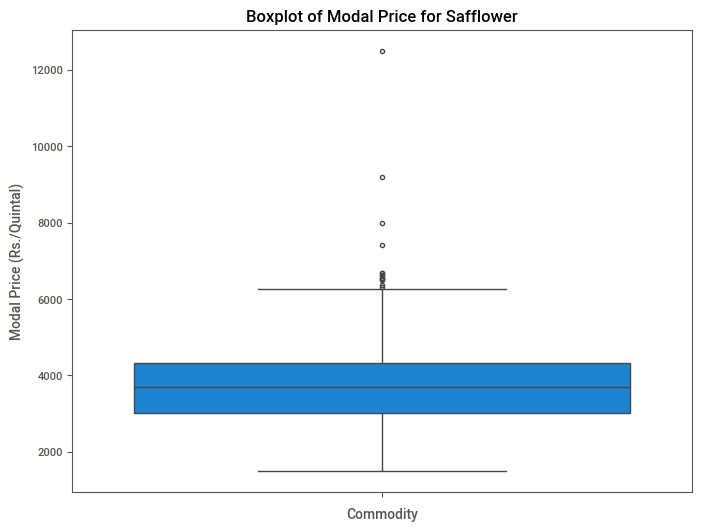

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


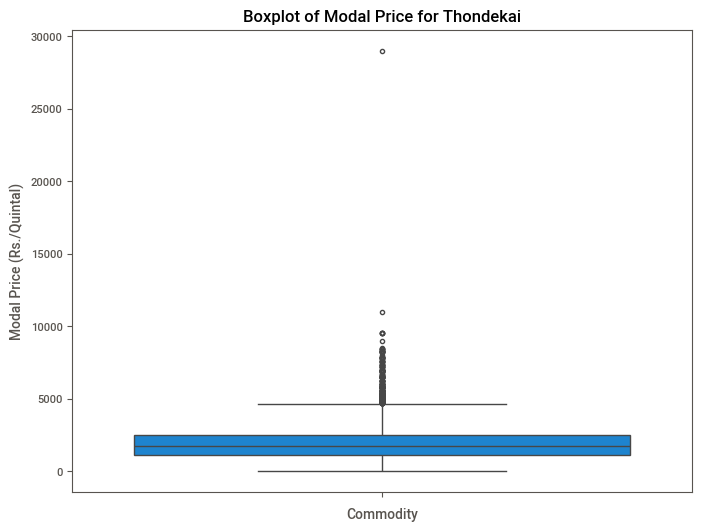

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


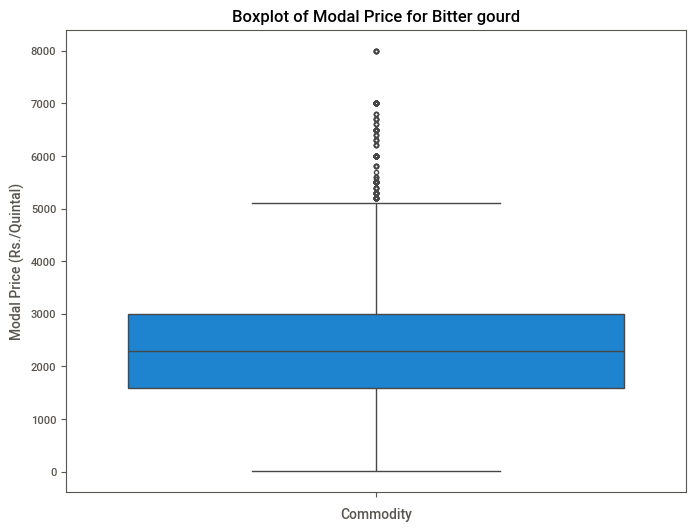

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


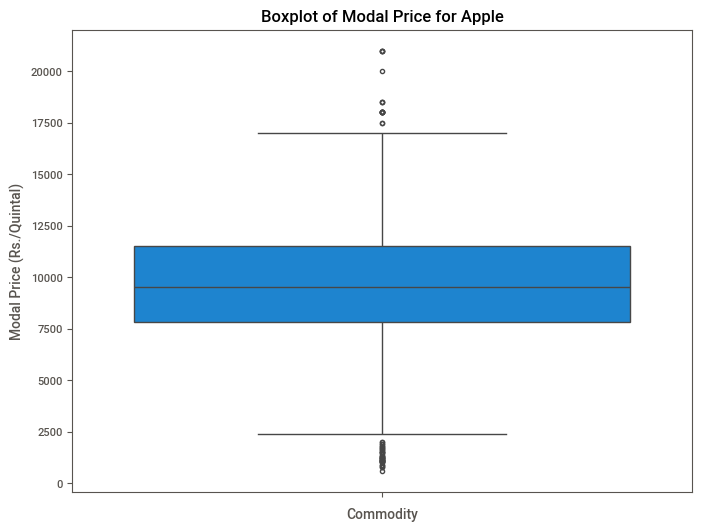

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


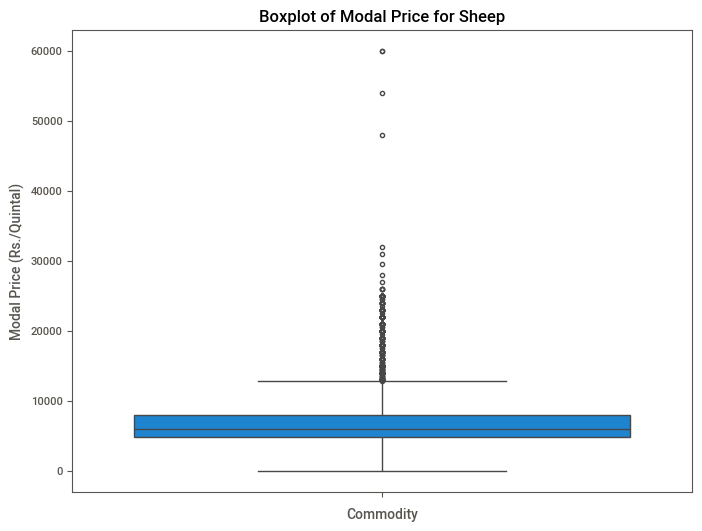

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


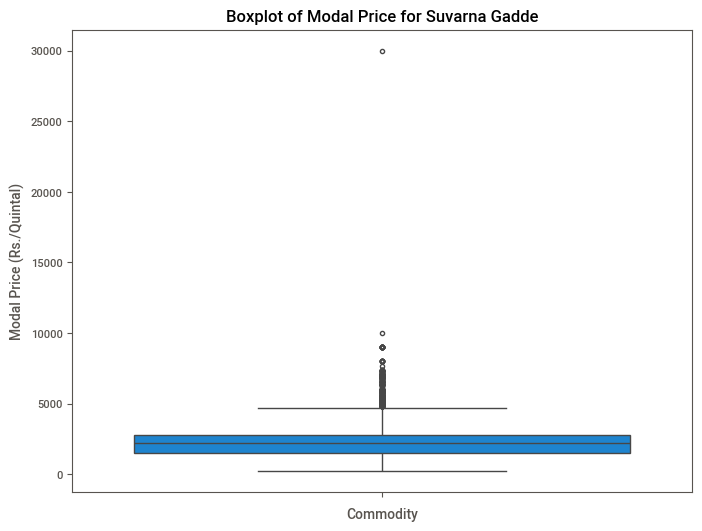

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


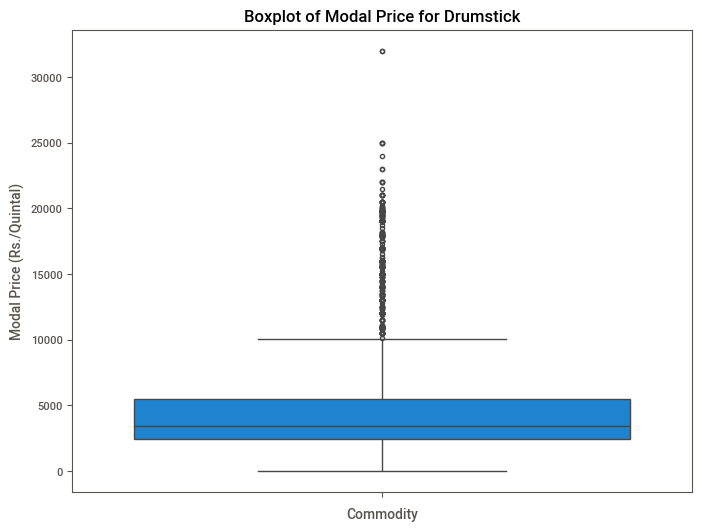

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


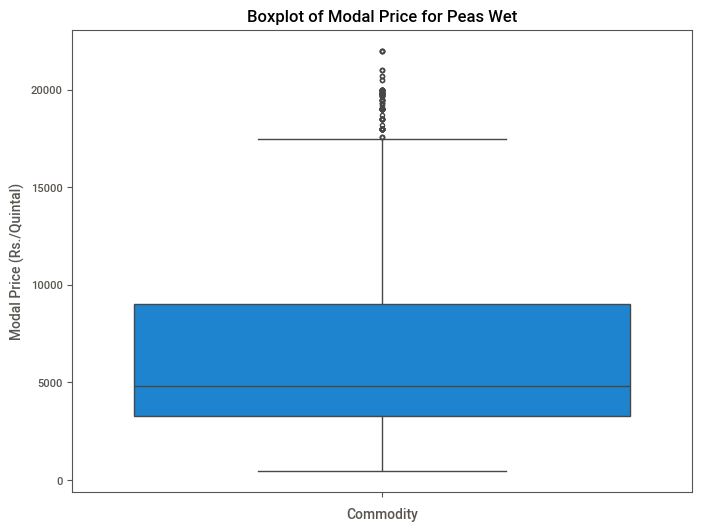

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


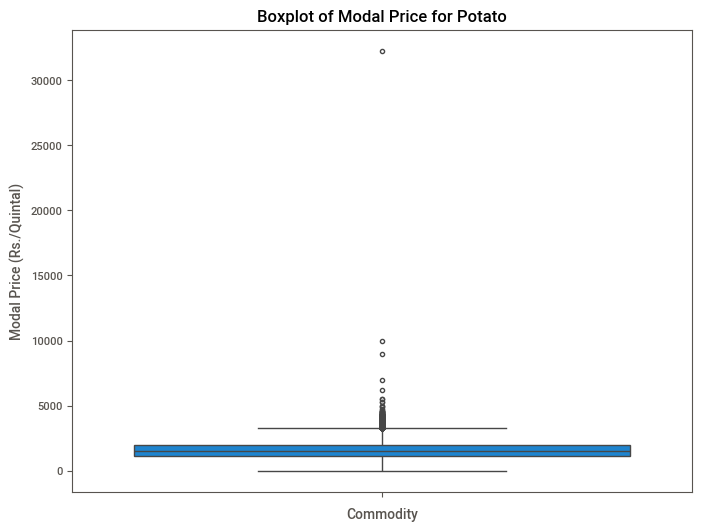

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


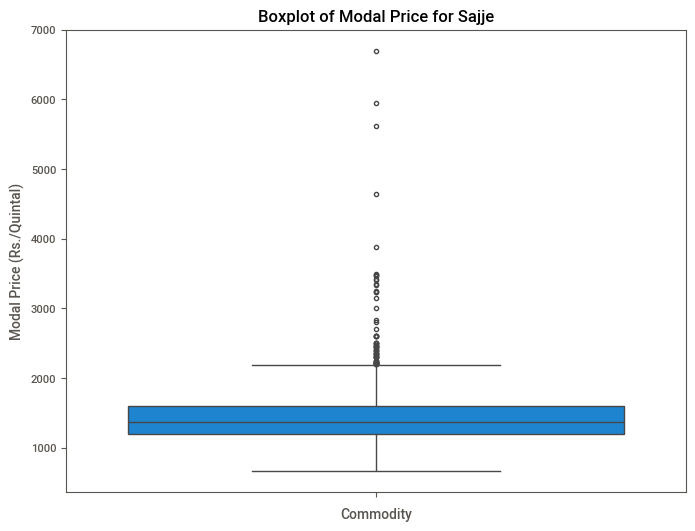

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


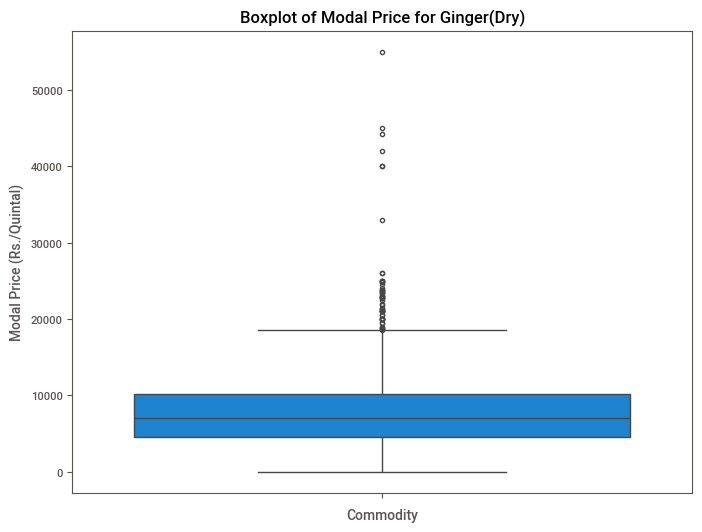

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


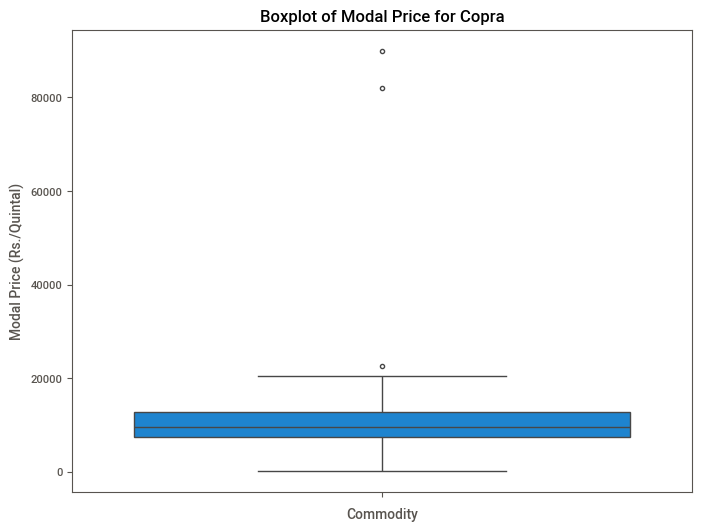

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


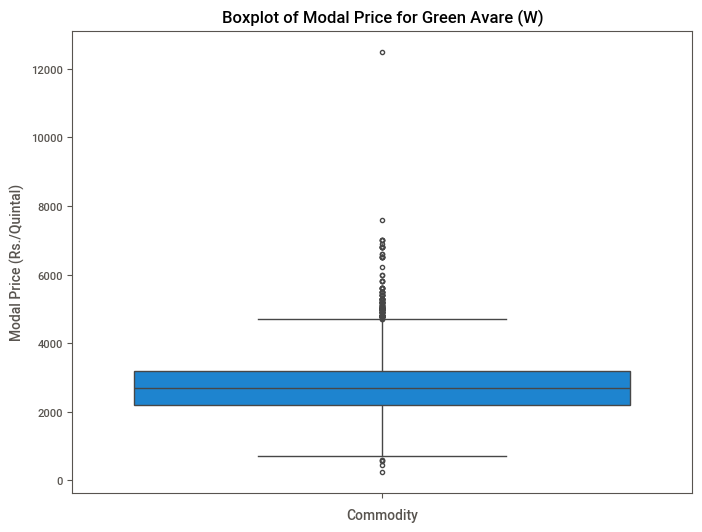

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


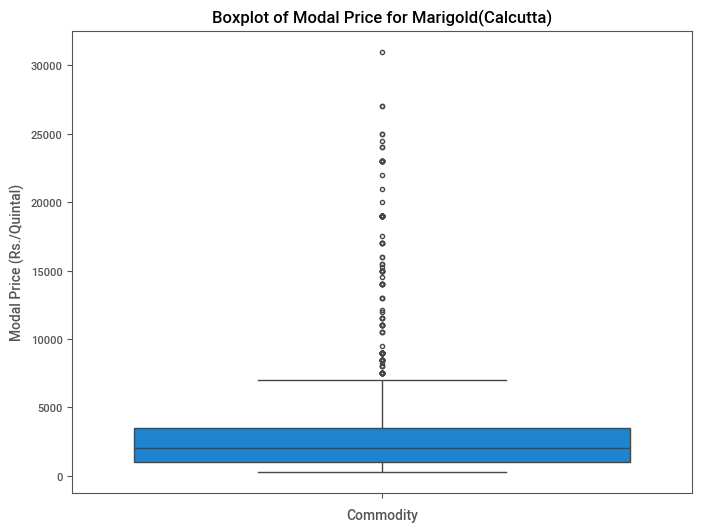

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


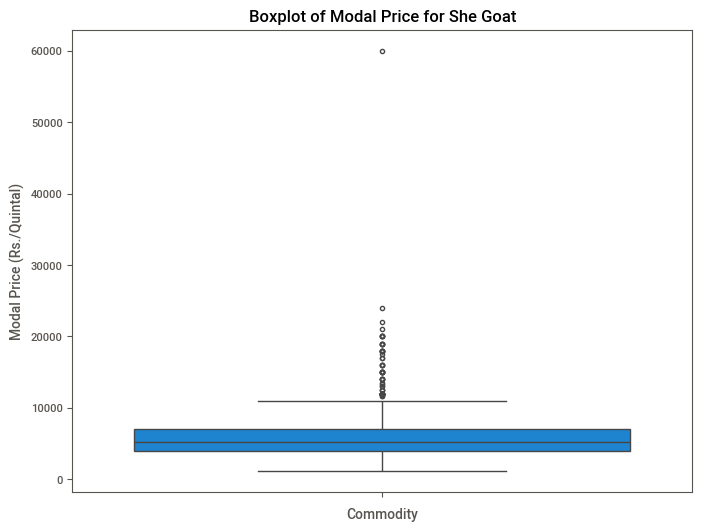

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


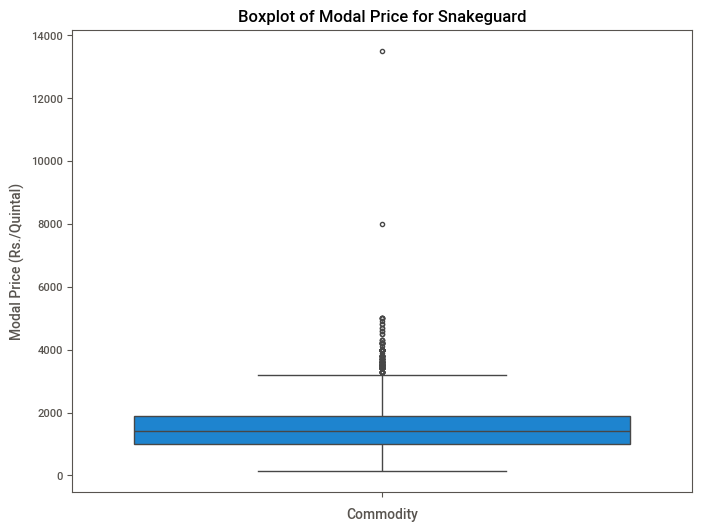

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


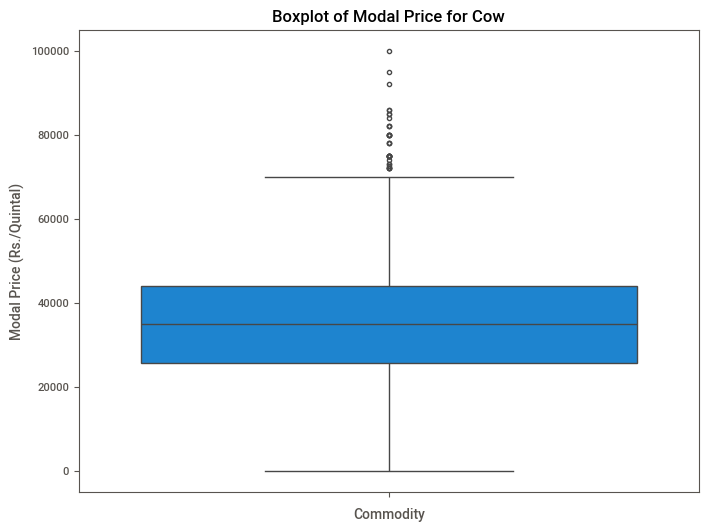

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


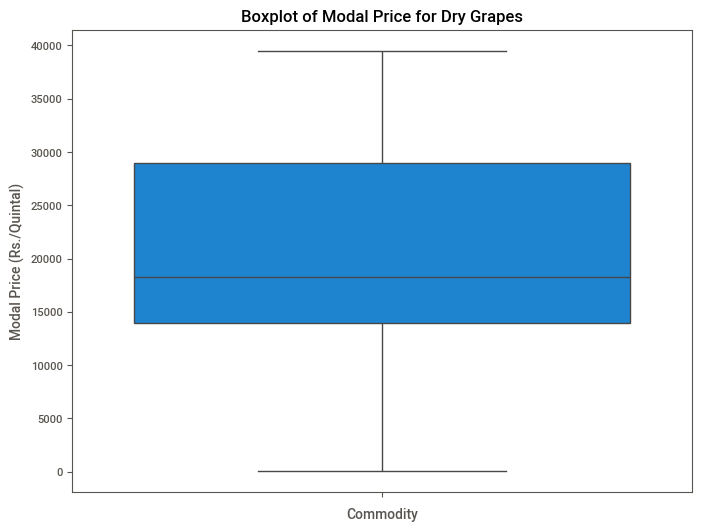

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


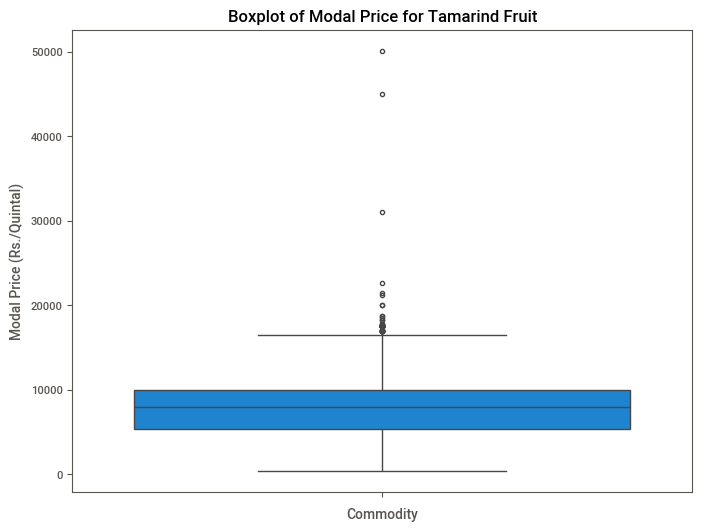

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


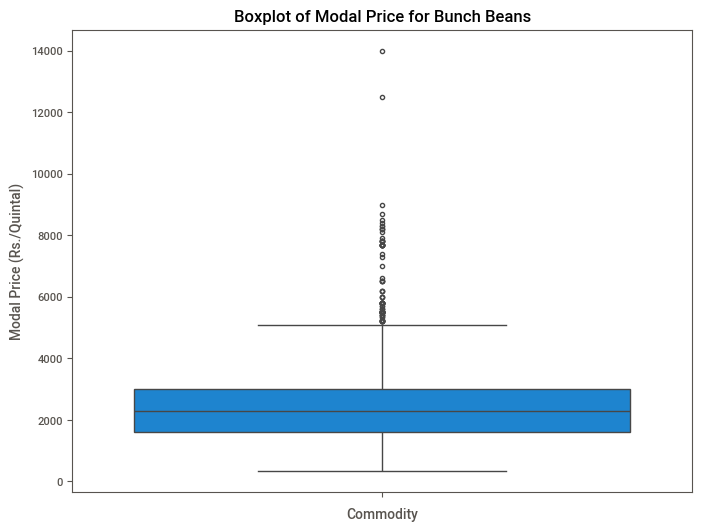

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


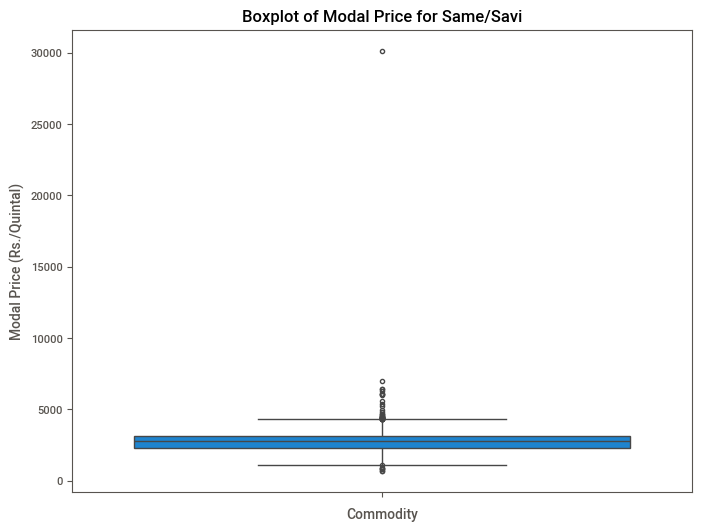

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


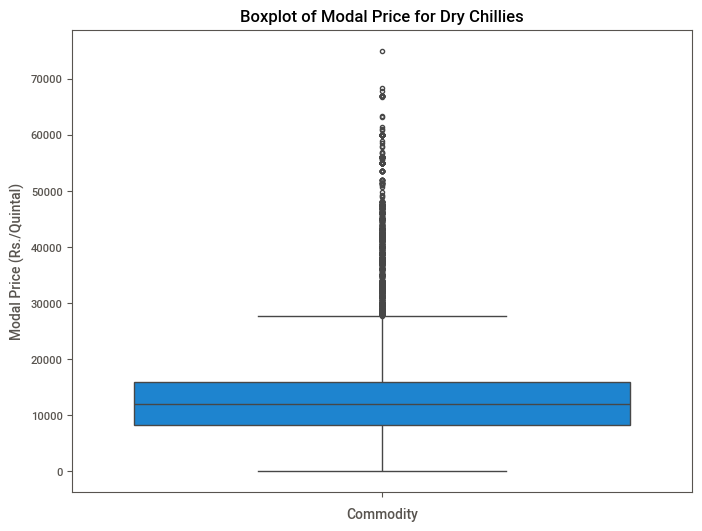

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


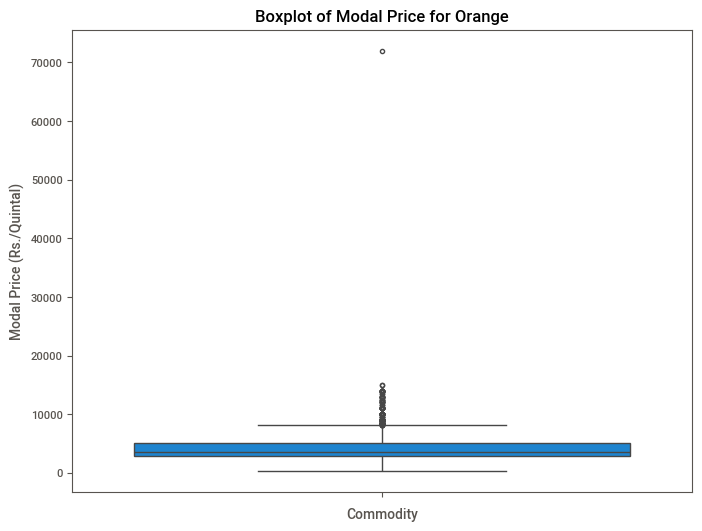

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


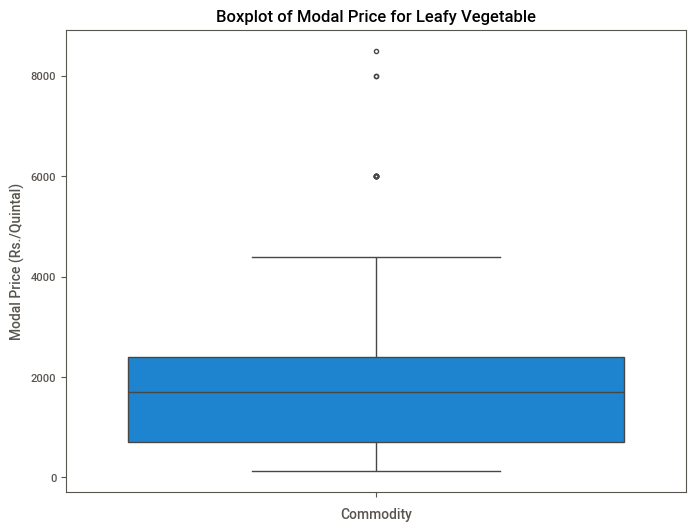

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


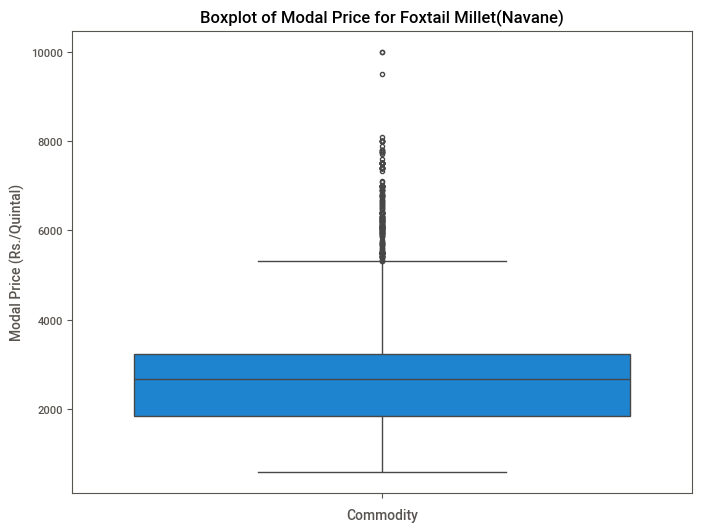

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


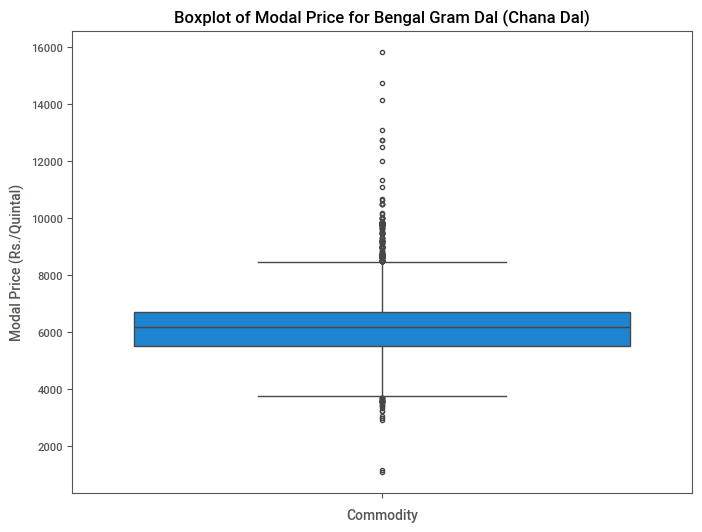

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


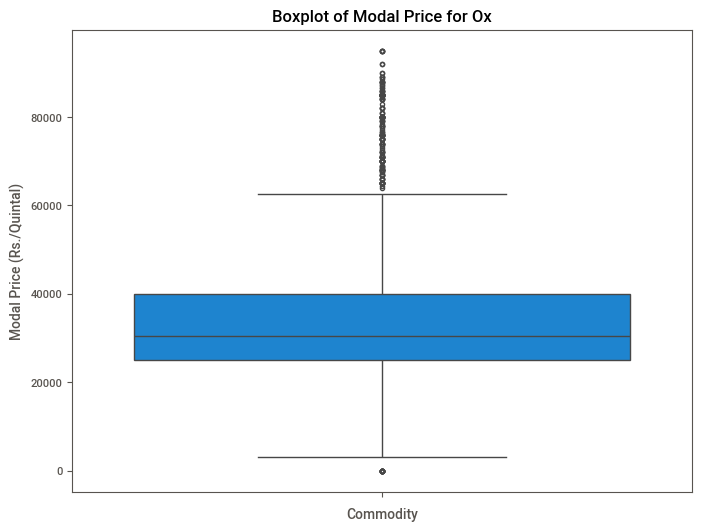

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


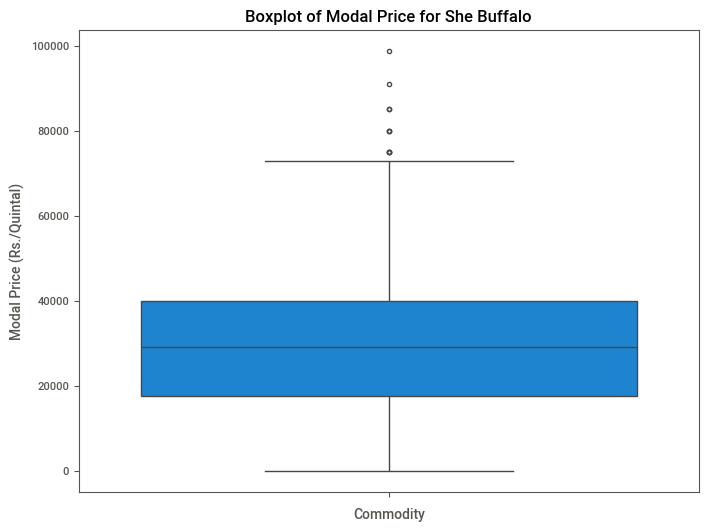

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


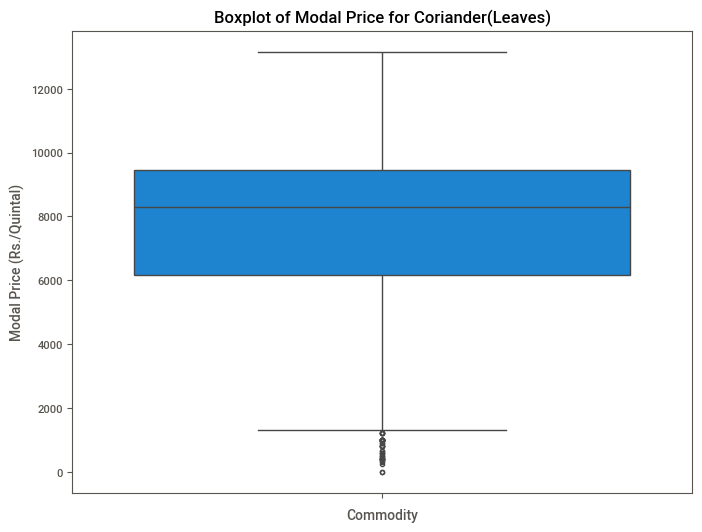

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


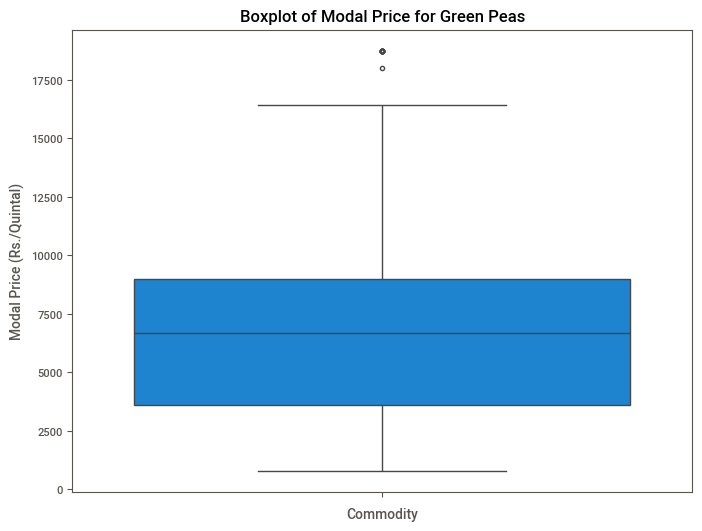

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


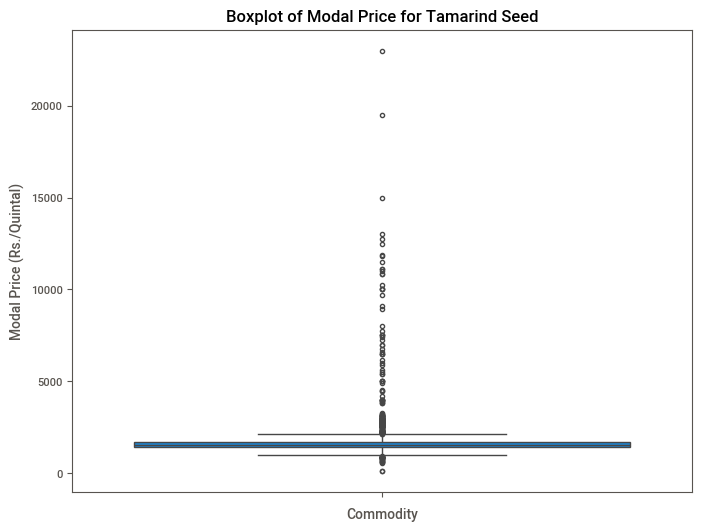

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


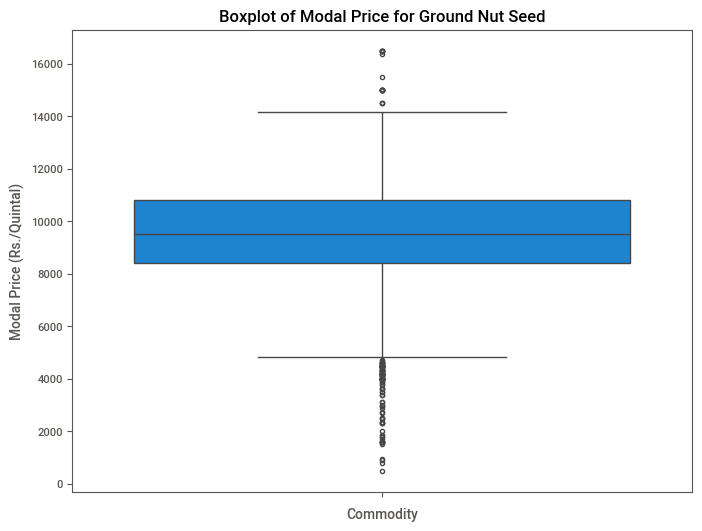

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


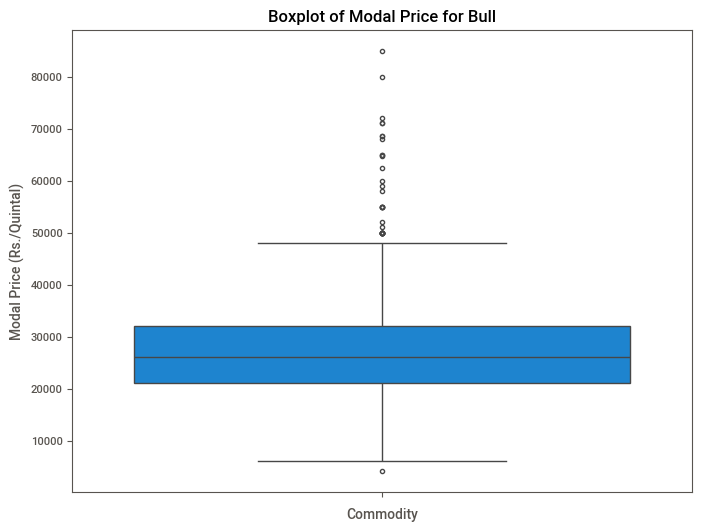

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


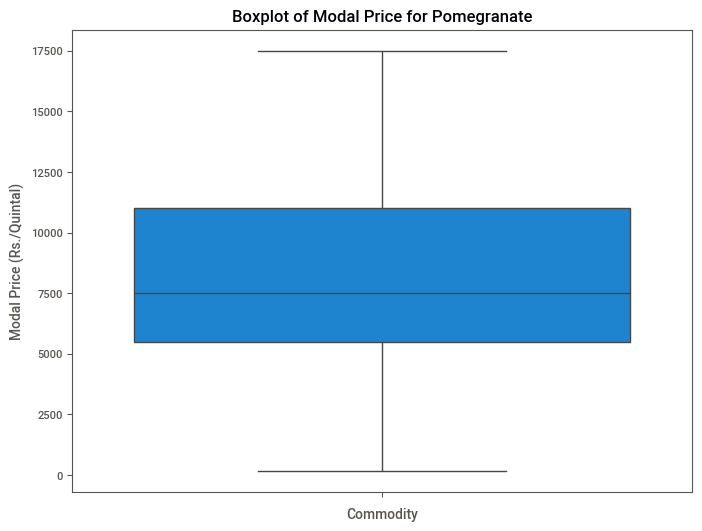

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


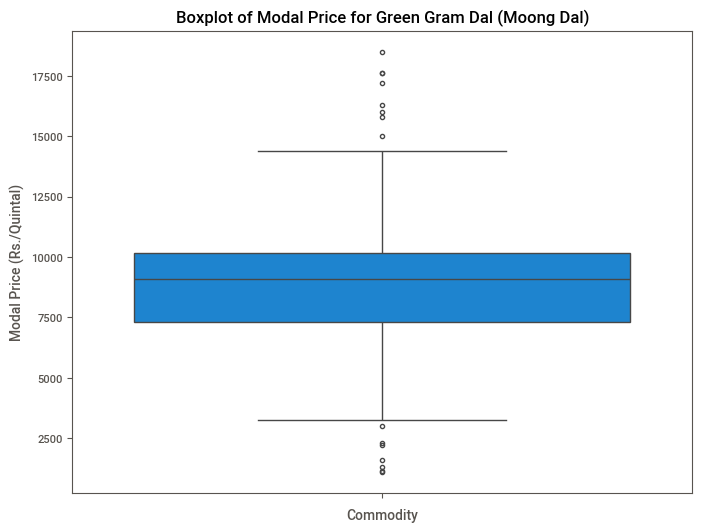

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


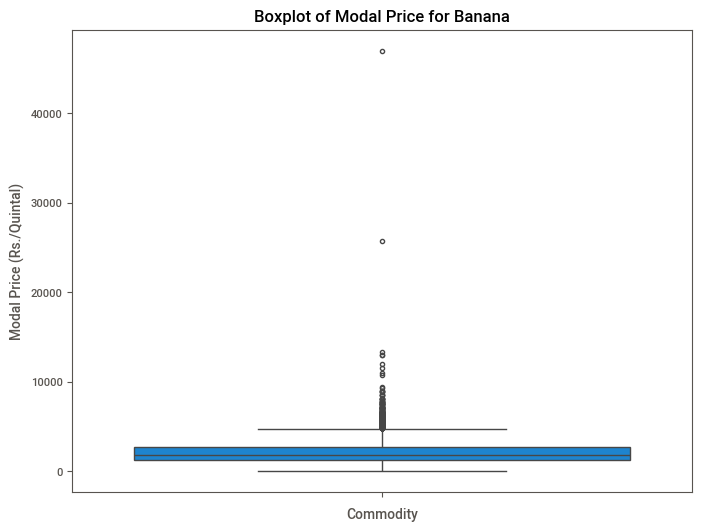

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


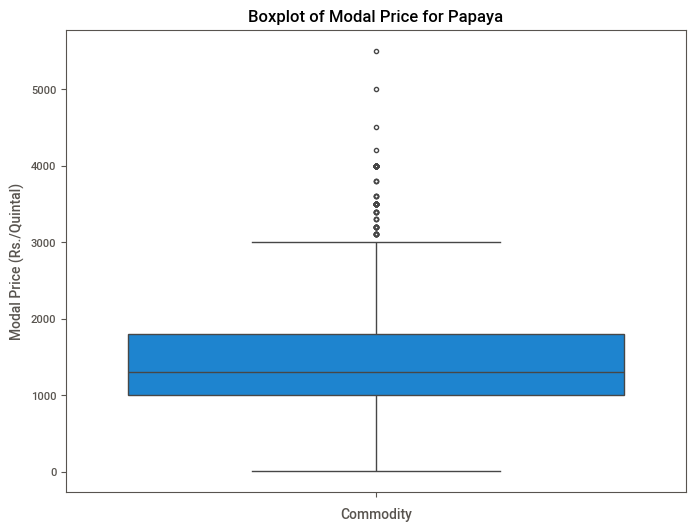

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


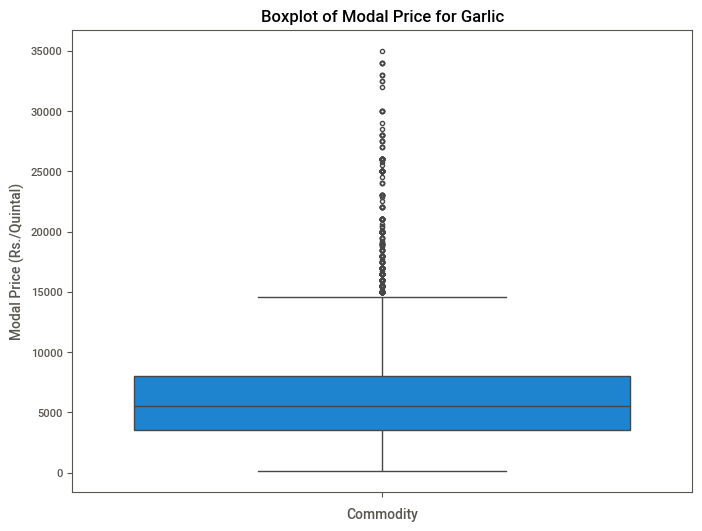

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


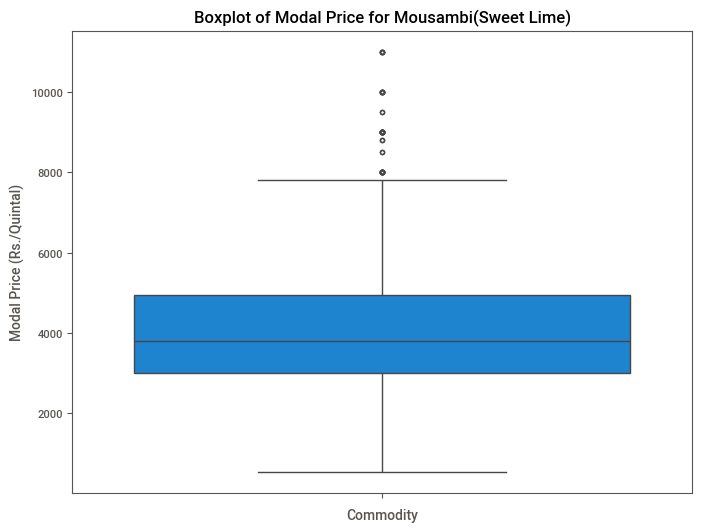

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


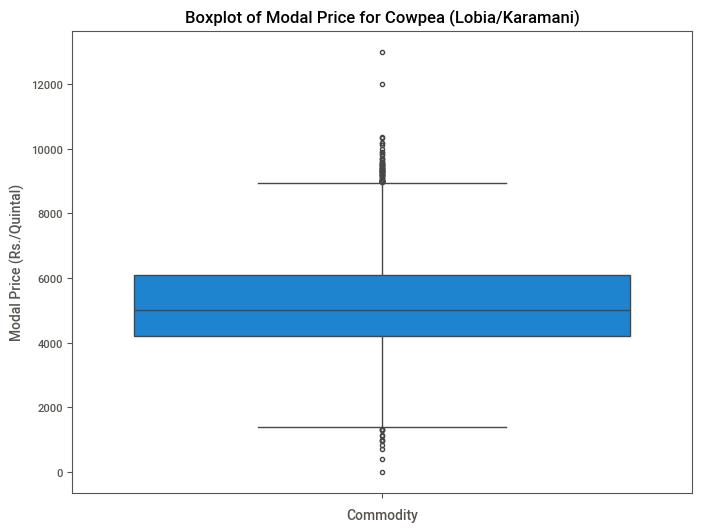

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


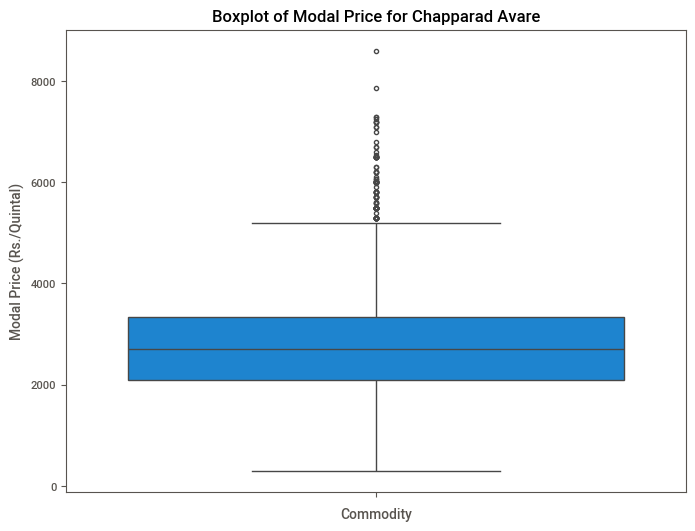

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


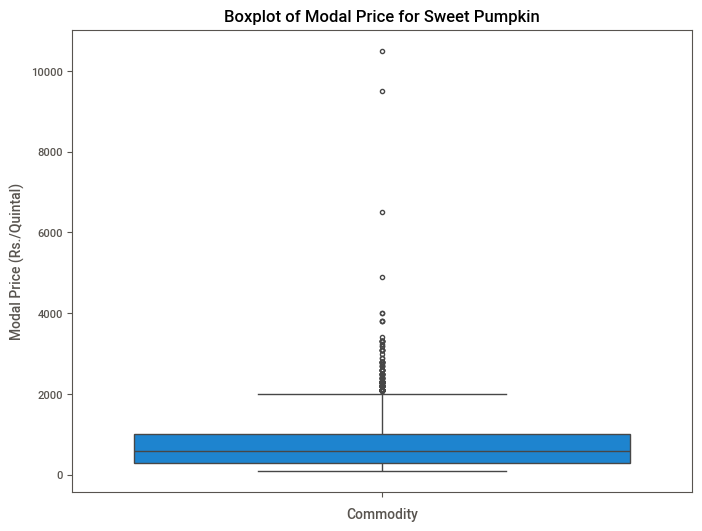

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


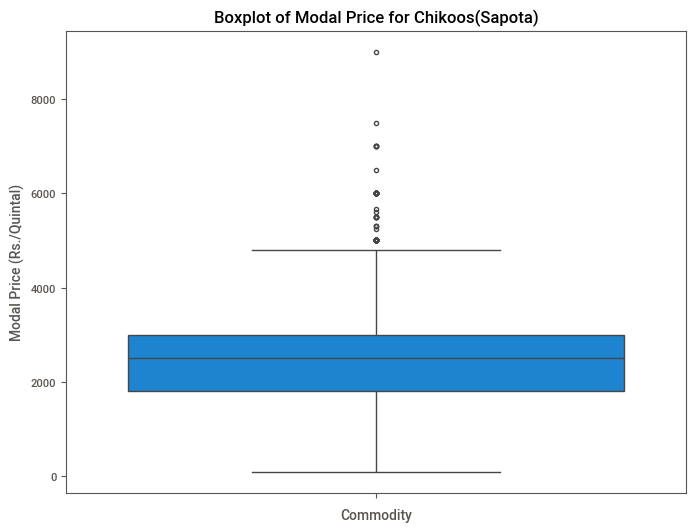

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


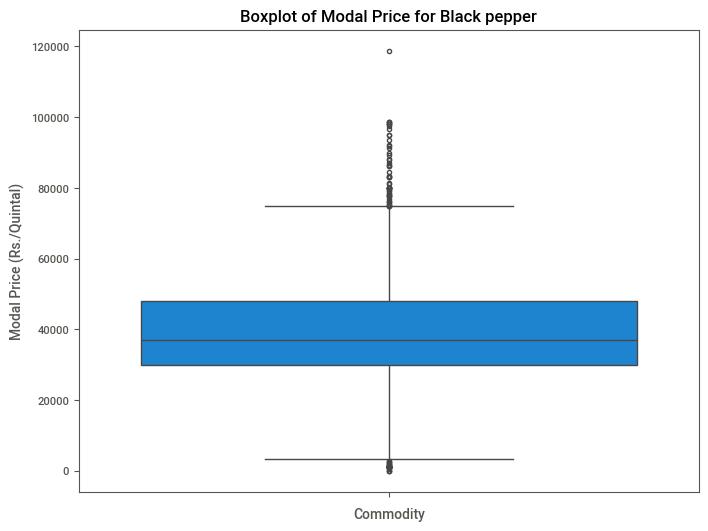

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


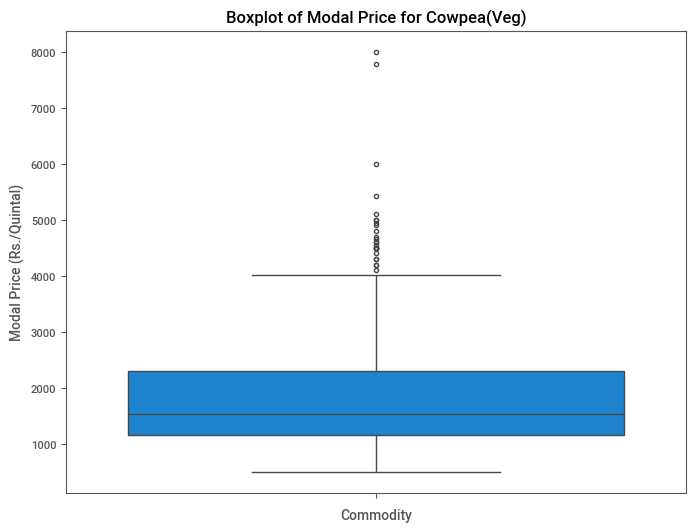

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


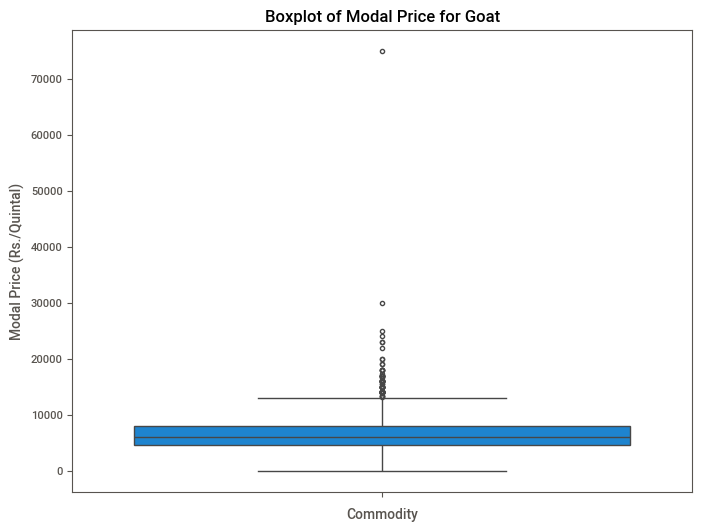

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


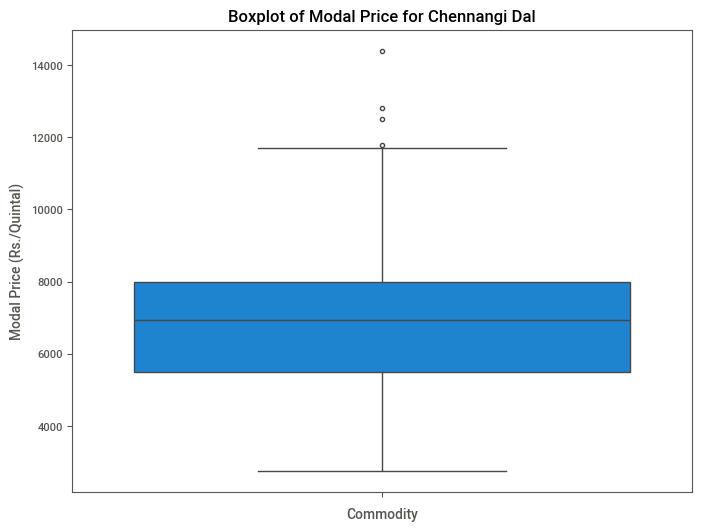

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


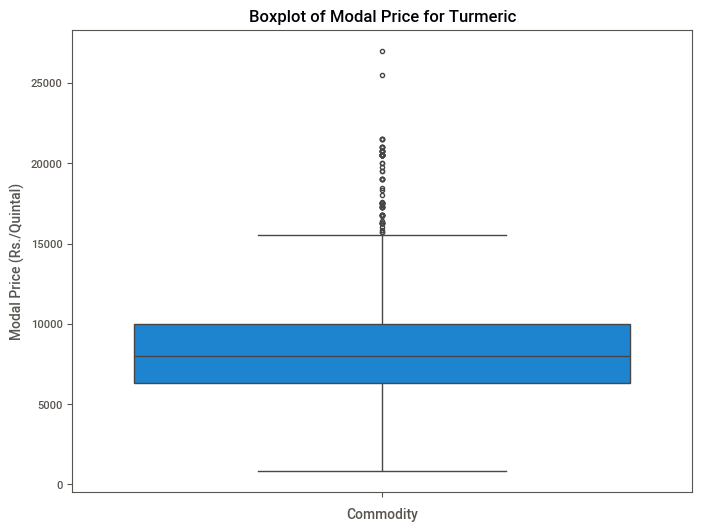

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


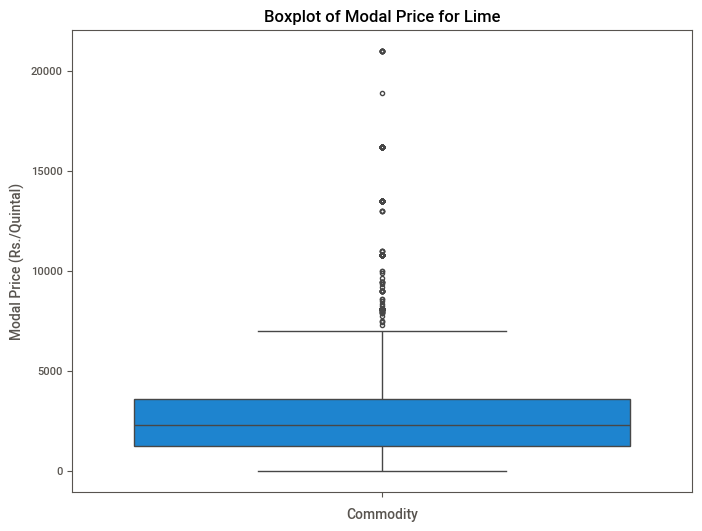

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


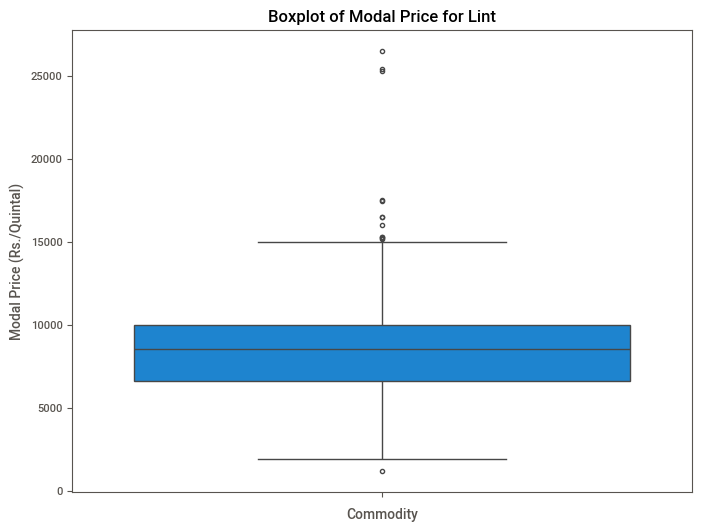

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


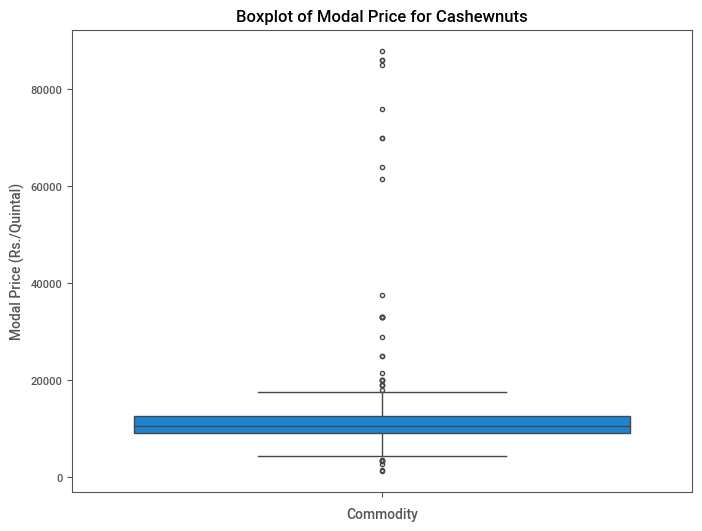

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


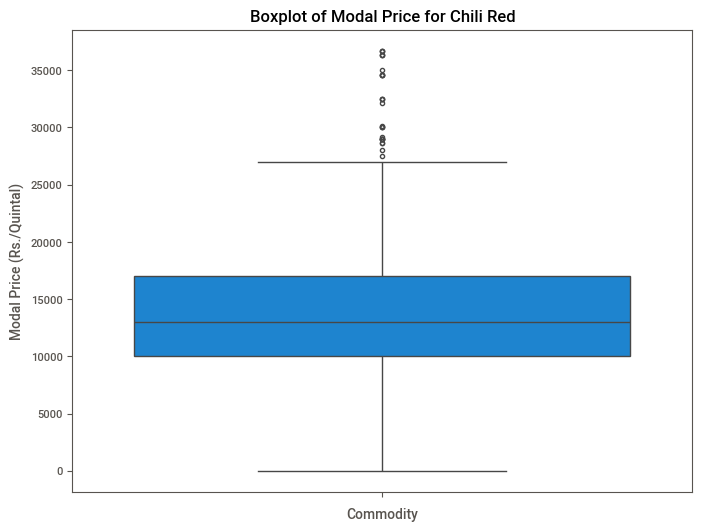

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


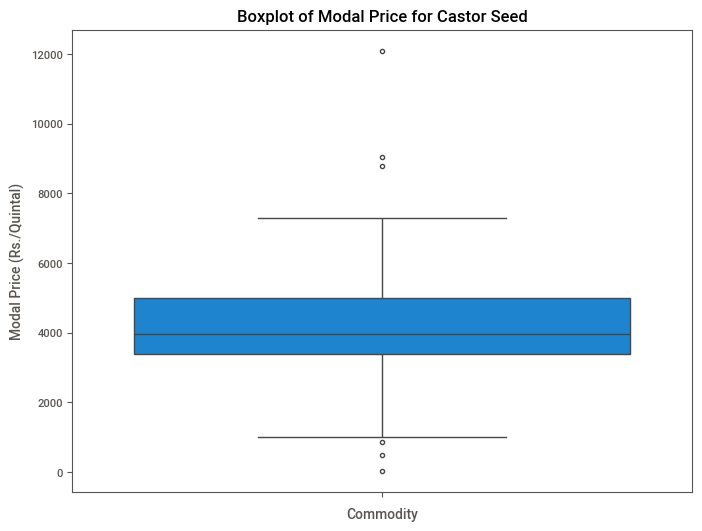

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


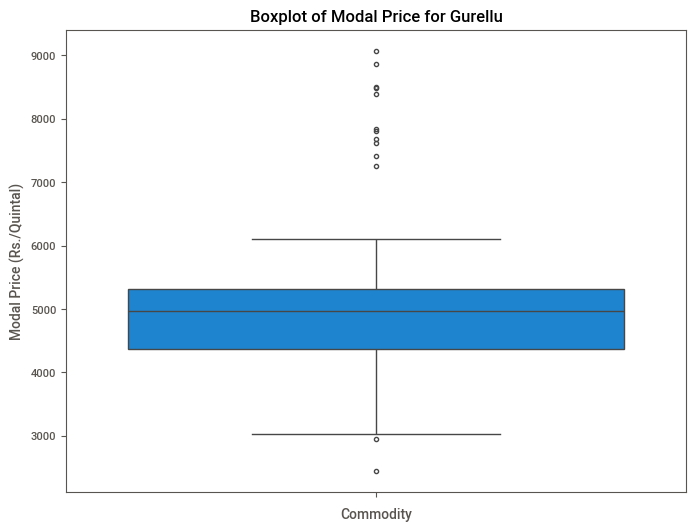

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


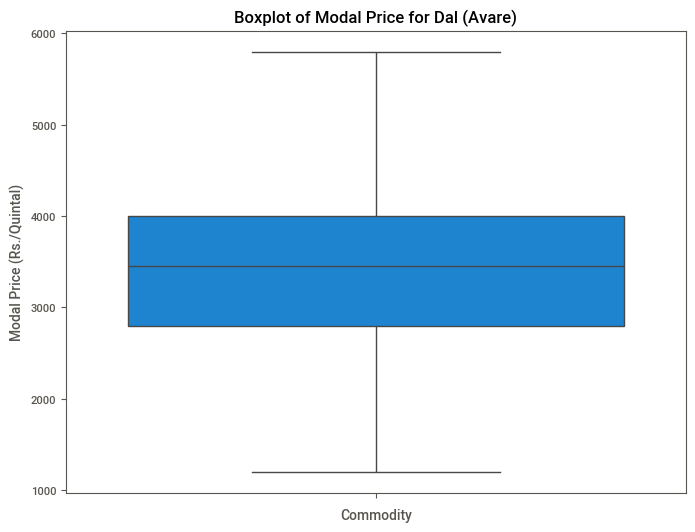

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


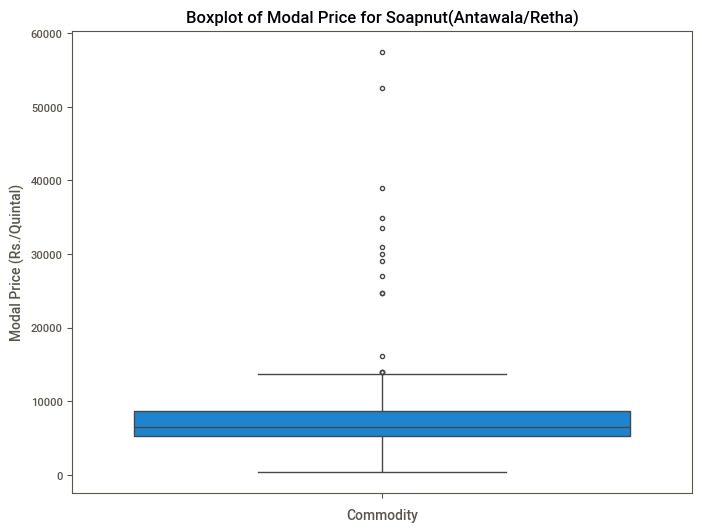

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


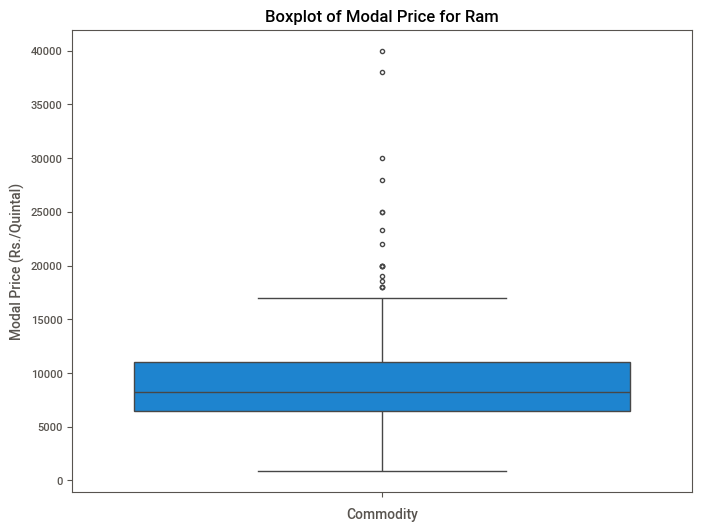

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


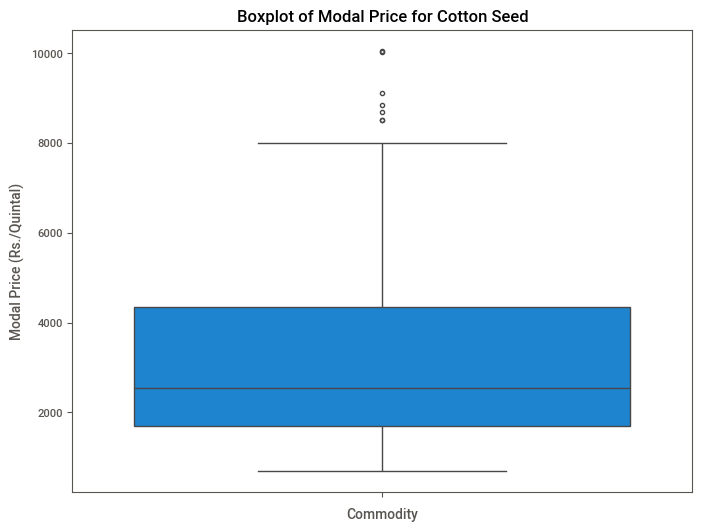

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


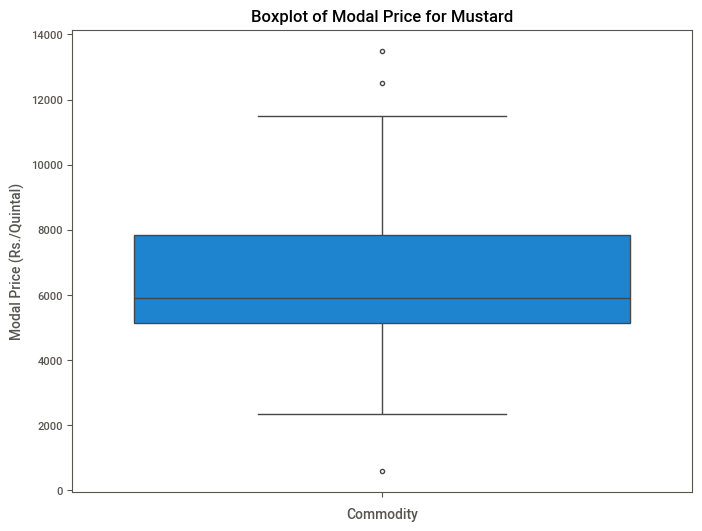

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


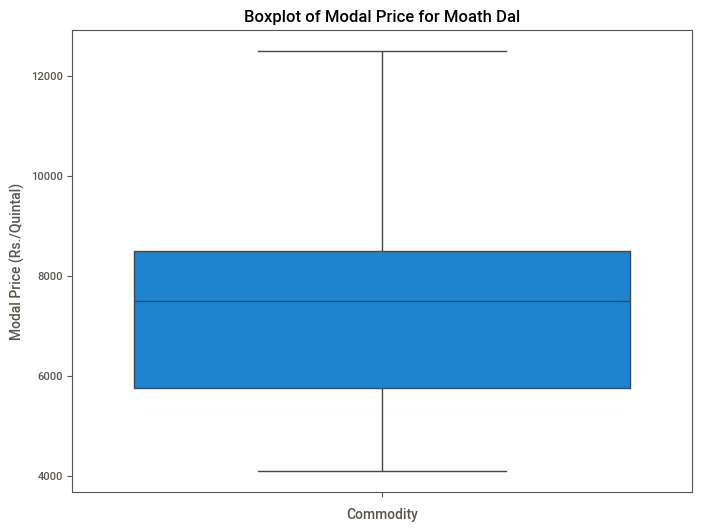

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


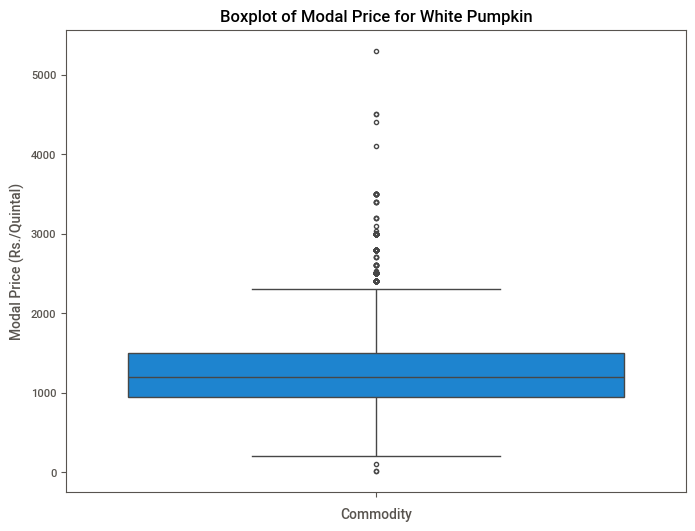

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


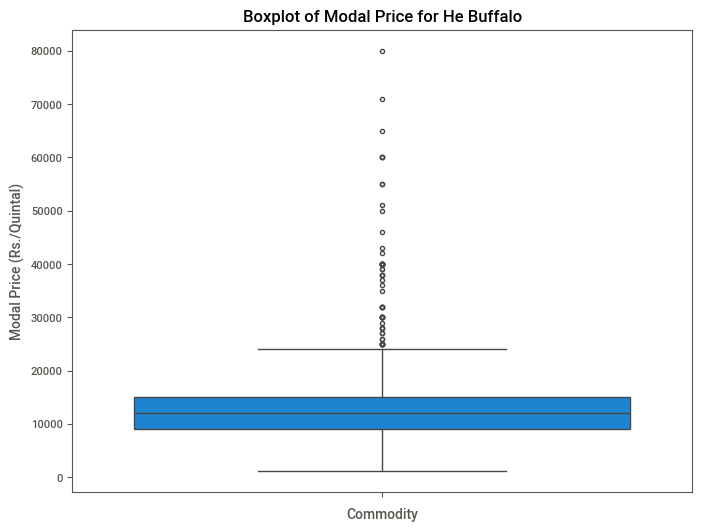

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


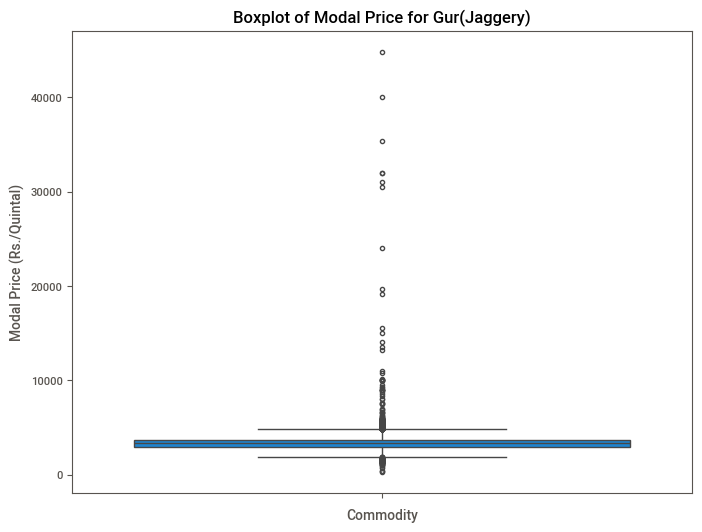

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


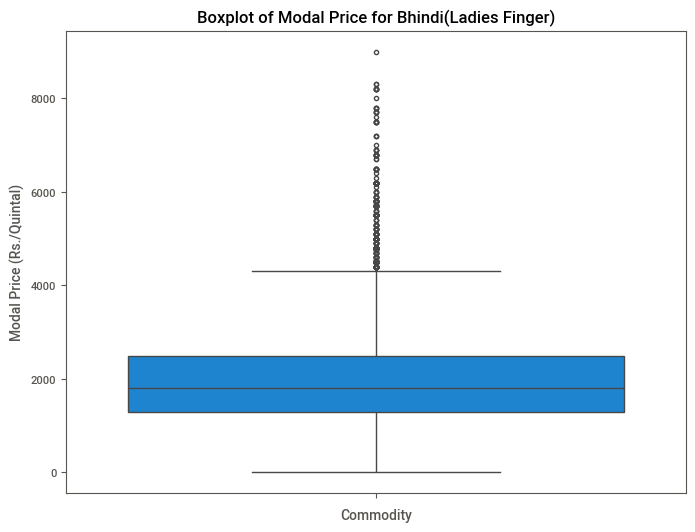

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


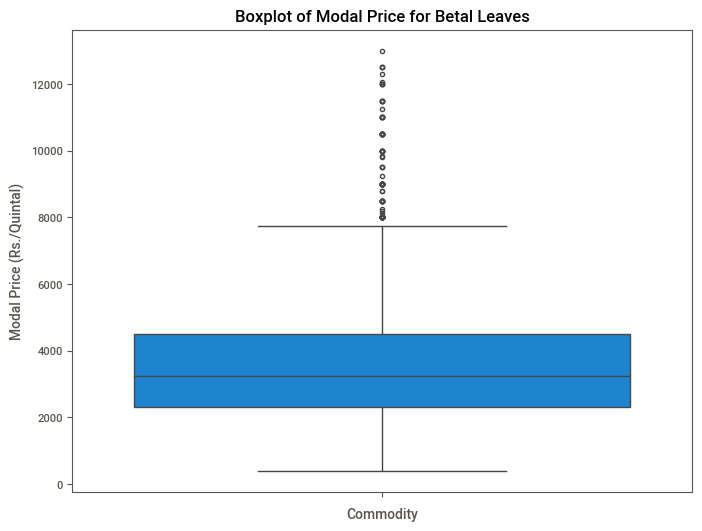

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


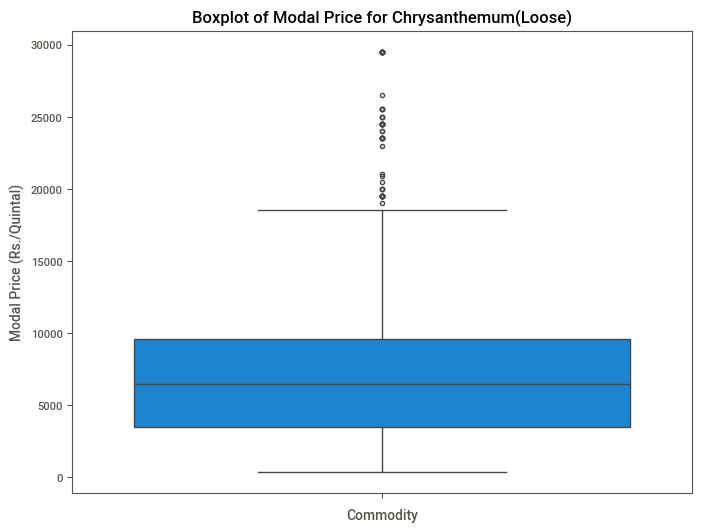

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


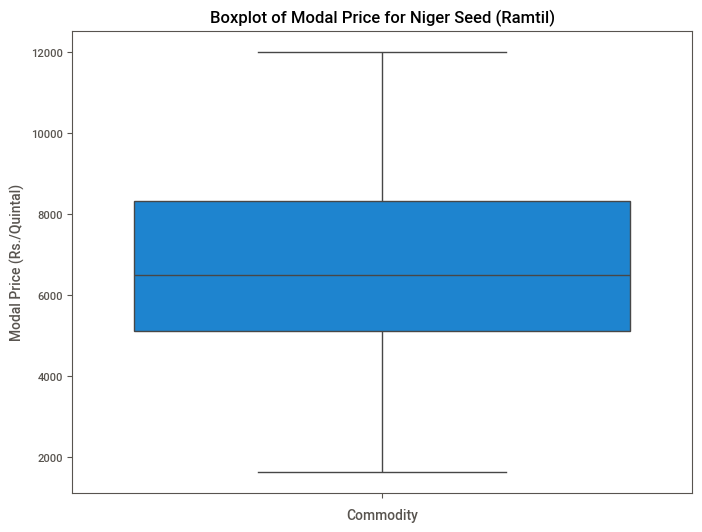

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


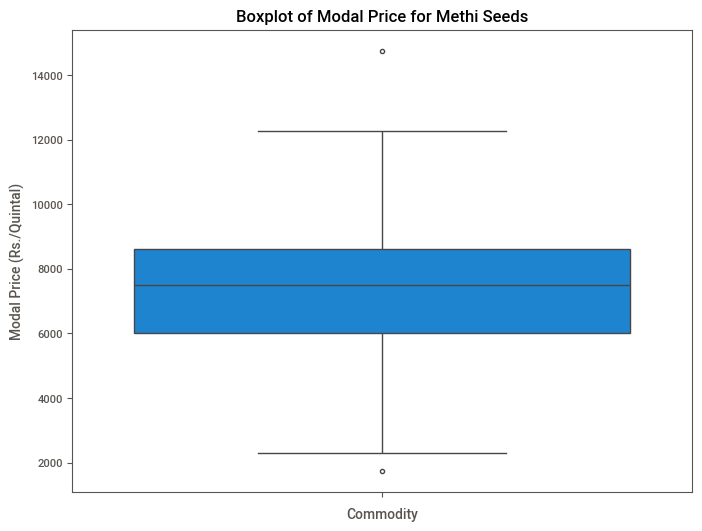

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


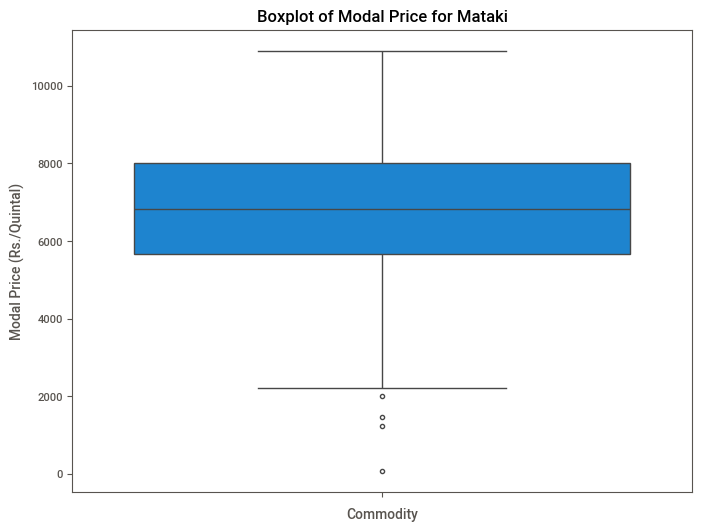

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


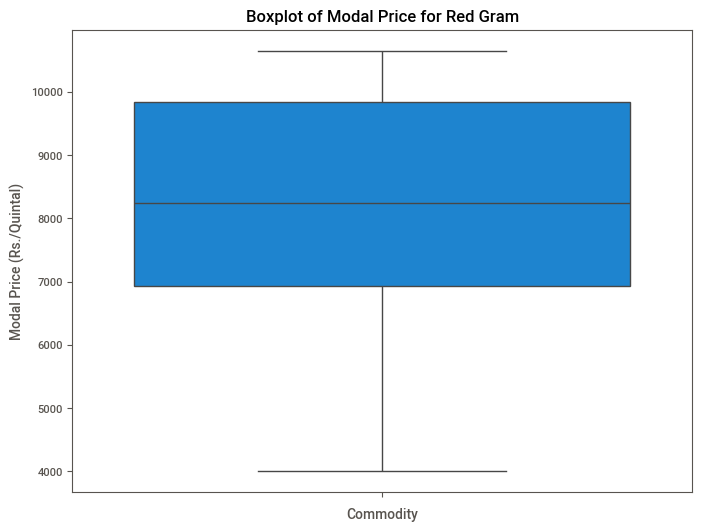

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


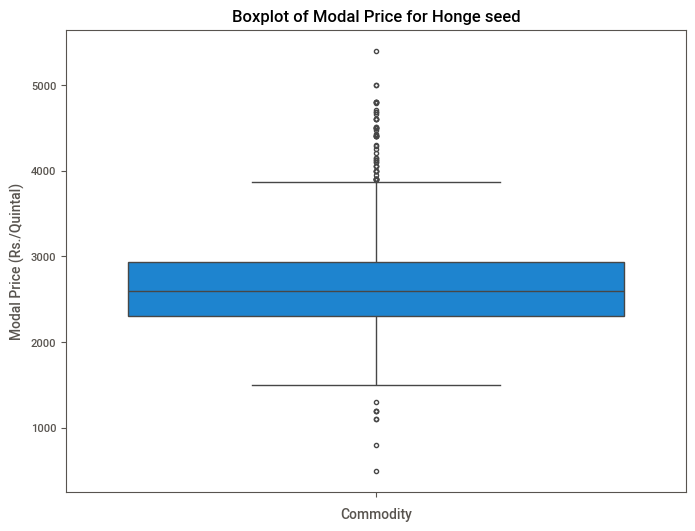

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


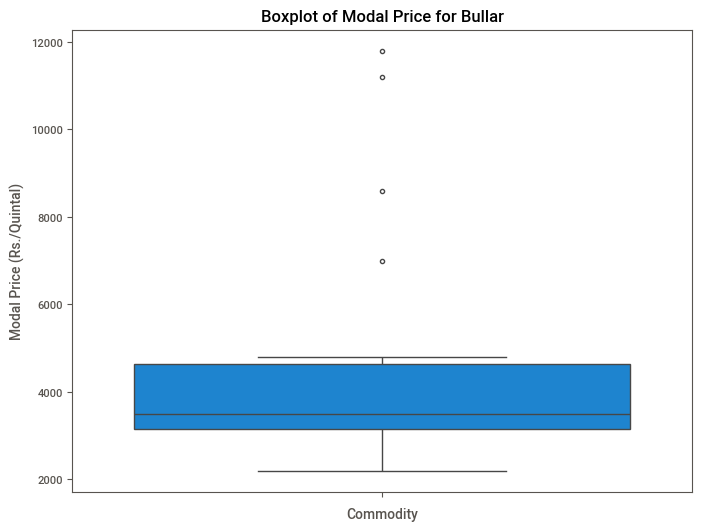

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


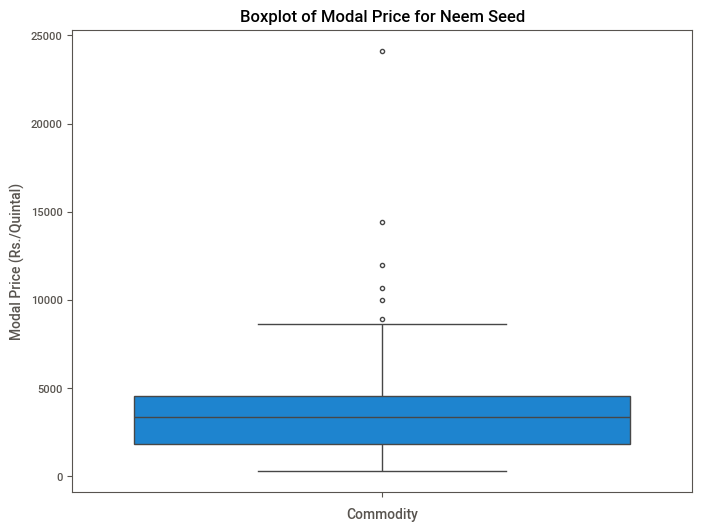

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


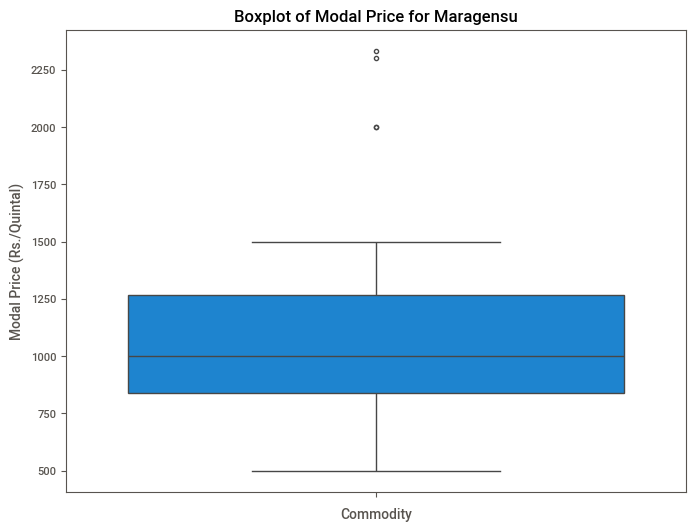

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


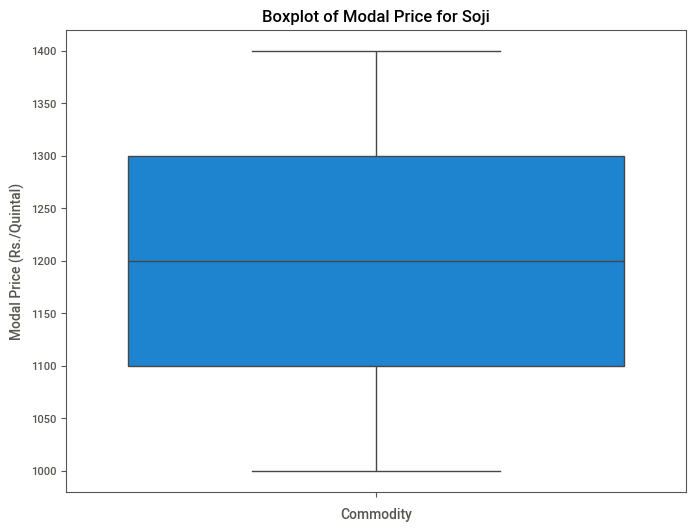

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


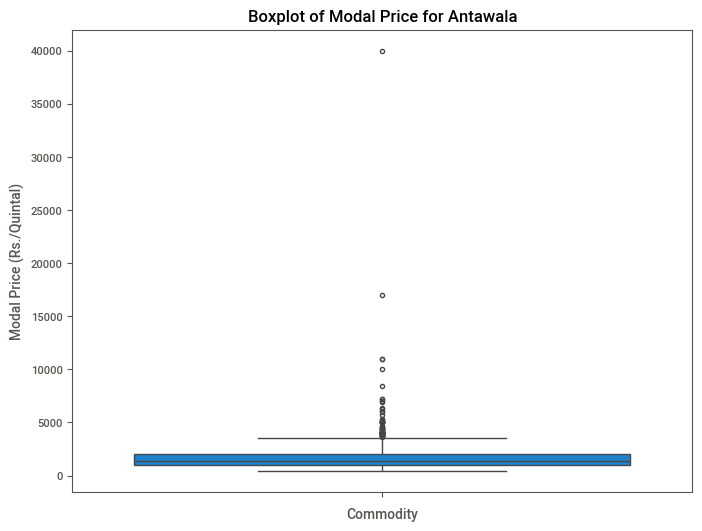

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


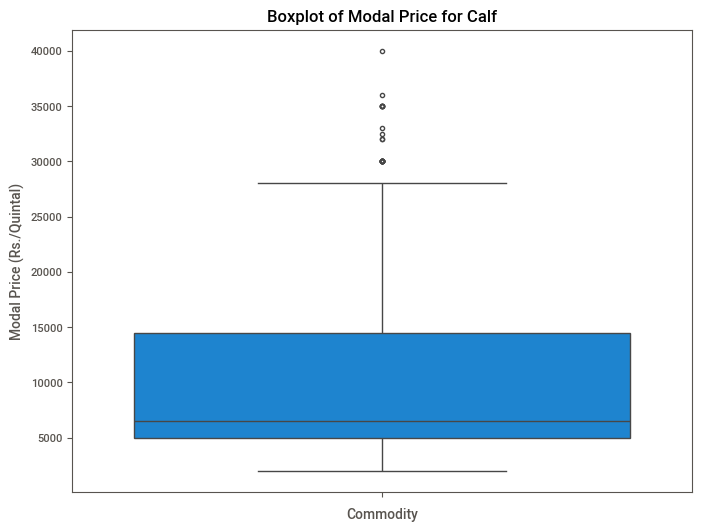

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


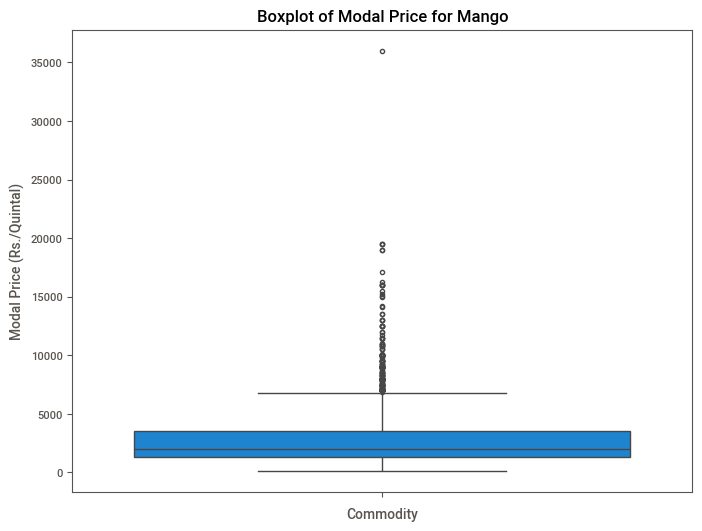

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


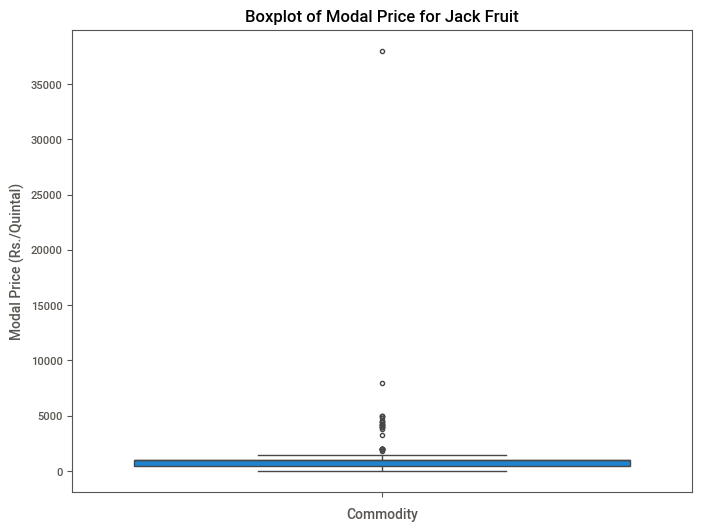

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


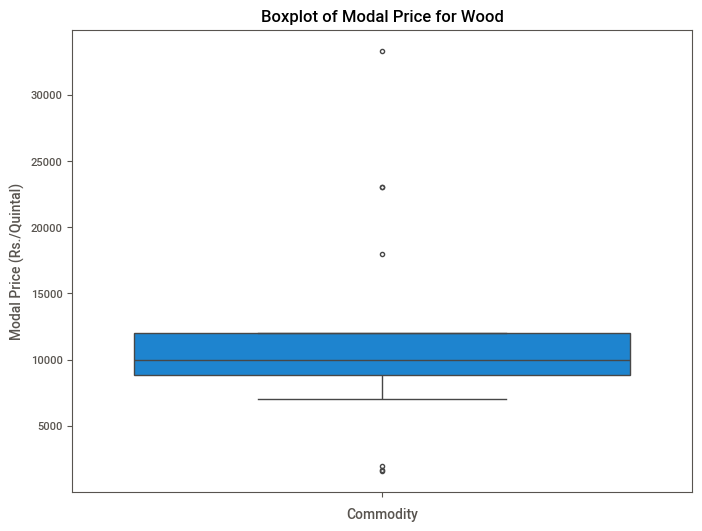

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


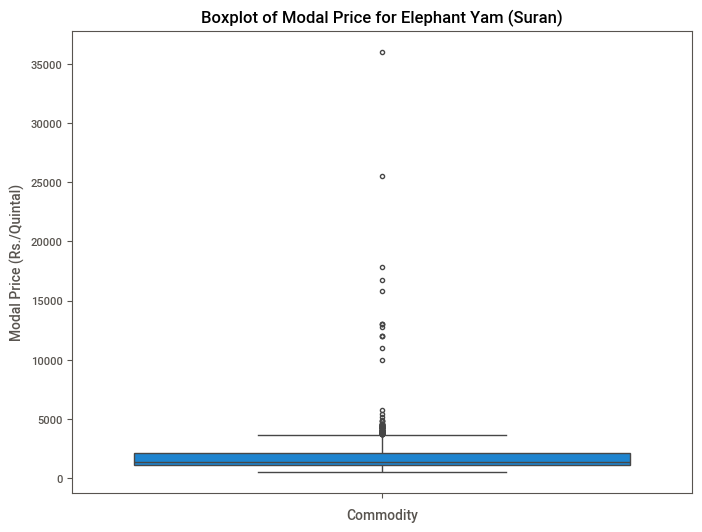

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


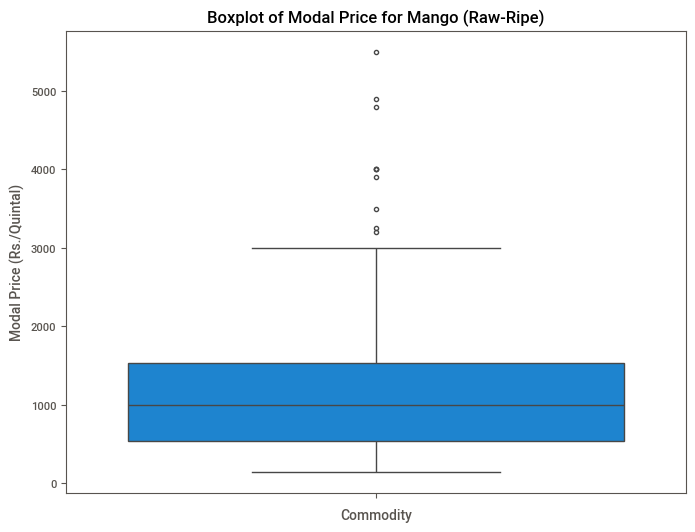

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


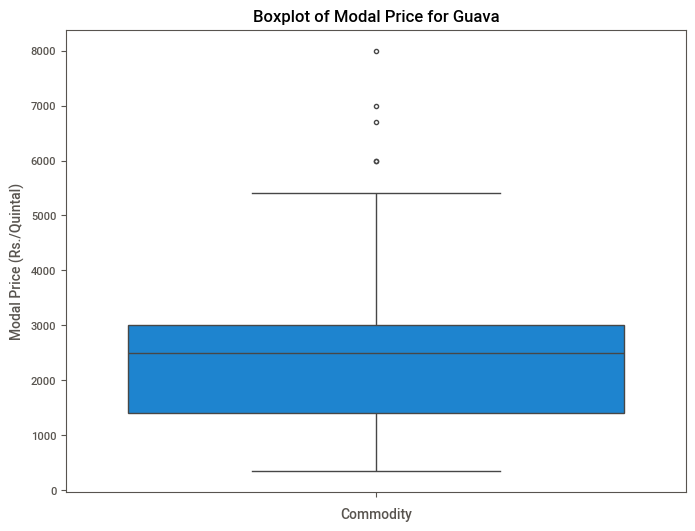

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


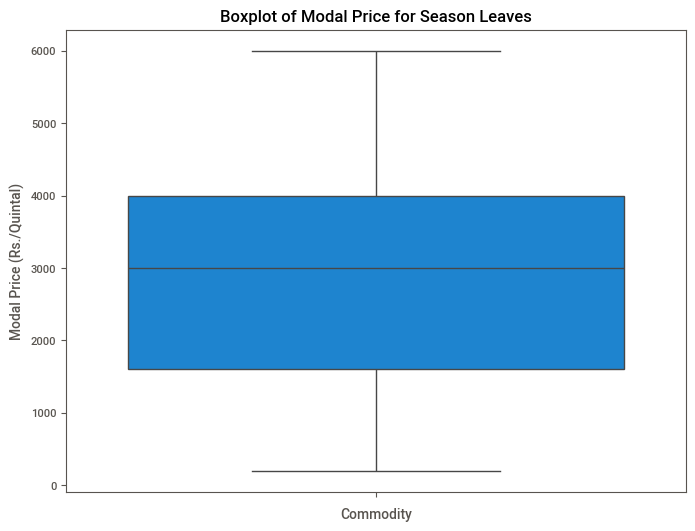

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


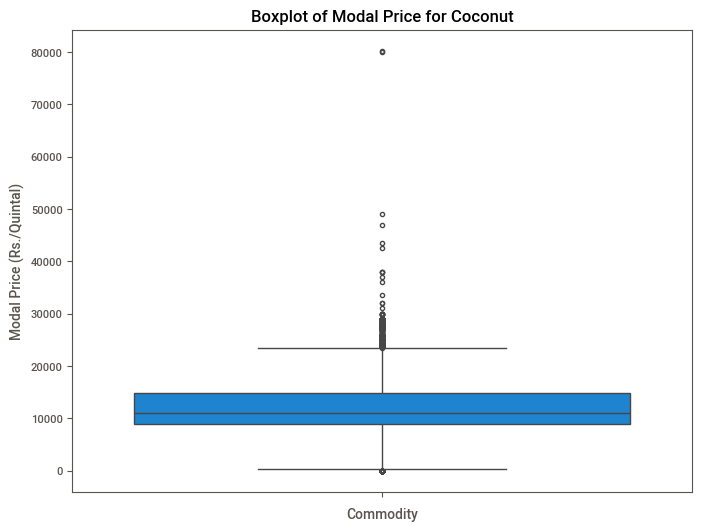

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


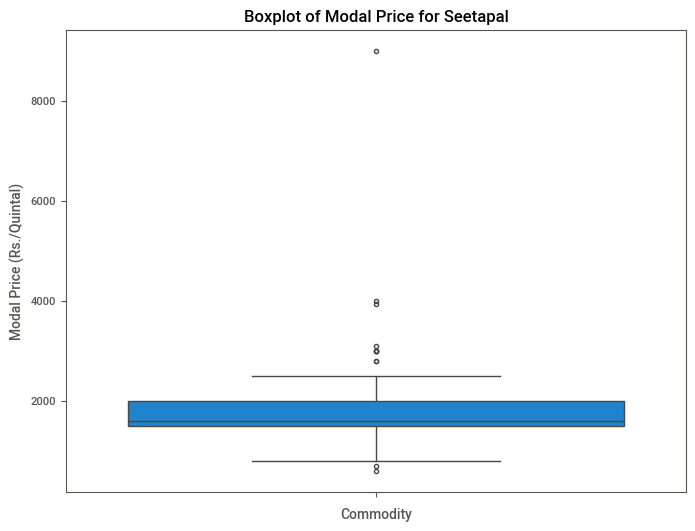

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


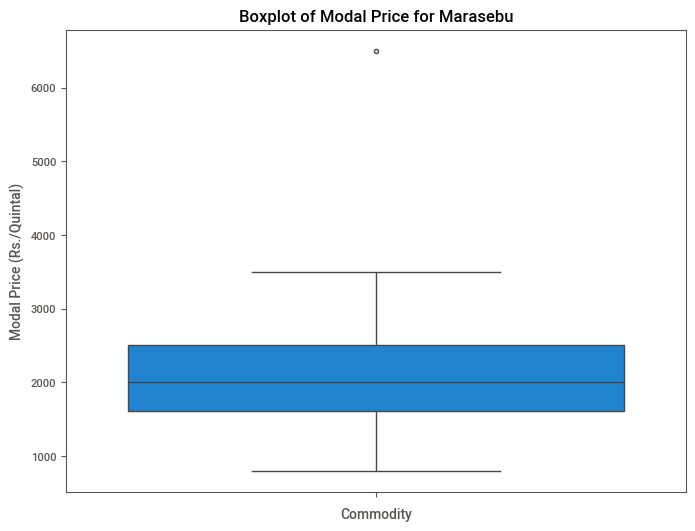

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


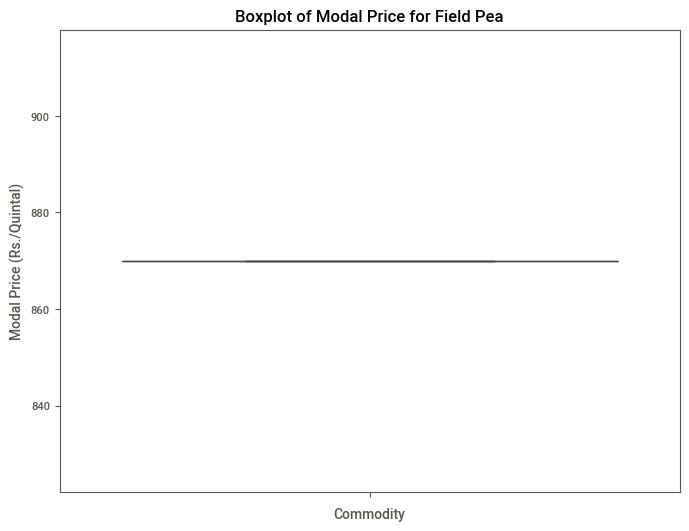

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


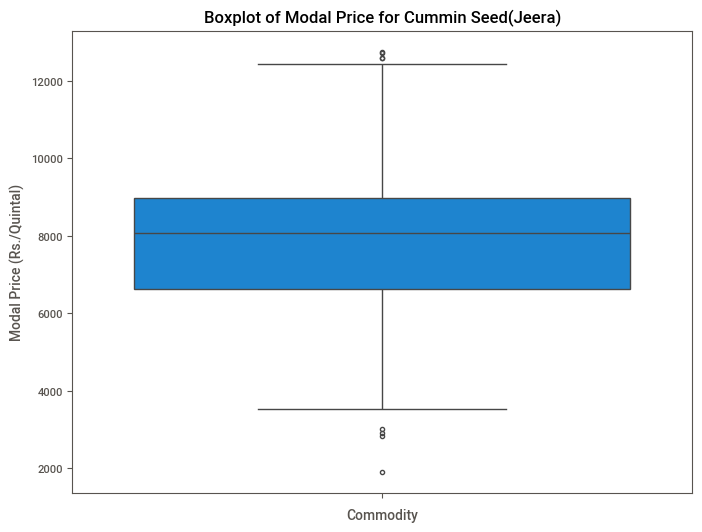

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


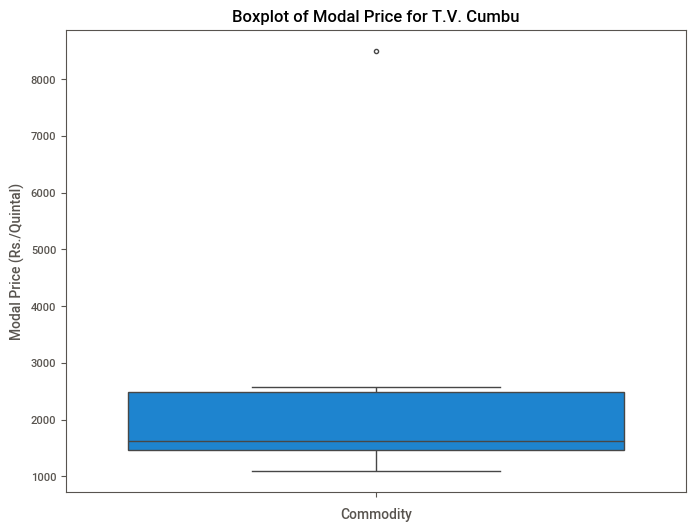

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


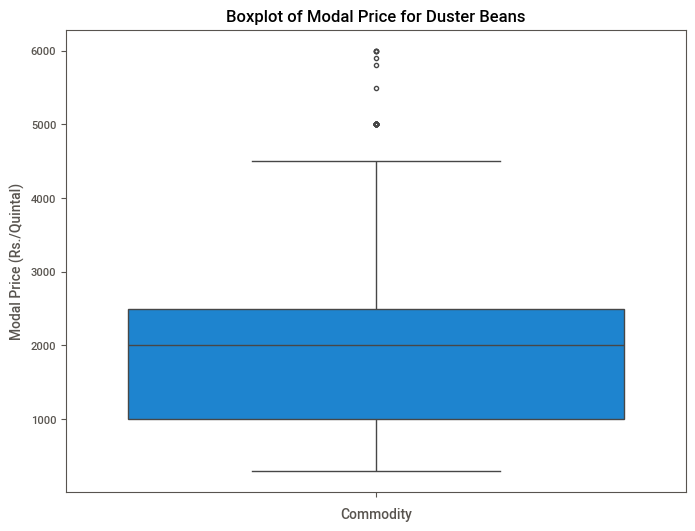

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


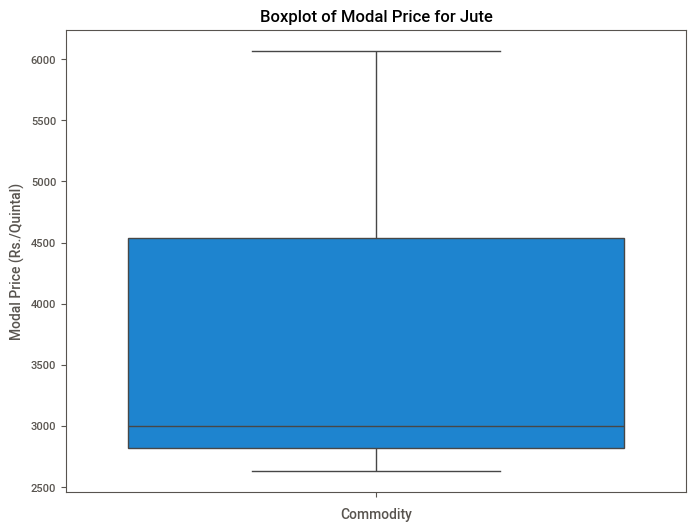

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


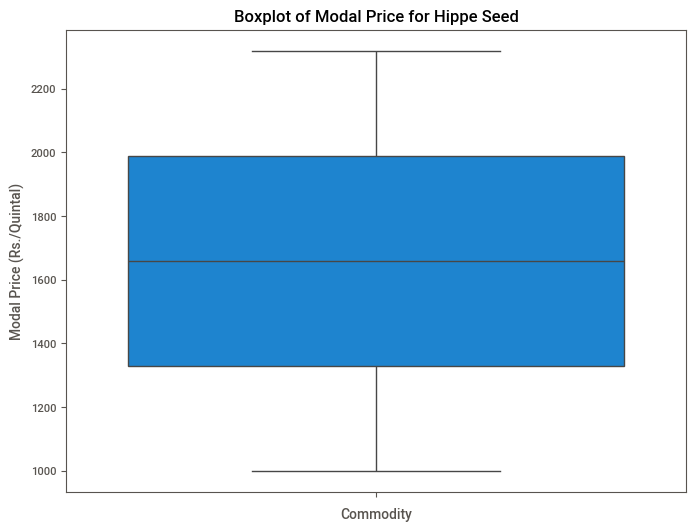

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


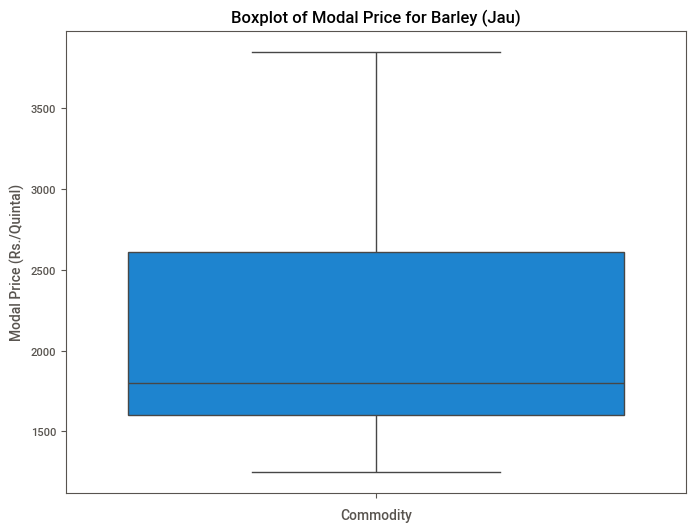

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


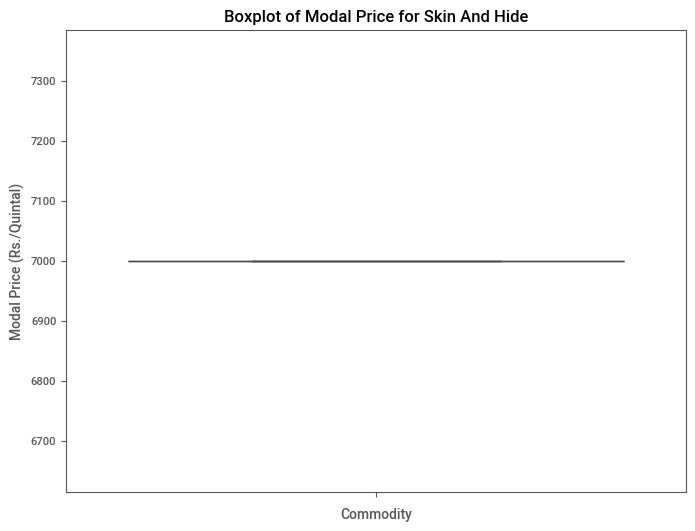

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


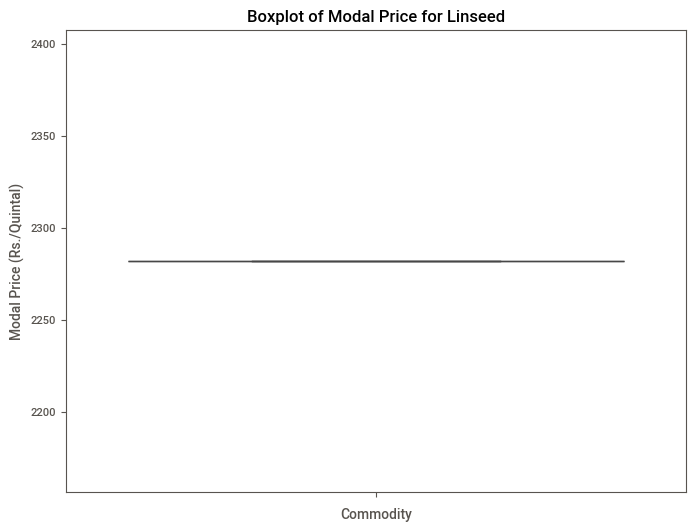

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


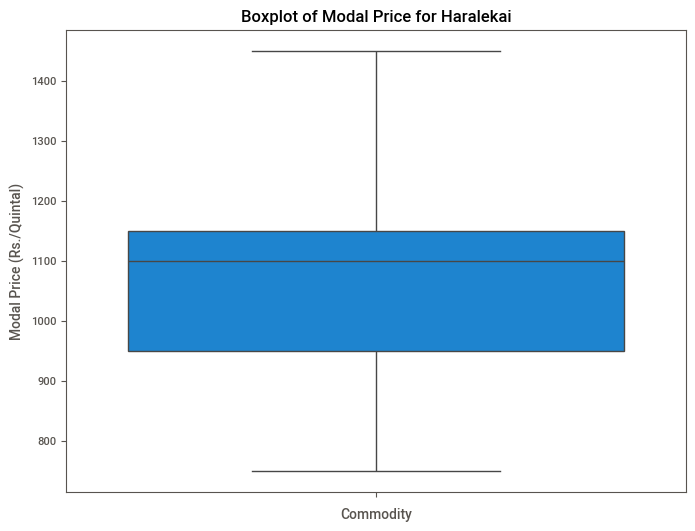

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


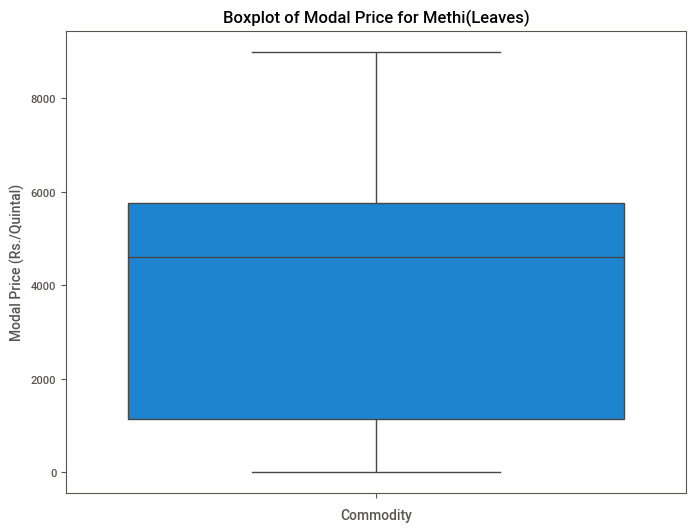

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


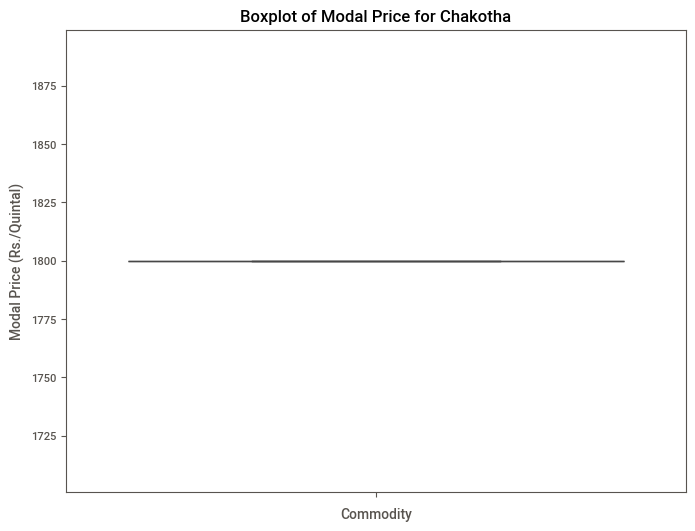

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


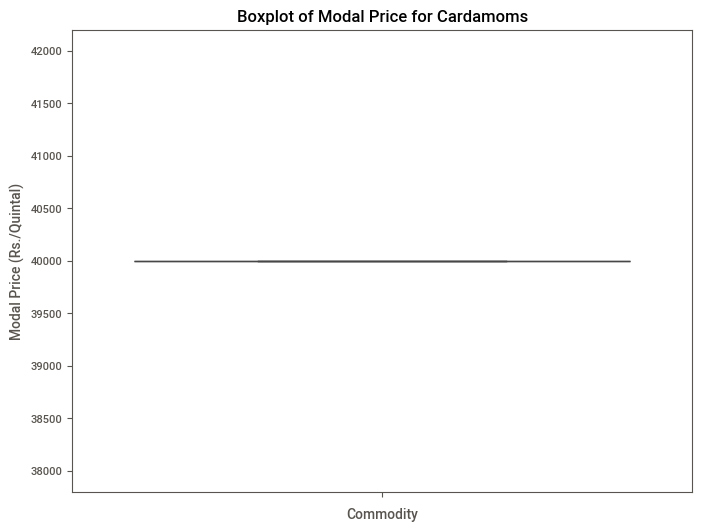

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


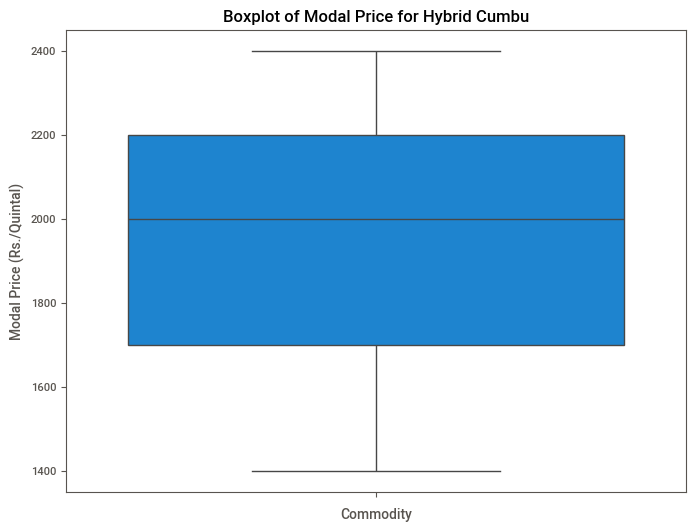

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


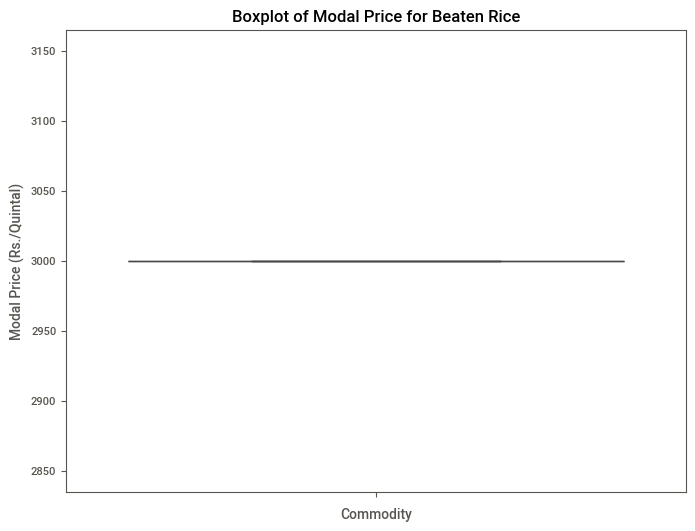

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


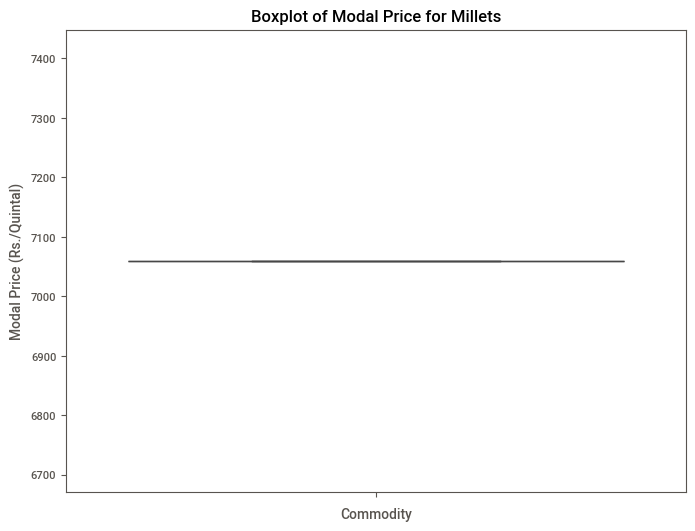

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame

# Get unique commodities
commodities = df['Commodity'].unique()

# Loop through commodities and create boxplots
for commodity in commodities:
    # Filter data for the current commodity
    commodity_data = df[df['Commodity'] == commodity]

    # Create a boxplot for the current commodity
    plt.figure(figsize=(8, 6))  # Adjust figure size as needed
    sns.boxplot(y='Modal Price (Rs./Quintal)', data=commodity_data)
    plt.title(f'Boxplot of Modal Price for {commodity}')
    plt.xlabel('Commodity')
    plt.ylabel('Modal Price (Rs./Quintal)')
    plt.show()

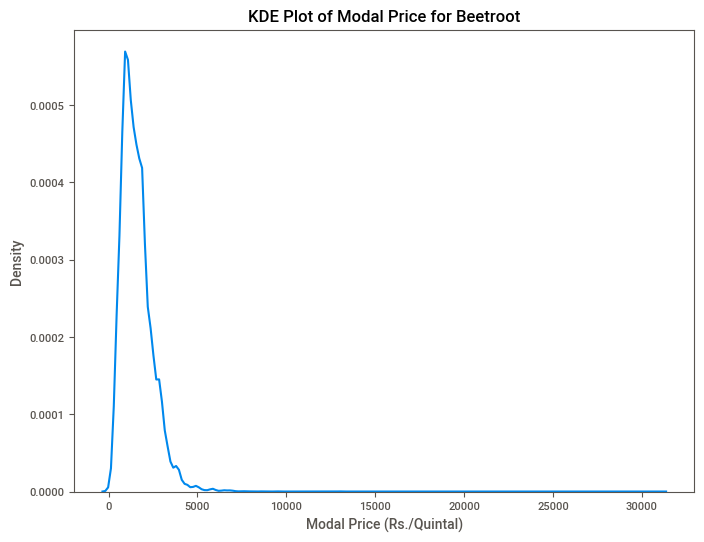

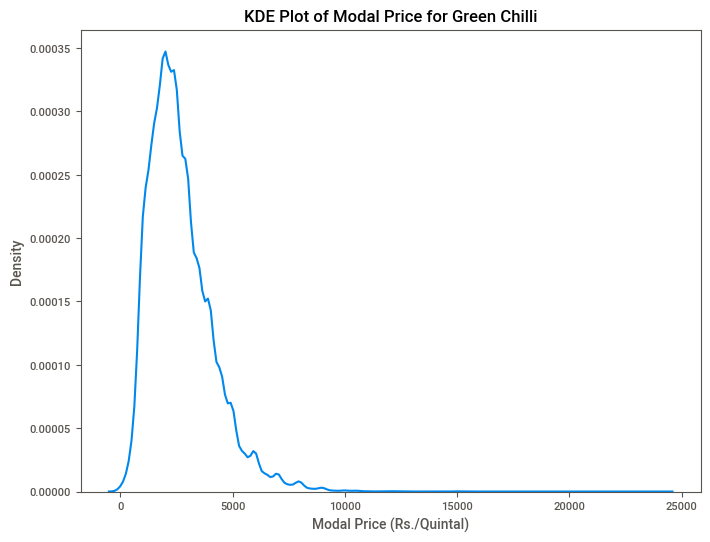

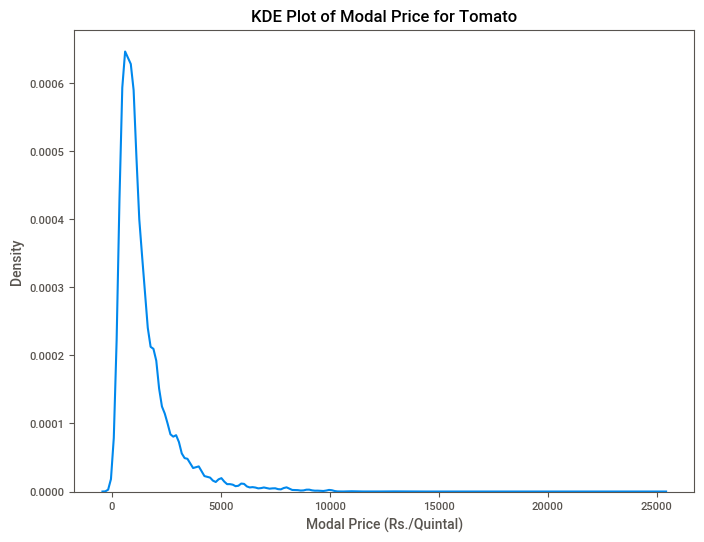

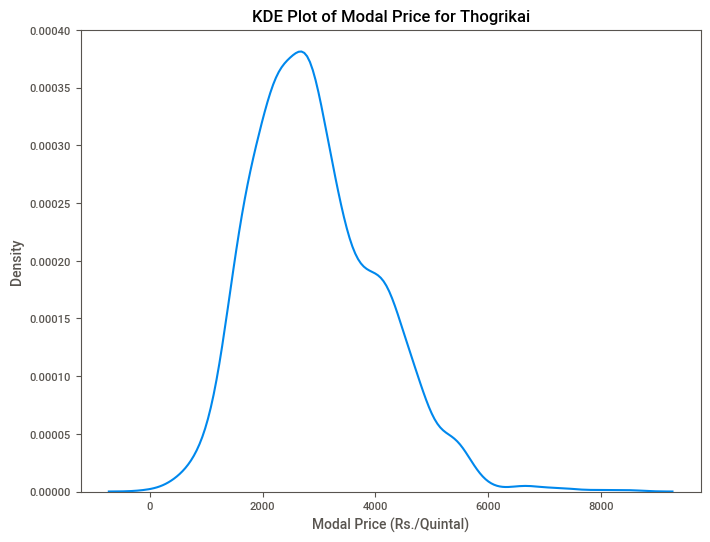

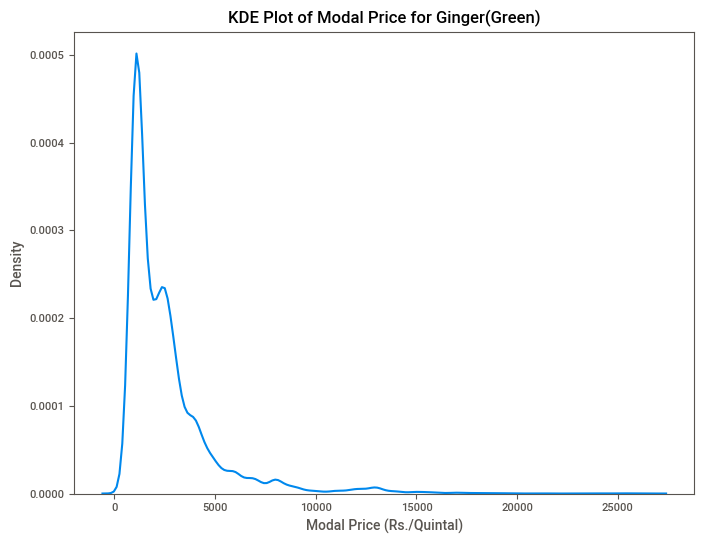

...

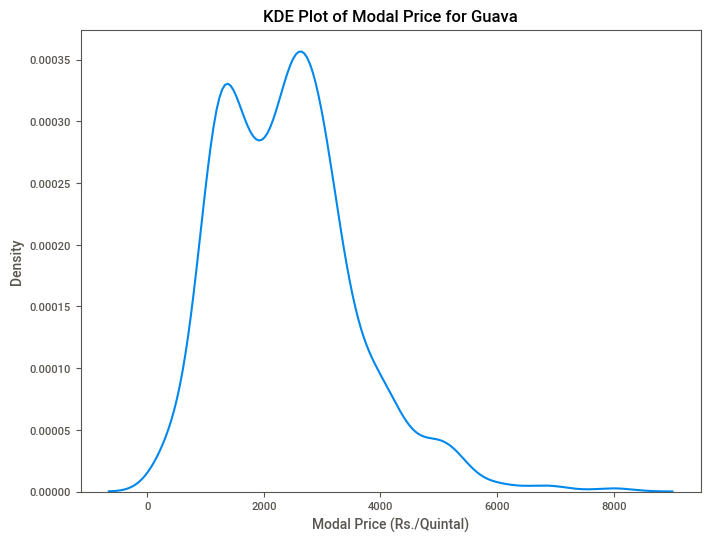

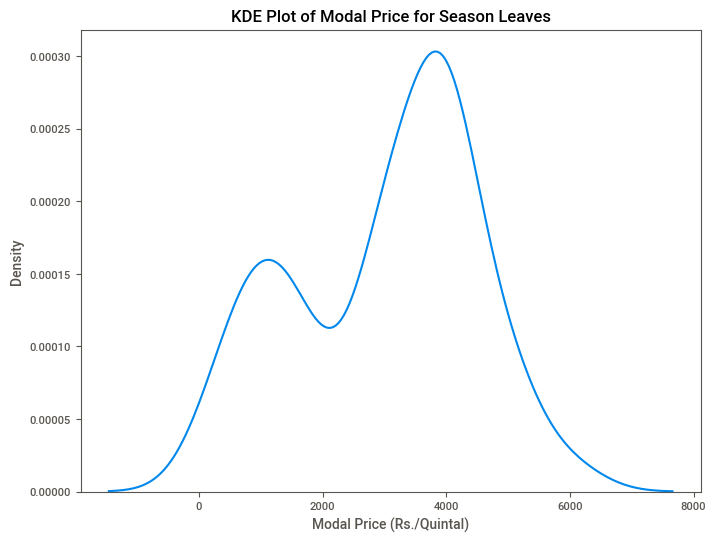

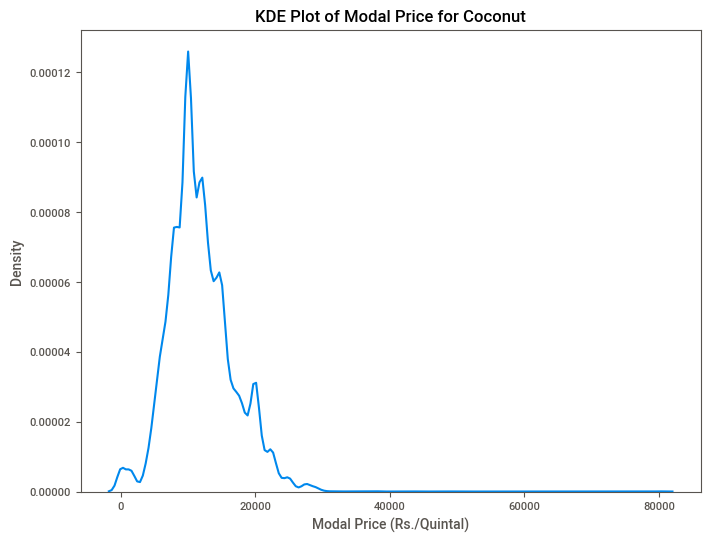

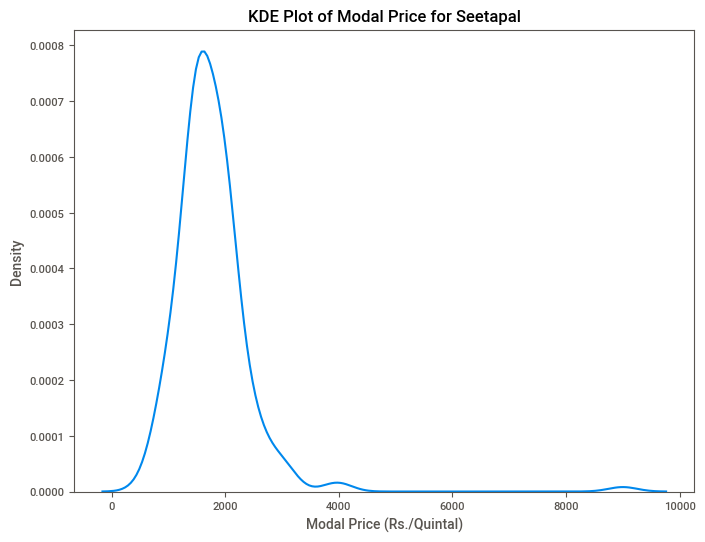

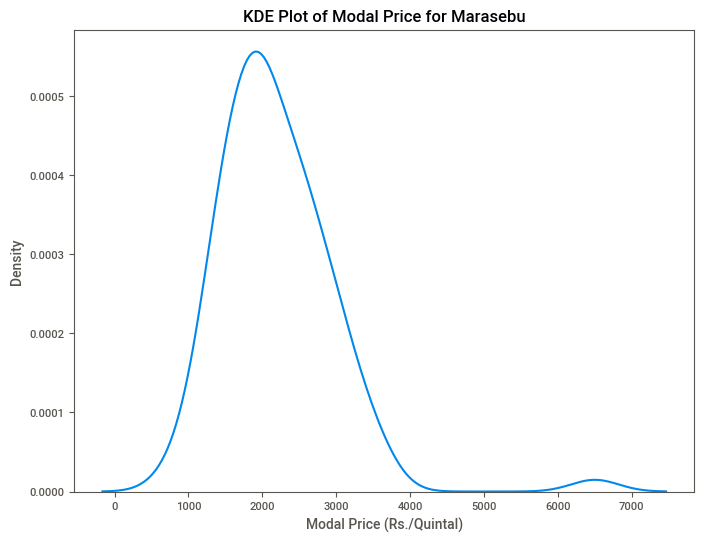

<ipython-input-111-1ef4dc406a0c>:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x='Modal Price (Rs./Quintal)', data=commodity_data)


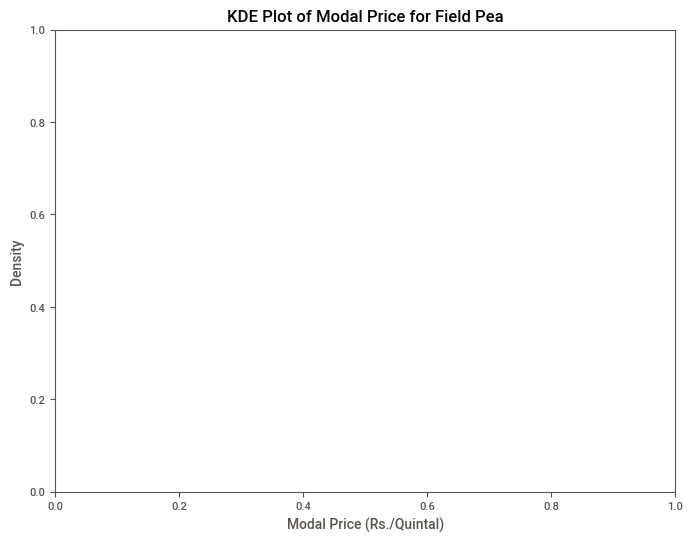

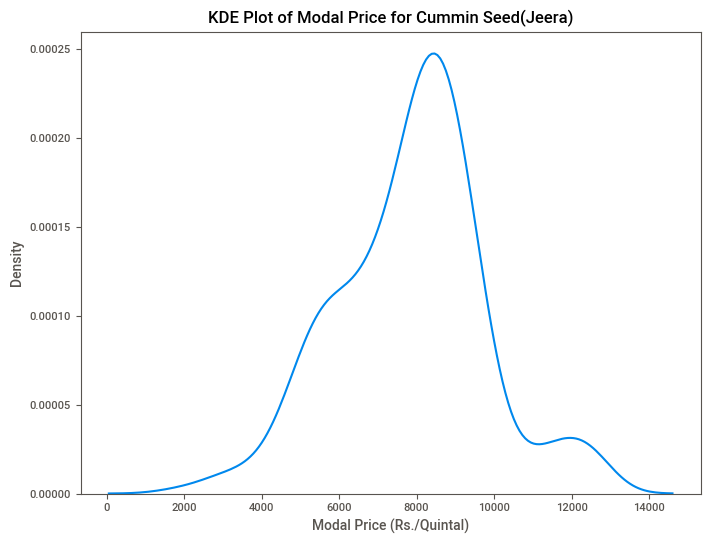

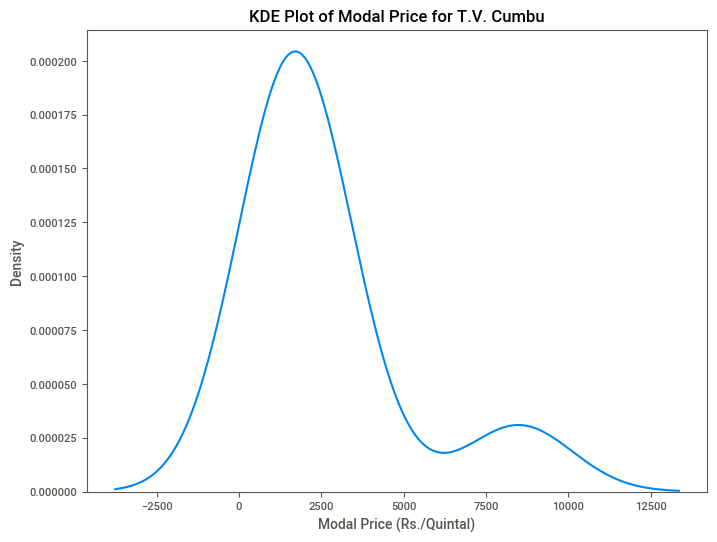

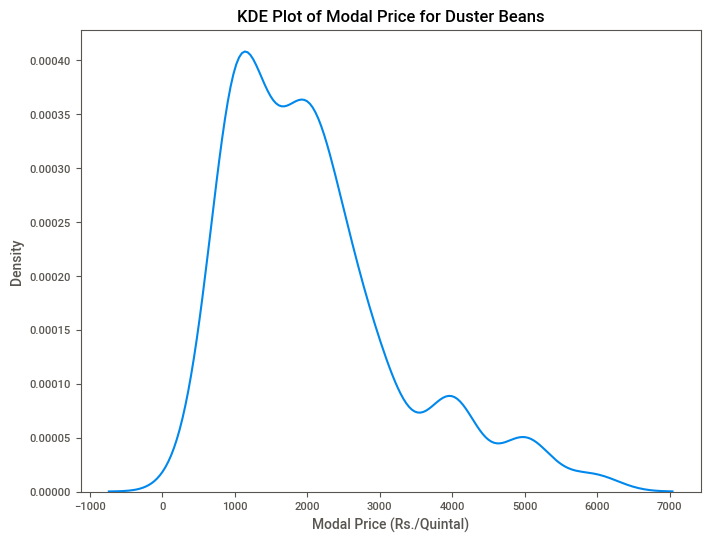

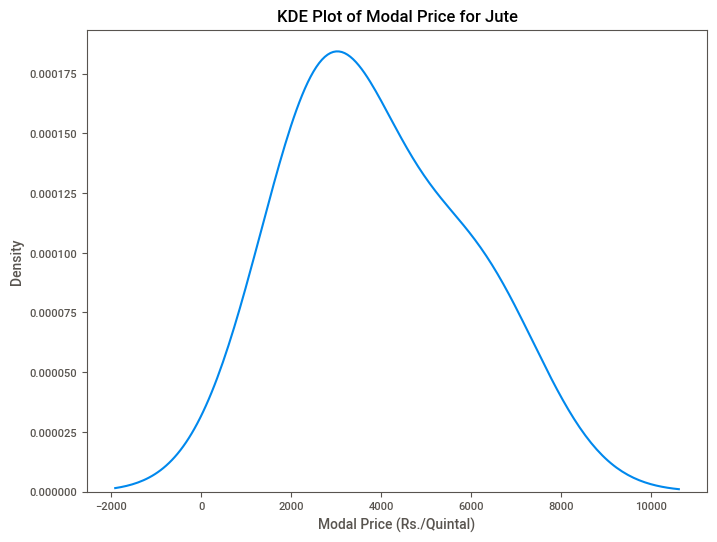

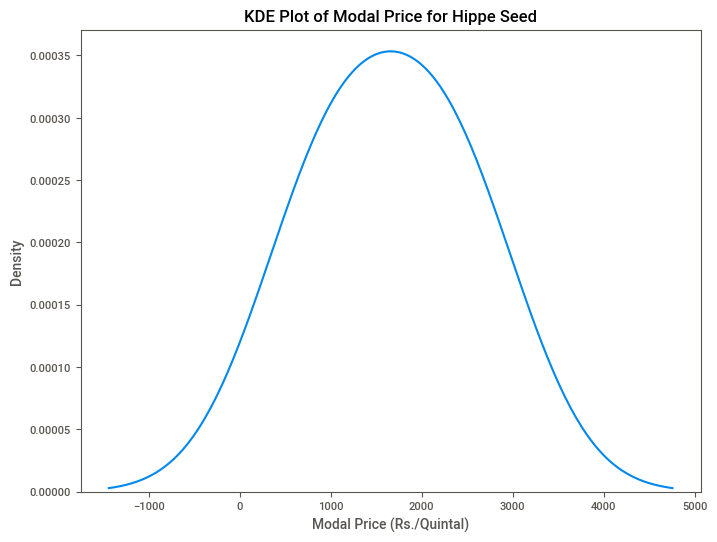

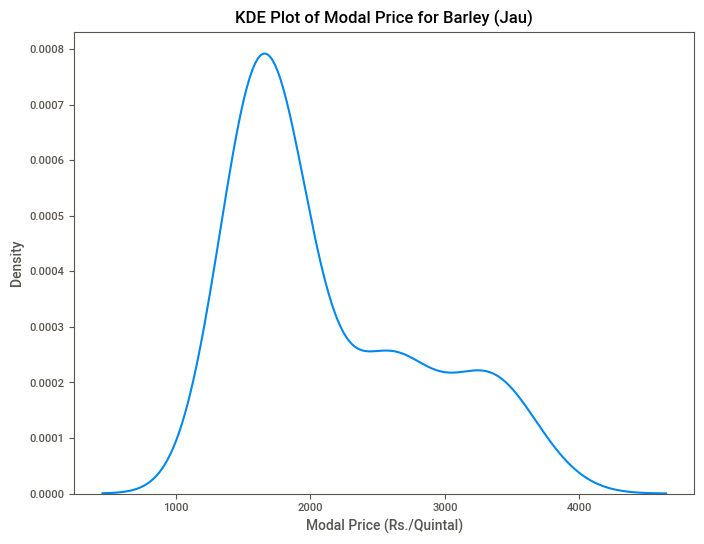

<ipython-input-111-1ef4dc406a0c>:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x='Modal Price (Rs./Quintal)', data=commodity_data)


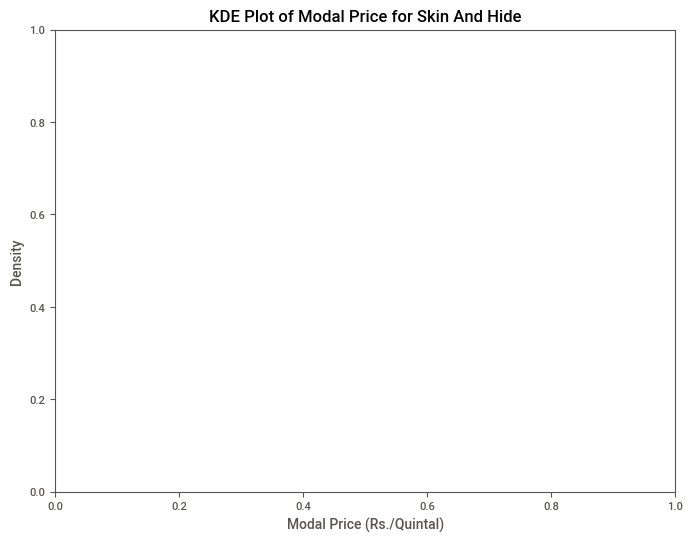

<ipython-input-111-1ef4dc406a0c>:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x='Modal Price (Rs./Quintal)', data=commodity_data)


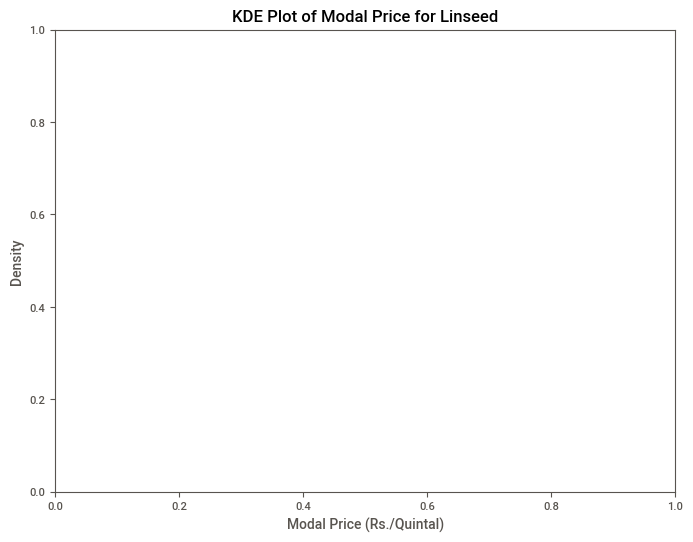

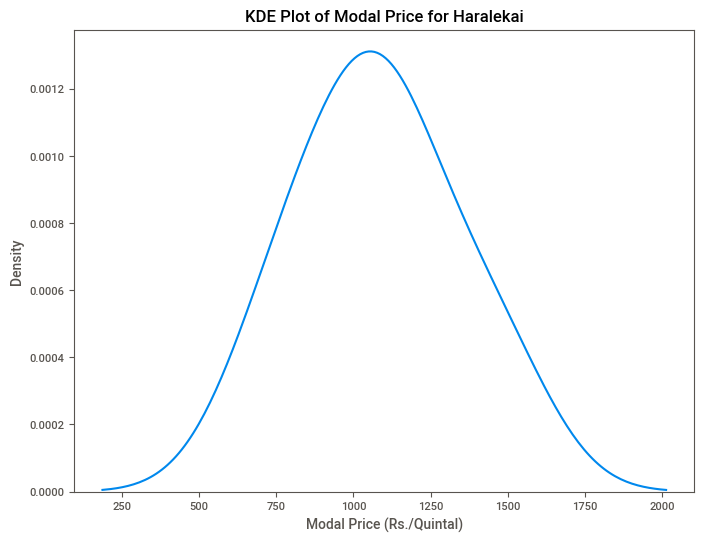

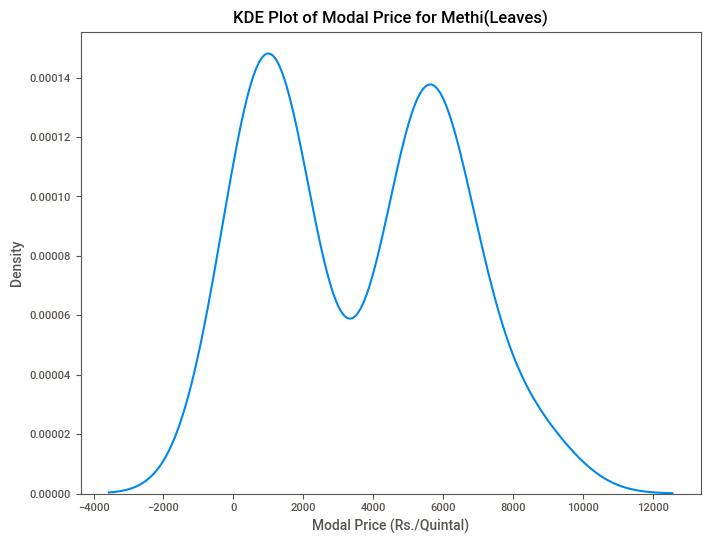

<ipython-input-111-1ef4dc406a0c>:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x='Modal Price (Rs./Quintal)', data=commodity_data)


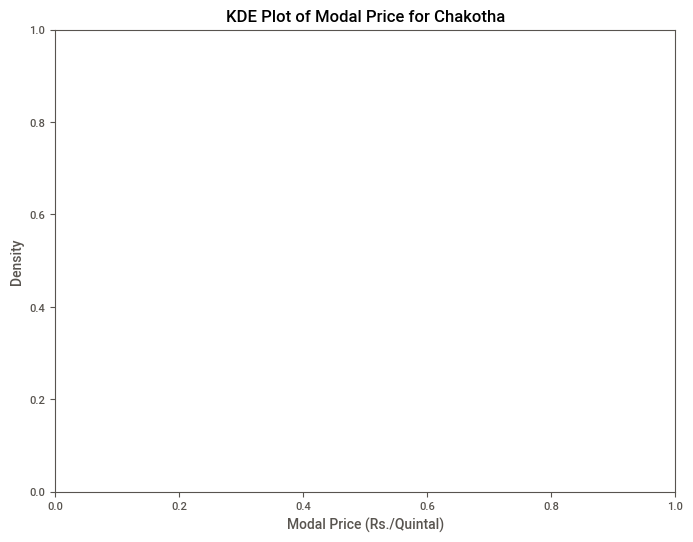

<ipython-input-111-1ef4dc406a0c>:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x='Modal Price (Rs./Quintal)', data=commodity_data)


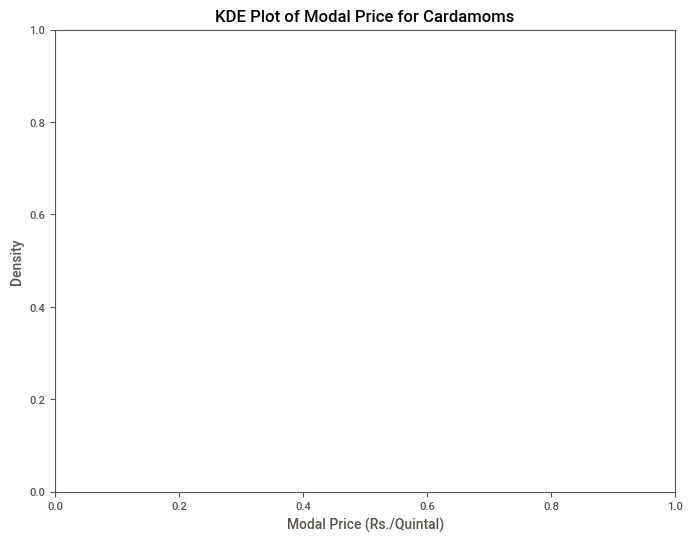

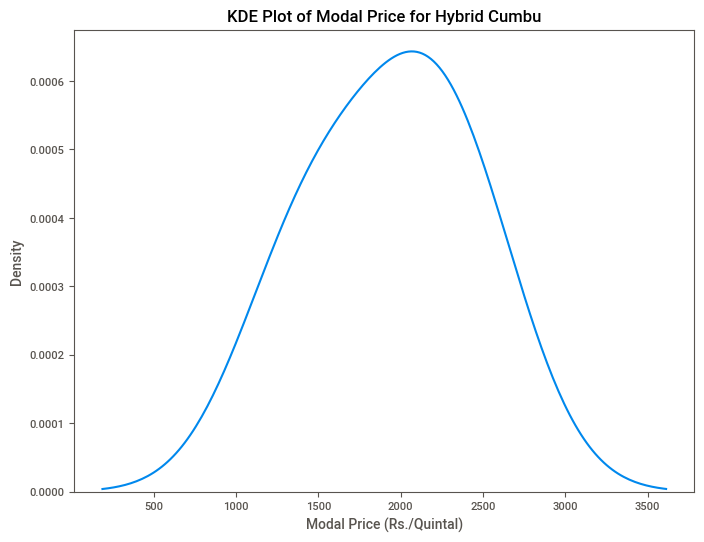

<ipython-input-111-1ef4dc406a0c>:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x='Modal Price (Rs./Quintal)', data=commodity_data)


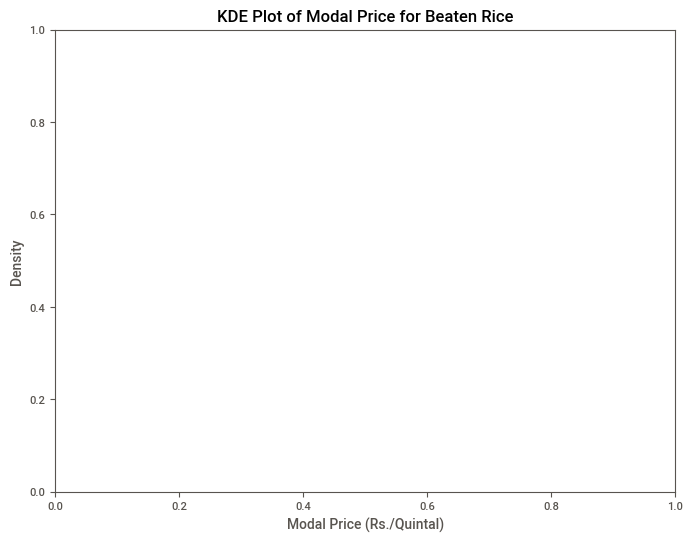

<ipython-input-111-1ef4dc406a0c>:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x='Modal Price (Rs./Quintal)', data=commodity_data)


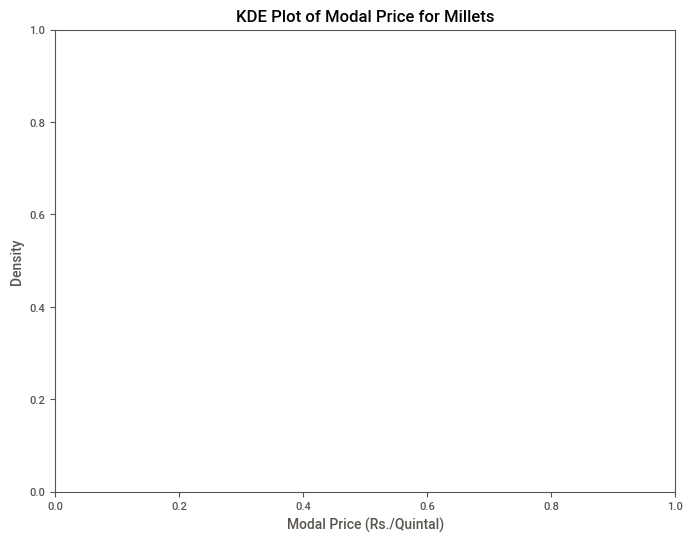

In [ ]:
for commodity in commodities:
    # Filter data for the current commodity
    commodity_data = df[df['Commodity'] == commodity]

    # Create a KDE plot for the current commodity
    plt.figure(figsize=(8, 6))  # Adjust figure size as needed
    sns.kdeplot(x='Modal Price (Rs./Quintal)', data=commodity_data)
    plt.title(f'KDE Plot of Modal Price for {commodity}')
    plt.xlabel('Modal Price (Rs./Quintal)')
    plt.ylabel('Density')
    plt.show()

<Axes: xlabel='Day'>

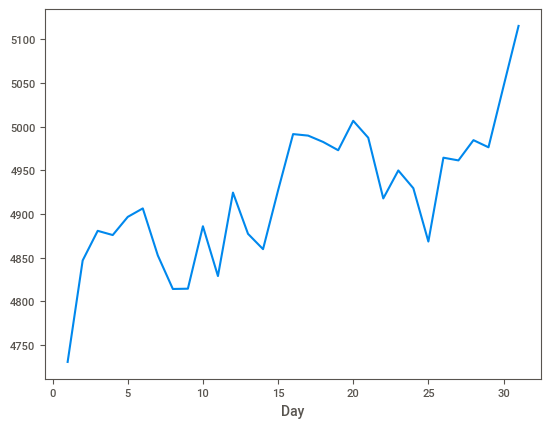

In [ ]:
df.groupby('Day')['Modal Price (Rs./Quintal)'].mean().plot()

<Axes: xlabel='Month'>

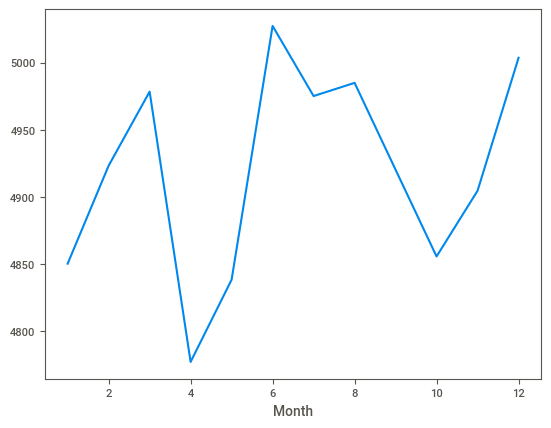

In [ ]:
df.groupby('Month')['Modal Price (Rs./Quintal)'].mean().plot()

<Axes: xlabel='Season'>

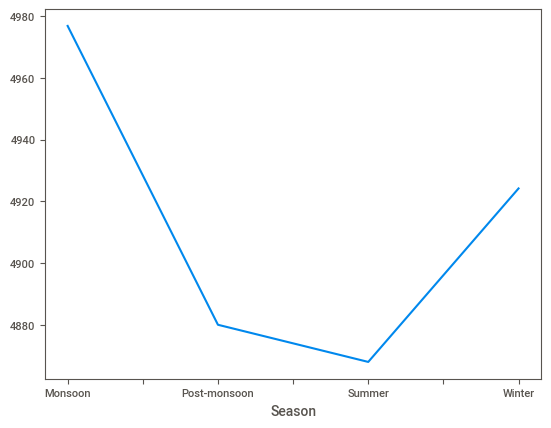

In [ ]:
df.groupby('Season')['Modal Price (Rs./Quintal)'].mean().plot()

<Axes: xlabel='Year'>

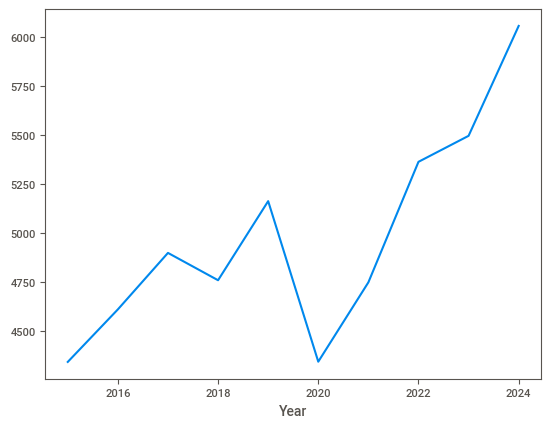

In [ ]:
df.groupby('Year')['Modal Price (Rs./Quintal)'].mean().plot()

In [ ]:
df.head(2)

,Price Date,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,Day,Season
0,2015-01-01,Hassan,Hassan,Beetroot,Beetroot,FAQ,900.0,1000.0,1000.0,2015,1,1,Winter
1,2015-01-01,Chikmagalur,Bagepalli,Green Chilli,Green Chilly,FAQ,1500.0,2000.0,1800.0,2015,1,1,Winter


<Axes: xlabel='District Name'>

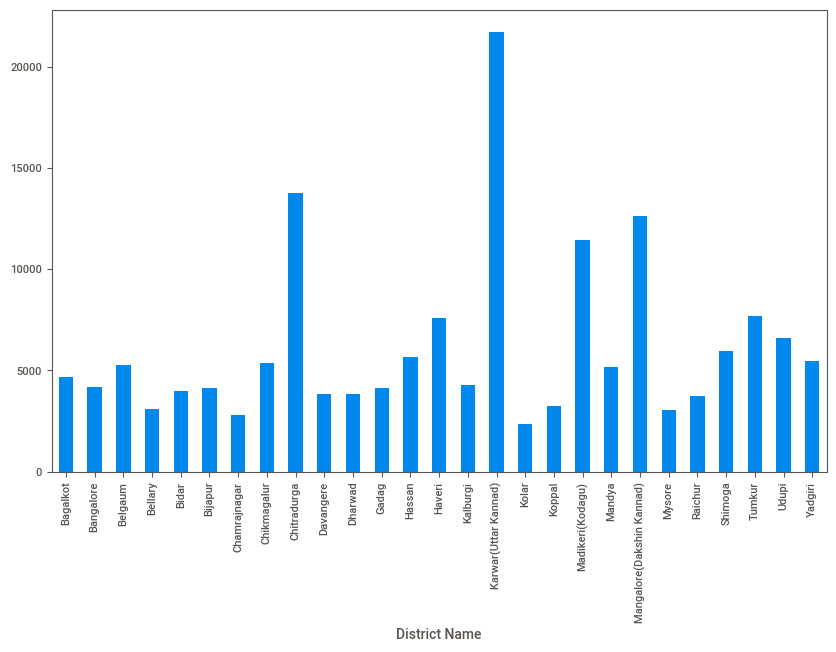

In [ ]:
district_prices = df.groupby('District Name')['Modal Price (Rs./Quintal)'].mean()
district_prices.plot(kind='bar', figsize=(10, 6))

<Axes: xlabel='Market Name'>

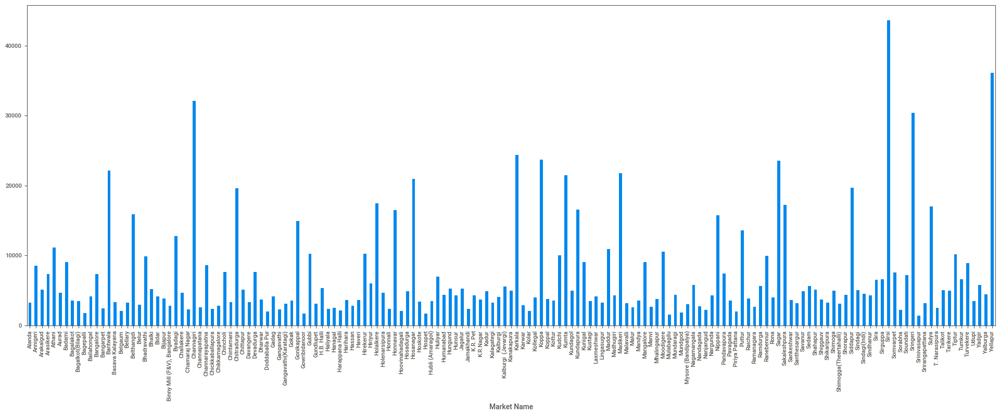

In [ ]:
market_price = df.groupby('Market Name')['Modal Price (Rs./Quintal)'].mean()
market_price.plot(kind='bar', figsize=(24, 8))

<Axes: >

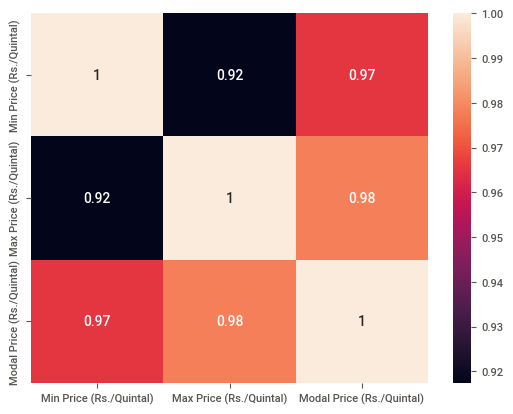

In [ ]:
correlation_matrix = df[['Min Price (Rs./Quintal)', 'Max Price (Rs./Quintal)', 'Modal Price (Rs./Quintal)']].corr()
sns.heatmap(correlation_matrix, annot=True)


In [ ]:
Q1 = df['Modal Price (Rs./Quintal)'].quantile(0.25)
Q3 = df['Modal Price (Rs./Quintal)'].quantile(0.75)
IQR = Q3 - Q1
outliers = df[(df['Modal Price (Rs./Quintal)'] < (Q1 - 1.5 * IQR)) | (df['Modal Price (Rs./Quintal)'] > (Q3 + 1.5 * IQR))]


In [ ]:
outliers

,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,Day,Season
Price Date,,,,,,,,,,,,
2015-01-01,Bangalore,Bangalore,Corriander seed,Coriander Seed,FAQ,11500.0,19000.0,15250.0,2015,1,1,Winter
2015-01-01,Udupi,Karkala,Arecanut(Betelnut/Supari),New Variety,FAQ,12000.0,20000.0,18000.0,2015,1,1,Winter
2015-01-01,Mangalore(Dakshin Kannad),Mangalore,Black pepper,Other,FAQ,37500.0,67500.0,55000.0,2015,1,1,Winter
2015-01-01,Bangalore,Bangalore,Dry Chillies,Byadgi,FAQ,16000.0,19000.0,17200.0,2015,1,1,Winter
2015-01-01,Mysore,Mysore (Bandipalya),Green Gram Dal (Moong Dal),Green Gram Dal,FAQ,10500.0,11000.0,10750.0,2015,1,1,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-04,Chitradurga,Chitradurga,Arecanut(Betelnut/Supari),Bette,FAQ,32600.0,33000.0,32800.0,2024,10,4,Post-monsoon
2024-10-04,Shimoga,Hosanagar,Arecanut(Betelnut/Supari),Rashi,FAQ,44629.0,49572.0,48229.0,2024,10,4,Post-monsoon
2024-10-04,Shimoga,Hosanagar,Arecanut(Betelnut/Supari),Kempugotu,FAQ,25899.0,28899.0,27299.0,2024,10,4,Post-monsoon


In [ ]:
lower_bound =  Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [ ]:
print(lower_bound)
print(upper_bound)

-3945.0
10575.0


<Axes: xlabel='Commodity'>

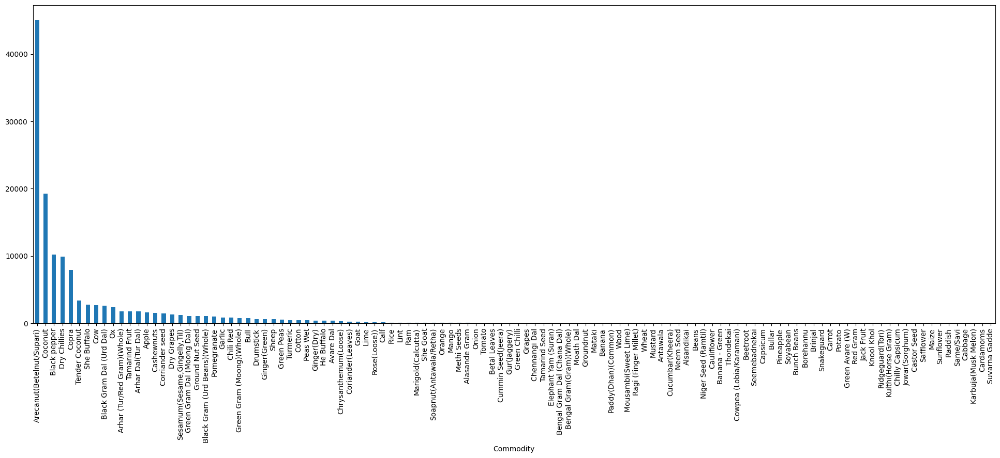

In [ ]:
outliers['Commodity'].value_counts().plot(kind = 'bar',figsize = (24,8))

<Figure size 2400x800 with 0 Axes>

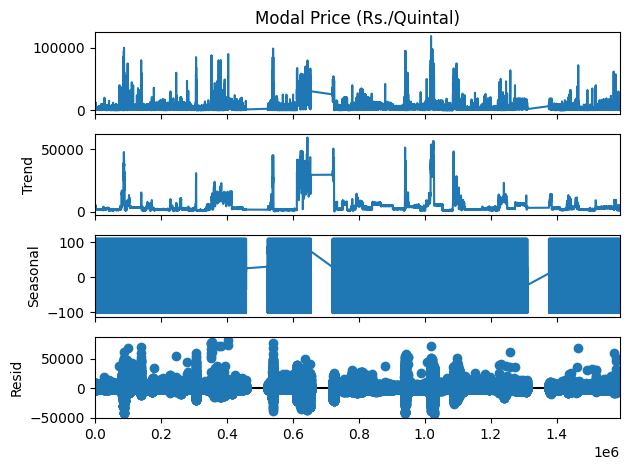

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
plt.figure(figsize=(24,8))
decomposition = seasonal_decompose(df['Modal Price (Rs./Quintal)'], model='additive', period=365)
decomposition.plot()
plt.show()


In [ ]:
df.shape

(1394662, 12)

In [ ]:
commodity_price = df.groupby('Commodity')['Modal Price (Rs./Quintal)'].mean().sort_values(ascending = False)

<Axes: xlabel='Commodity'>

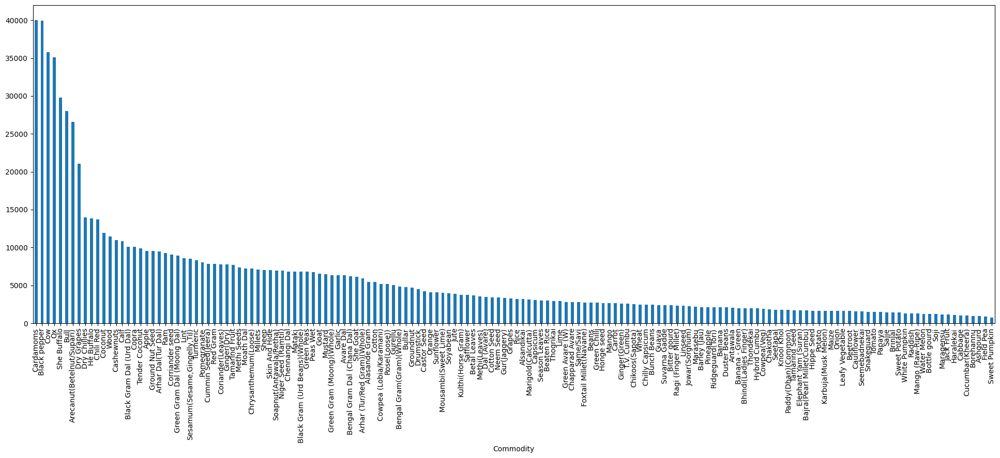

In [ ]:
commodity_price.plot(kind = 'bar',figsize = (24,8))

In [ ]:
df['Commodity'].unique()

array(['Tomato', 'Foxtail Millet(Navane)', 'Groundnut', 'Sweet Potato',
       'Rice', 'Seemebadnekai', 'Alsandikai', 'Grapes', 'Maize', 'Wheat',
       'Sunflower', 'Onion', 'Tender Coconut', 'Ginger(Green)',
       'Paddy(Dhan)(Common)', 'Raddish', 'Snakeguard',
       'Arhar (Tur/Red Gram)(Whole)', 'Green Chilli', 'Carrot',
       'Soyabean', 'Jowar(Sorghum)', 'Banana', 'Black Gram Dal (Urd Dal)',
       'Bitter gourd', 'Thondekai', 'Green Gram (Moong)(Whole)', 'Potato',
       'Cowpea (Lobia/Karamani)', 'Beetroot', 'Karbuja(Musk Melon)',
       'Bajra(Pearl Millet/Cumbu)', 'Corriander seed',
       'Arecanut(Betelnut/Supari)', 'Kulthi(Horse Gram)',
       'Chilly Capsicum', 'Black pepper', 'Cabbage', 'Green Avare (W)',
       'Dry Chillies', 'Capsicum', 'Green Gram Dal (Moong Dal)', 'Cotton',
       'Knool Khol', 'Cauliflower', 'Brinjal', 'Chapparad Avare',
       'Cucumbar(Kheera)', 'Sheep', 'Copra', 'Water Melon', 'Beans',
       'Sesamum(Sesame,Gingelly,Til)', 'Papaya', 'Rose(Lo

In [ ]:
# Count the number of rows that match non-crop entries
non_crops_count = df[df['Commodity'].isin(non_crops)].shape[0]

print(f"Number of non-crop rows: {non_crops_count}")


Number of non-crop rows: 19265


In [ ]:
import pandas as pd
import numpy as np

# Assuming df is your DataFrame and it contains the 'Commodity' column
# List of non-crop entries to filter out
non_crops = ['Bull', 'Cow', 'Sheep', 'She Buffalo', 'Ox', 'Goat', 'She Goat',
             'Ram', 'He Buffalo', 'Calf', 'Skin And Hide', 'Wood']

# Filter out rows where the 'Commodity' column matches any of the non-crop entries
filtered_df = df[~df['Commodity'].isin(non_crops)]

# Now, filtered_df retains the original index (which should be the date index)



In [ ]:
filtered_df.shape

(1375397, 12)

<Axes: xlabel='Commodity'>

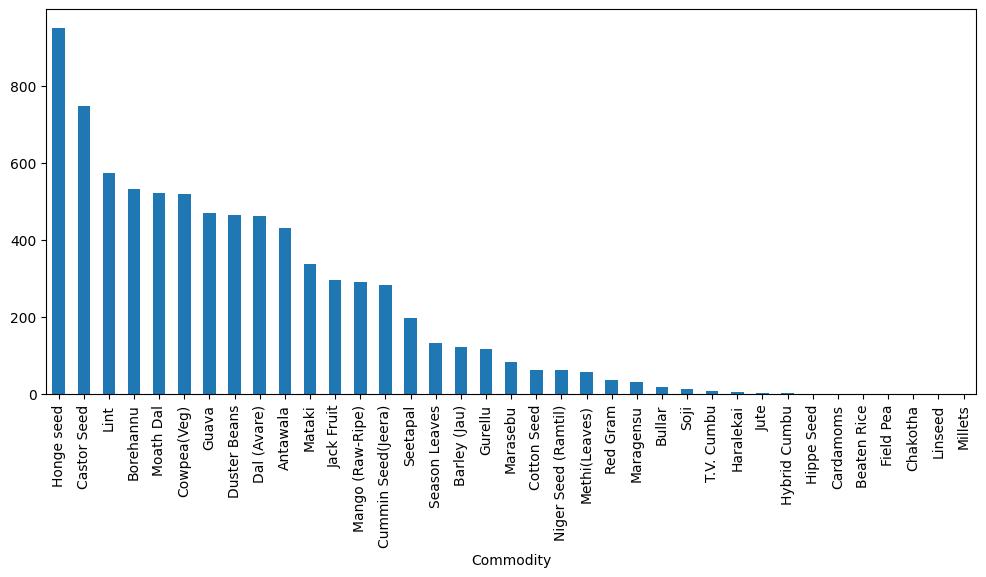

In [ ]:
# Instead of using value_counts() directly for filtering,
# first identify the commodities with counts less than 1000.
low_count_commodities = filtered_df['Commodity'].value_counts()[filtered_df['Commodity'].value_counts() < 1000].index

# Then, use isin() to filter the DataFrame based on these commodities.
filter_df_under_1000 = filtered_df[filtered_df['Commodity'].isin(low_count_commodities)]

# Now, filtered_df contains only the rows where the 'Commodity'
# value is among those with counts less than 1000
filter_df_under_1000['Commodity'].value_counts().plot(kind = 'bar',figsize=(12,5))


In [ ]:
filtered_df.shape

(1375397, 12)

In [ ]:
# Group by 'Commodity' and filter to keep only those with 1000 or more rows
filtered_df_commodity = filtered_df.groupby('Commodity').filter(lambda x: len(x) >= 1000)


In [ ]:
filtered_df.shape

(1375397, 12)

In [ ]:
filtered_df_commodity.shape

(1367533, 12)

In [ ]:
filtered_df_commodity.head()

,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,Day,Season
Price Date,,,,,,,,,,,,
2015-01-01,Chikmagalur,Bagepalli,Tomato,Tomato,FAQ,500.0,700.0,600.0,2015,1,1,Winter
2015-01-01,Bangalore,Bangalore,Foxtail Millet(Navane),Other,FAQ,2200.0,3200.0,2700.0,2015,1,1,Winter
2015-01-01,Bangalore,Bangalore,Groundnut,Big (With Shell),FAQ,3000.0,3200.0,3100.0,2015,1,1,Winter
2015-01-01,Mysore,Mysore (Bandipalya),Sweet Potato,Sweet Potato,FAQ,600.0,700.0,650.0,2015,1,1,Winter
2015-01-01,Raichur,Sindhanur,Rice,Sarbati Raw,FAQ,1600.0,1600.0,1600.0,2015,1,1,Winter


In [ ]:
filtered_df_commodity.columns


Index(['District Name', 'Market Name', 'Commodity', 'Variety', 'Grade',
       'Min Price (Rs./Quintal)', 'Max Price (Rs./Quintal)',
       'Modal Price (Rs./Quintal)', 'Year', 'Month', 'Day', 'Season',
       'District_Market', 'Commodity_Variety'],
      dtype='object')

In [ ]:
import pandas as pd

def combine_unique_columns(df):
    # Make a copy of the DataFrame to avoid modifying the original one
    df_copy = df.copy()

    # Function to combine names uniquely
    def combine_unique(col1, col2):
        if col1 == col2:
            return col1  # Return only one name if they are the same
        return f"{col1} - {col2}"  # Combine with a separator if different

    # Create new columns without altering the index
    df_copy['District_Market'] = df_copy.apply(lambda row: combine_unique(row['District Name'], row['Market Name']), axis=1)
    df_copy['Commodity_Variety'] = df_copy.apply(lambda row: combine_unique(row['Commodity'], row['Variety']), axis=1)

    return df_copy  # Return the modified DataFrame

# Usage
# Load your dataset with a date-time index
# df = pd.read_csv('your_dataset.csv', index_col='Your_Date_Column', parse_dates=True)



df_new = combine_unique_columns(filtered_df_commodity)


In [ ]:
import pandas as pd

def set_date_index(df):
    # Create a new 'Date' column by combining Year, Month, and Day
    df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])

    # Set the 'Date' column as the index
    df.set_index('Date', inplace=True)

    # Optionally, drop the Year, Month, and Day columns if no longer needed
    df.drop(columns=['Year', 'Month', 'Day'], inplace=True)

    return df

# Usage
# Load your dataset
# df = pd.read_csv('your_dataset.csv')  # Load your dataset
df_final = set_date_index(df_new)

# Check the new index


In [ ]:
new_df.shape

(1367533, 14)

In [ ]:
df_final.head(2)

,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Season,District_Market,Commodity_Variety
Date,,,,,,,,,,,
2015-01-01,Chikmagalur,Bagepalli,Tomato,Tomato,FAQ,500.0,700.0,600.0,Winter,Chikmagalur - Bagepalli,Tomato
2015-01-01,Bangalore,Bangalore,Foxtail Millet(Navane),Other,FAQ,2200.0,3200.0,2700.0,Winter,Bangalore,Foxtail Millet(Navane) - Other


In [ ]:
feature_selected_df = df_final[['Min Price (Rs./Quintal)','Max Price (Rs./Quintal)','Modal Price (Rs./Quintal)','Season','District_Market','Commodity_Variety']]

In [ ]:
feature_selected_df.shape

(1367533, 6)

In [ ]:
feature_selected_df.head()

,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Season,District_Market,Commodity_Variety
Date,,,,,,
2015-01-01,500.0,700.0,600.0,Winter,Chikmagalur - Bagepalli,Tomato
2015-01-01,2200.0,3200.0,2700.0,Winter,Bangalore,Foxtail Millet(Navane) - Other
2015-01-01,3000.0,3200.0,3100.0,Winter,Bangalore,Groundnut - Big (With Shell)
2015-01-01,600.0,700.0,650.0,Winter,Mysore - Mysore (Bandipalya),Sweet Potato
2015-01-01,1600.0,1600.0,1600.0,Winter,Raichur - Sindhanur,Rice - Sarbati Raw


In [ ]:
# Assuming feature_selected_df is your DataFrame
feature_selected_df.to_csv('feature_selected_data_agriculture.csv', index=True)


In [ ]:
from google.colab import files

# Download the CSV file
files.download('feature_selected_data_agriculture.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>